In [1]:
import numpy as np
import pandas as pd
import polars as pl
import sys
import re
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px


pd.set_option('display.max_columns',None)
import psycopg2


#to scale the data using z-score 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

#Algorithms to use
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

#Metrics to evaluate the model
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve

import warnings
warnings.filterwarnings("ignore")

#importing PCA and TSNE
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [64]:
df = pd.read_csv(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files_31_mody/COVERED_TSV/Covered_new/matched/output_concatenated.tsv', sep='\t')
df

,ID,INFO,CSQ,Zygosity,Matched_Gene,Sample_Name
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700
1,rs5506,"ADP=144;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.06609,...",G|intron_variant|MODIFIER|INS|ENSG00000254647|...,HOM,INS,12652700
2,rs5213,ADP=143;WT=0;HET=0;HOM=1;NC=0;ASP;G5;GENEINFO=...,T|3_prime_UTR_variant|MODIFIER|KCNJ11|ENSG0000...,HOM,KCNJ11,12652700
3,rs5215,"ADP=371;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.2694,0...",T|missense_variant|MODERATE|KCNJ11|ENSG0000018...,HOM,KCNJ11,12652700
4,rs5219,"ADP=58;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.263,.,0...",C|downstream_gene_variant|MODIFIER|ABCC8|ENSG0...,HOM,KCNJ11,12652700
...,...,...,...,...,...,...
2283,rs2898289,"ADP=67;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.5347,0....",A|intron_variant|MODIFIER|BLK|ENSG00000136573|...,HET,BLK,19532336
2284,rs62490888,"ADP=185;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.9249,0...",A|intron_variant|MODIFIER|BLK|ENSG00000136573|...,HET,BLK,19532336
2285,rs4841561,"ADP=193;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.496,.,...",T|intron_variant|MODIFIER|BLK|ENSG00000136573|...,HET,BLK,19532336
2286,rs1042689,"ADP=40;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.4429,.,...",T|3_prime_UTR_variant|MODIFIER|BLK|ENSG0000013...,HET,BLK,19532336


In [65]:
genes_to_drop = ['HLA-DQB1', 'HLA-DRB1', 'HLA-DQA1']
data = df[~df['Matched_Gene'].isin(genes_to_drop)]
df_new = data[['Sample_Name', 'ID', 'Zygosity', 'Matched_Gene', 'CSQ']]
df_new

,Sample_Name,ID,Zygosity,Matched_Gene,CSQ
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...
1,12652700,rs5506,HOM,INS,G|intron_variant|MODIFIER|INS|ENSG00000254647|...
2,12652700,rs5213,HOM,KCNJ11,T|3_prime_UTR_variant|MODIFIER|KCNJ11|ENSG0000...
3,12652700,rs5215,HOM,KCNJ11,T|missense_variant|MODERATE|KCNJ11|ENSG0000018...
4,12652700,rs5219,HOM,KCNJ11,C|downstream_gene_variant|MODIFIER|ABCC8|ENSG0...
...,...,...,...,...,...
2283,19532336,rs2898289,HET,BLK,A|intron_variant|MODIFIER|BLK|ENSG00000136573|...
2284,19532336,rs62490888,HET,BLK,A|intron_variant|MODIFIER|BLK|ENSG00000136573|...
2285,19532336,rs4841561,HET,BLK,T|intron_variant|MODIFIER|BLK|ENSG00000136573|...
2286,19532336,rs1042689,HET,BLK,T|3_prime_UTR_variant|MODIFIER|BLK|ENSG0000013...


In [66]:
df_new['gnomADg_AF'] = df_new['CSQ'].str.split('|').str[57]
df_new['gnomADg_SAS_AF'] = df_new['CSQ'].str.split('|').str[67]
df_new

,Sample_Name,ID,Zygosity,Matched_Gene,CSQ,gnomADg_AF,gnomADg_SAS_AF
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309
1,12652700,rs5506,HOM,INS,G|intron_variant|MODIFIER|INS|ENSG00000254647|...,0.9381,0.999
2,12652700,rs5213,HOM,KCNJ11,T|3_prime_UTR_variant|MODIFIER|KCNJ11|ENSG0000...,0.7176,0.6275
3,12652700,rs5215,HOM,KCNJ11,T|missense_variant|MODERATE|KCNJ11|ENSG0000018...,0.7075,0.6253
4,12652700,rs5219,HOM,KCNJ11,C|downstream_gene_variant|MODIFIER|ABCC8|ENSG0...,0.7139,0.6268
...,...,...,...,...,...,...,...
2283,19532336,rs2898289,HET,BLK,A|intron_variant|MODIFIER|BLK|ENSG00000136573|...,0.3612,0.4647
2284,19532336,rs62490888,HET,BLK,A|intron_variant|MODIFIER|BLK|ENSG00000136573|...,0.1054,0.14
2285,19532336,rs4841561,HET,BLK,T|intron_variant|MODIFIER|BLK|ENSG00000136573|...,0.3992,0.4694
2286,19532336,rs1042689,HET,BLK,T|3_prime_UTR_variant|MODIFIER|BLK|ENSG0000013...,0.437,0.5066


In [62]:
df_new = df_new[['Sample_Name', 'ID', 'Zygosity', 'Matched_Gene', 'gnomADg_AF', 'gnomADg_SAS_AF']]
df_new

,Sample_Name,ID,Zygosity,Matched_Gene,gnomADg_AF,gnomADg_SAS_AF
0,12652700,rs3842753,HOM,INS,0.6105,0.8309
1,12652700,rs5506,HOM,INS,0.9381,0.999
2,12652700,rs5213,HOM,KCNJ11,0.7176,0.6275
3,12652700,rs5215,HOM,KCNJ11,0.7075,0.6253
4,12652700,rs5219,HOM,KCNJ11,0.7139,0.6268
...,...,...,...,...,...,...
2283,19532336,rs2898289,HET,BLK,0.3612,0.4647
2284,19532336,rs62490888,HET,BLK,0.1054,0.14
2285,19532336,rs4841561,HET,BLK,0.3992,0.4694
2286,19532336,rs1042689,HET,BLK,0.437,0.5066


In [63]:
df_new.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/1099_rows_31_samples.xlsx', index=False)

In [67]:
df_new_1 = df_new.copy()
df_new_1

,Sample_Name,ID,Zygosity,Matched_Gene,CSQ,gnomADg_AF,gnomADg_SAS_AF
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309
1,12652700,rs5506,HOM,INS,G|intron_variant|MODIFIER|INS|ENSG00000254647|...,0.9381,0.999
2,12652700,rs5213,HOM,KCNJ11,T|3_prime_UTR_variant|MODIFIER|KCNJ11|ENSG0000...,0.7176,0.6275
3,12652700,rs5215,HOM,KCNJ11,T|missense_variant|MODERATE|KCNJ11|ENSG0000018...,0.7075,0.6253
4,12652700,rs5219,HOM,KCNJ11,C|downstream_gene_variant|MODIFIER|ABCC8|ENSG0...,0.7139,0.6268
...,...,...,...,...,...,...,...
2283,19532336,rs2898289,HET,BLK,A|intron_variant|MODIFIER|BLK|ENSG00000136573|...,0.3612,0.4647
2284,19532336,rs62490888,HET,BLK,A|intron_variant|MODIFIER|BLK|ENSG00000136573|...,0.1054,0.14
2285,19532336,rs4841561,HET,BLK,T|intron_variant|MODIFIER|BLK|ENSG00000136573|...,0.3992,0.4694
2286,19532336,rs1042689,HET,BLK,T|3_prime_UTR_variant|MODIFIER|BLK|ENSG0000013...,0.437,0.5066


In [68]:
df_new_1['csq'] = df_new_1['CSQ'].str.split(',')
df_new_1 = df_new_1.explode('csq')
df_new_1

,Sample_Name,ID,Zygosity,Matched_Gene,CSQ,gnomADg_AF,gnomADg_SAS_AF,csq
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
...,...,...,...,...,...,...,...,...
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|regulatory_region_variant|MODIFIER|||Regulat...
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|regulatory_region_variant|MODIFIER|||Regulat...


In [69]:
df_new_1['CLIN_SIG'] = df_new_1['csq'].str.split('|').str[70]
df_new_1['Consequence'] = df_new_1['csq'].str.split('|').str[1]
df_new_1['IMPACT'] = df_new_1['csq'].str.split('|').str[2]
df_new_1['EXON'] = df_new_1['csq'].str.split('|').str[8]
df_new_1['INTRON'] = df_new_1['csq'].str.split('|').str[9]
df_new_1['HGVSC'] = df_new_1['csq'].str.split('|').str[10]
df_new_1['HGVSP'] = df_new_1['csq'].str.split('|').str[11]
#df_new_1['cDNA_position'] = df_new_1['csq'].str.split('|').str[12]
df_new_1['Protein_position'] = df_new_1['csq'].str.split('|').str[14]
df_new_1['Amino_acids'] = df_new_1['csq'].str.split('|').str[15]
df_new_1['Codons'] = df_new_1['csq'].str.split('|').str[16]
df_new_1['SIFT'] = df_new_1['csq'].str.split('|').str[37]
df_new_1['PolyPhen'] = df_new_1['csq'].str.split('|').str[38]
df_new_1

,Sample_Name,ID,Zygosity,Matched_Gene,CSQ,gnomADg_AF,gnomADg_SAS_AF,csq,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,Protein_position,Amino_acids,Codons,SIFT,PolyPhen
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,benign,3_prime_UTR_variant,MODIFIER,3/3,,ENST00000250971.7:c.*22A>C,,,,,,
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|regulatory_region_variant|MODIFIER|||Regulat...,benign,regulatory_region_variant,MODIFIER,,,,,,,,,
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|regulatory_region_variant|MODIFIER|||Regulat...,benign,regulatory_region_variant,MODIFIER,,,,,,,,,


In [70]:
grouped_data = df_new_1.groupby(['Sample_Name', 'ID', 'Zygosity', 'Matched_Gene']).agg(lambda x: ', '.join(x.unique())).reset_index()
grouped_data

,Sample_Name,ID,Zygosity,Matched_Gene,CSQ,gnomADg_AF,gnomADg_SAS_AF,csq,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,Protein_position,Amino_acids,Codons,SIFT,PolyPhen
0,12652700,rs10400389,HET,ABCC8,T|intron_variant|MODIFIER|ABCC8|ENSG0000000607...,0.4382,0.2907,T|intron_variant|MODIFIER|ABCC8|ENSG0000000607...,benign,"intron_variant, intron_variant&non_coding_tran...",MODIFIER,", 3/3","3/38, 3/33, 3/11, 3/30, 3/12, , 3/35, 3/37, 3/...","ENST00000302539.9:c.412+77G>A, ENST00000389817...",,,,,,
1,12652700,rs1057520291,HET,HNF1A,T|stop_gained|HIGH|HNF1A|ENSG00000135100|Trans...,,,T|stop_gained|HIGH|HNF1A|ENSG00000135100|Trans...,pathogenic,"stop_gained, non_coding_transcript_exon_varian...","HIGH, MODIFIER","2/10, 2/7, 2/6, , 2/9",", 1/1, 1/8, 1/2","ENST00000257555.11:c.511C>T, ENST00000400024.6...","ENSP00000257555.5:p.Arg171Ter, ENSP00000476181...","171, , 219","R/*,","Cga/Tga,",,
2,12652700,rs11687357,HOM,KLF11,T|synonymous_variant|LOW|KLF11|ENSG00000172059...,0.825,0.8238,T|synonymous_variant|LOW|KLF11|ENSG00000172059...,benign,"synonymous_variant, downstream_gene_variant, r...","LOW, MODIFIER","3/4,",,"ENST00000305883.6:c.1185A>T, , ENST00000535335...","ENSP00000307023.1:p.Val395%3D, , ENSP000004427...","395, , 378","V,","gtA/gtT,",,
3,12652700,rs1169304,HET,HNF1A,C|intron_variant|MODIFIER|HNF1A|ENSG0000013510...,0.7595,0.8426,C|intron_variant|MODIFIER|HNF1A|ENSG0000013510...,not_provided&benign,"intron_variant, downstream_gene_variant, intro...","MODIFIER, MODERATE",", 8/9","8/9, , 7/8","ENST00000257555.11:c.1623+29T>C, , ENST0000054...",", ENSP00000443112.1:p.Leu551Ser",", 551",", L/S",", tTg/tCg",", tolerated(0.28)",", unknown(0)"
4,12652700,rs1799854,HET,ABCC8,A|splice_polypyrimidine_tract_variant&splice_r...,0.372,0.3437,A|splice_polypyrimidine_tract_variant&splice_r...,benign&association,splice_polypyrimidine_tract_variant&splice_reg...,"LOW, MODIFIER",,"15/38, 13/33, , 15/30, 2/25, 1/7, 3/26, 15/35,...","ENST00000302539.9:c.2117-3C>T, ENST00000389817...",,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1094,19532336,rs739689,HET,ABCC8,G|intron_variant|MODIFIER|ABCC8|ENSG0000000607...,0.4398,0.3527,G|intron_variant|MODIFIER|ABCC8|ENSG0000000607...,uncertain_significance&benign&likely_benign,"intron_variant, intron_variant&non_coding_tran...",MODIFIER,", 9/14, 32/36, 31/36, 26/31, 31/34, 32/37","33/38, 28/33, , 6/11, 20/25, 21/26, 32/37, 18/...","ENST00000302539.9:c.4123-27T>C, ENST0000038981...",,,,,,
1095,19532336,rs757110,HET,ABCC8,A|missense_variant|MODERATE|ABCC8|ENSG00000006...,0.712,0.6097,A|missense_variant|MODERATE|ABCC8|ENSG00000006...,benign,"missense_variant, non_coding_transcript_exon_v...","MODERATE, MODIFIER","33/39, 28/34, , 31/31, 6/12, 20/26, 9/14, 21/2...",", 32/37","ENST00000302539.9:c.4108G>T, ENST00000389817.8...","ENSP00000303960.4:p.Ala1370Ser, ENSP0000037446...","1370, 1369, , 233, 1368, 721, 1391, 1358, 1286...","A/S,","Gcc/Tcc,","tolerated_low_confidence(1),","benign(0), , benign(0.003)"
1096,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,benign,"downstream_gene_variant, upstream_gene_variant...",MODIFIER,", 1/9",,", ENST00000602626.2:n.34T>C",,,,,,
1097,19532336,rs886291,HET,ABCC8,C|intron_variant|MODIFIER|ABCC8|ENSG0000000607...,0.3783,0.2135,C|intron_variant|MODIFIER|ABCC8|ENSG0000000607...,benign,"intron_variant, intron_variant&non_coding_tran...",MODIFIER,", 5/5","6/38, 4/33, 6/11, 6/30, 6/12, 6/35, 6/37, 6/20...","ENST00000302539.9:c.1011+87A>G, ENST0000038981...",,,,,,


In [71]:
grouped_data.columns

Index(['Sample_Name', 'ID', 'Zygosity', 'Matched_Gene', 'CSQ', 'gnomADg_AF',
       'gnomADg_SAS_AF', 'csq', 'CLIN_SIG', 'Consequence', 'IMPACT', 'EXON',
       'INTRON', 'HGVSC', 'HGVSP', 'Protein_position', 'Amino_acids', 'Codons',
       'SIFT', 'PolyPhen'],
      dtype='object')

In [73]:
grouped_data = grouped_data[['Sample_Name', 'ID', 'Zygosity', 'Matched_Gene', 'gnomADg_AF',
       'gnomADg_SAS_AF', 'CLIN_SIG', 'Consequence', 'IMPACT', 'EXON',
       'INTRON', 'HGVSC', 'HGVSP', 'Protein_position', 'Amino_acids', 'Codons',
       'SIFT', 'PolyPhen']]
grouped_data

,Sample_Name,ID,Zygosity,Matched_Gene,gnomADg_AF,gnomADg_SAS_AF,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,Protein_position,Amino_acids,Codons,SIFT,PolyPhen
0,12652700,rs10400389,HET,ABCC8,0.4382,0.2907,benign,"intron_variant, intron_variant&non_coding_tran...",MODIFIER,", 3/3","3/38, 3/33, 3/11, 3/30, 3/12, , 3/35, 3/37, 3/...","ENST00000302539.9:c.412+77G>A, ENST00000389817...",,,,,,
1,12652700,rs1057520291,HET,HNF1A,,,pathogenic,"stop_gained, non_coding_transcript_exon_varian...","HIGH, MODIFIER","2/10, 2/7, 2/6, , 2/9",", 1/1, 1/8, 1/2","ENST00000257555.11:c.511C>T, ENST00000400024.6...","ENSP00000257555.5:p.Arg171Ter, ENSP00000476181...","171, , 219","R/*,","Cga/Tga,",,
2,12652700,rs11687357,HOM,KLF11,0.825,0.8238,benign,"synonymous_variant, downstream_gene_variant, r...","LOW, MODIFIER","3/4,",,"ENST00000305883.6:c.1185A>T, , ENST00000535335...","ENSP00000307023.1:p.Val395%3D, , ENSP000004427...","395, , 378","V,","gtA/gtT,",,
3,12652700,rs1169304,HET,HNF1A,0.7595,0.8426,not_provided&benign,"intron_variant, downstream_gene_variant, intro...","MODIFIER, MODERATE",", 8/9","8/9, , 7/8","ENST00000257555.11:c.1623+29T>C, , ENST0000054...",", ENSP00000443112.1:p.Leu551Ser",", 551",", L/S",", tTg/tCg",", tolerated(0.28)",", unknown(0)"
4,12652700,rs1799854,HET,ABCC8,0.372,0.3437,benign&association,splice_polypyrimidine_tract_variant&splice_reg...,"LOW, MODIFIER",,"15/38, 13/33, , 15/30, 2/25, 1/7, 3/26, 15/35,...","ENST00000302539.9:c.2117-3C>T, ENST00000389817...",,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1094,19532336,rs739689,HET,ABCC8,0.4398,0.3527,uncertain_significance&benign&likely_benign,"intron_variant, intron_variant&non_coding_tran...",MODIFIER,", 9/14, 32/36, 31/36, 26/31, 31/34, 32/37","33/38, 28/33, , 6/11, 20/25, 21/26, 32/37, 18/...","ENST00000302539.9:c.4123-27T>C, ENST0000038981...",,,,,,
1095,19532336,rs757110,HET,ABCC8,0.712,0.6097,benign,"missense_variant, non_coding_transcript_exon_v...","MODERATE, MODIFIER","33/39, 28/34, , 31/31, 6/12, 20/26, 9/14, 21/2...",", 32/37","ENST00000302539.9:c.4108G>T, ENST00000389817.8...","ENSP00000303960.4:p.Ala1370Ser, ENSP0000037446...","1370, 1369, , 233, 1368, 721, 1391, 1358, 1286...","A/S,","Gcc/Tcc,","tolerated_low_confidence(1),","benign(0), , benign(0.003)"
1096,19532336,rs7840433,HET,BLK,0.5891,0.4986,benign,"downstream_gene_variant, upstream_gene_variant...",MODIFIER,", 1/9",,", ENST00000602626.2:n.34T>C",,,,,,
1097,19532336,rs886291,HET,ABCC8,0.3783,0.2135,benign,"intron_variant, intron_variant&non_coding_tran...",MODIFIER,", 5/5","6/38, 4/33, 6/11, 6/30, 6/12, 6/35, 6/37, 6/20...","ENST00000302539.9:c.1011+87A>G, ENST0000038981...",,,,,,


In [74]:
grouped_data.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/1099_rows_31_samples.xlsx', index=False)

In [11]:
df_new_1['Protein Position and Amino Acid'] = df_new_1['Amino_acids'].str[0] + df_new_1['Protein_position'] + np.where(df_new_1['Amino_acids'].str[-1] == df_new_1['Amino_acids'].str[0], '', df_new_1['Amino_acids'].str[-1])
df_new_1

,Sample_Name,ID,Zygosity,Matched_Gene,CSQ,gnomADg_AF,gnomADg_SAS_AF,csq,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,cDNA_position,Protein_position,Amino_acids,Codons,Protein Position and Amino Acid
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,benign,3_prime_UTR_variant,MODIFIER,3/3,,ENST00000250971.7:c.*22A>C,,452,,,,NaN
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,NaN
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,NaN
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,NaN
0,12652700,rs3842753,HOM,INS,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,0.6105,0.8309,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,NaN
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,benign,downstream_gene_variant,MODIFIER,,,,,,,,,NaN
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|regulatory_region_variant|MODIFIER|||Regulat...,benign,regulatory_region_variant,MODIFIER,,,,,,,,,NaN
2287,19532336,rs7840433,HET,BLK,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,0.5891,0.4986,G|regulatory_region_variant|MODIFIER|||Regulat...,benign,regulatory_region_variant,MODIFIER,,,,,,,,,NaN


In [13]:
df_new_1.columns

Index(['Sample_Name', 'ID', 'Zygosity', 'Matched_Gene', 'CSQ', 'gnomADg_AF',
       'gnomADg_SAS_AF', 'csq', 'CLIN_SIG', 'Consequence', 'IMPACT', 'EXON',
       'INTRON', 'HGVSC', 'HGVSP', 'cDNA_position', 'Protein_position',
       'Amino_acids', 'Codons', 'Protein Position and Amino Acid'],
      dtype='object')

In [14]:
df_new_1 = df_new_1[['Sample_Name', 'ID', 'Zygosity', 'Matched_Gene', 'gnomADg_AF', 
                     'gnomADg_SAS_AF', 'CLIN_SIG', 'Consequence', 'IMPACT', 'EXON', 
                     'INTRON', 'HGVSC', 'HGVSP', 'cDNA_position', 'Protein Position and Amino Acid', 'Codons']]
df_new_1

,Sample_Name,ID,Zygosity,Matched_Gene,gnomADg_AF,gnomADg_SAS_AF,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,cDNA_position,Protein Position and Amino Acid,Codons
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,3_prime_UTR_variant,MODIFIER,3/3,,ENST00000250971.7:c.*22A>C,,452,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2287,19532336,rs7840433,HET,BLK,0.5891,0.4986,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
2287,19532336,rs7840433,HET,BLK,0.5891,0.4986,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
2287,19532336,rs7840433,HET,BLK,0.5891,0.4986,benign,regulatory_region_variant,MODIFIER,,,,,,NaN,
2287,19532336,rs7840433,HET,BLK,0.5891,0.4986,benign,regulatory_region_variant,MODIFIER,,,,,,NaN,


In [44]:
impact_order = ['HIGH', 'MODERATE', 'LOW', 'MODIFIER']

# Sort the DataFrame based on the priority
df_new_1['IMPACT'] = pd.Categorical(df_new_1['IMPACT'], categories=impact_order, ordered=True)
df_new_1.sort_values(['Sample_Name', 'ID', 'Matched_Gene', 'IMPACT'], ascending=[True, True, True, True], inplace=True)

# Drop duplicates while keeping the first occurrence
filtered_df = df_new_1.drop_duplicates(subset=['Sample_Name', 'ID', 'Matched_Gene'], keep='first')
filtered_df

,Sample_Name,ID,Zygosity,Matched_Gene,gnomADg_AF,gnomADg_SAS_AF,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,cDNA_position,Protein Position and Amino Acid,Codons
15,12652700,rs10400389,HET,ABCC8,0.4382,0.2907,benign,intron_variant,MODIFIER,,3/38,ENST00000302539.9:c.412+77G>A,,,NaN,
17,12652700,rs1057520291,HET,HNF1A,,,pathogenic,stop_gained,HIGH,2/10,,ENST00000257555.11:c.511C>T,ENSP00000257555.5:p.Arg171Ter,737,R171*,Cga/Tga
20,12652700,rs11687357,HOM,KLF11,0.825,0.8238,benign,synonymous_variant,LOW,3/4,,ENST00000305883.6:c.1185A>T,ENSP00000307023.1:p.Val395%3D,1352,V395,gtA/gtT
19,12652700,rs1169304,HET,HNF1A,0.7595,0.8426,not_provided&benign,missense_variant,MODERATE,8/9,,ENST00000541395.5:c.1652T>C,ENSP00000443112.1:p.Leu551Ser,1675,L551S,tTg/tCg
12,12652700,rs1799854,HET,ABCC8,0.372,0.3437,benign&association,splice_polypyrimidine_tract_variant&splice_reg...,LOW,,15/38,ENST00000302539.9:c.2117-3C>T,,,NaN,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2242,19532336,rs739689,HET,ABCC8,0.4398,0.3527,uncertain_significance&benign&likely_benign,intron_variant,MODIFIER,,33/38,ENST00000302539.9:c.4123-27T>C,,,NaN,
2243,19532336,rs757110,HET,ABCC8,0.712,0.6097,benign,missense_variant,MODERATE,33/39,,ENST00000302539.9:c.4108G>T,ENSP00000303960.4:p.Ala1370Ser,4177,A1370S,Gcc/Tcc
2287,19532336,rs7840433,HET,BLK,0.5891,0.4986,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
2250,19532336,rs886291,HET,ABCC8,0.3783,0.2135,benign,intron_variant,MODIFIER,,6/38,ENST00000302539.9:c.1011+87A>G,,,NaN,


In [40]:
#filtered_df.replace("", "-", inplace=True)
#filtered_df

,Sample_Name,ID,Zygosity,Matched_Gene,gnomADg_AF,gnomADg_SAS_AF,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,cDNA_position,Protein Position and Amino Acid,Codons
15,12652700,rs10400389,HET,ABCC8,0.4382,0.2907,benign,intron_variant,MODIFIER,-,3/38,ENST00000302539.9:c.412+77G>A,-,-,-,-
17,12652700,rs1057520291,HET,HNF1A,-,-,pathogenic,stop_gained,HIGH,2/10,-,ENST00000257555.11:c.511C>T,ENSP00000257555.5:p.Arg171Ter,737,R171*,Cga/Tga
20,12652700,rs11687357,HOM,KLF11,0.825,0.8238,benign,synonymous_variant,LOW,3/4,-,ENST00000305883.6:c.1185A>T,ENSP00000307023.1:p.Val395%3D,1352,V395,gtA/gtT
19,12652700,rs1169304,HET,HNF1A,0.7595,0.8426,not_provided&benign,missense_variant,MODERATE,8/9,-,ENST00000541395.5:c.1652T>C,ENSP00000443112.1:p.Leu551Ser,1675,L551S,tTg/tCg
12,12652700,rs1799854,HET,ABCC8,0.372,0.3437,benign&association,splice_polypyrimidine_tract_variant&splice_reg...,LOW,-,15/38,ENST00000302539.9:c.2117-3C>T,-,-,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2242,19532336,rs739689,HET,ABCC8,0.4398,0.3527,uncertain_significance&benign&likely_benign,intron_variant,MODIFIER,-,33/38,ENST00000302539.9:c.4123-27T>C,-,-,-,-
2243,19532336,rs757110,HET,ABCC8,0.712,0.6097,benign,missense_variant,MODERATE,33/39,-,ENST00000302539.9:c.4108G>T,ENSP00000303960.4:p.Ala1370Ser,4177,A1370S,Gcc/Tcc
2287,19532336,rs7840433,HET,BLK,0.5891,0.4986,benign,downstream_gene_variant,MODIFIER,-,-,-,-,-,-,-
2250,19532336,rs886291,HET,ABCC8,0.3783,0.2135,benign,intron_variant,MODIFIER,-,6/38,ENST00000302539.9:c.1011+87A>G,-,-,-,-


In [46]:
filtered_df['gnomADg_AF'] = pd.to_numeric(filtered_df['gnomADg_AF'], errors='coerce')

yes_new = filtered_df[filtered_df['gnomADg_AF'] >= 0.02]
yes_new

,Sample_Name,ID,Zygosity,Matched_Gene,gnomADg_AF,gnomADg_SAS_AF,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,cDNA_position,Protein Position and Amino Acid,Codons
15,12652700,rs10400389,HET,ABCC8,0.4382,0.2907,benign,intron_variant,MODIFIER,,3/38,ENST00000302539.9:c.412+77G>A,,,NaN,
20,12652700,rs11687357,HOM,KLF11,0.8250,0.8238,benign,synonymous_variant,LOW,3/4,,ENST00000305883.6:c.1185A>T,ENSP00000307023.1:p.Val395%3D,1352,V395,gtA/gtT
19,12652700,rs1169304,HET,HNF1A,0.7595,0.8426,not_provided&benign,missense_variant,MODERATE,8/9,,ENST00000541395.5:c.1652T>C,ENSP00000443112.1:p.Leu551Ser,1675,L551S,tTg/tCg
12,12652700,rs1799854,HET,ABCC8,0.3720,0.3437,benign&association,splice_polypyrimidine_tract_variant&splice_reg...,LOW,,15/38,ENST00000302539.9:c.2117-3C>T,,,NaN,
14,12652700,rs1799857,HET,ABCC8,0.4415,0.4874,benign&uncertain_significance,synonymous_variant,LOW,12/39,,ENST00000302539.9:c.1686C>T,ENSP00000303960.4:p.His562%3D,1755,H562,caC/caT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2242,19532336,rs739689,HET,ABCC8,0.4398,0.3527,uncertain_significance&benign&likely_benign,intron_variant,MODIFIER,,33/38,ENST00000302539.9:c.4123-27T>C,,,NaN,
2243,19532336,rs757110,HET,ABCC8,0.7120,0.6097,benign,missense_variant,MODERATE,33/39,,ENST00000302539.9:c.4108G>T,ENSP00000303960.4:p.Ala1370Ser,4177,A1370S,Gcc/Tcc
2287,19532336,rs7840433,HET,BLK,0.5891,0.4986,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
2250,19532336,rs886291,HET,ABCC8,0.3783,0.2135,benign,intron_variant,MODIFIER,,6/38,ENST00000302539.9:c.1011+87A>G,,,NaN,


In [57]:
yes_new

,Sample_Name,ID,Zygosity,Matched_Gene,gnomADg_AF,gnomADg_SAS_AF,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,cDNA_position,Protein Position and Amino Acid,Codons
15,12652700,rs10400389,HET,ABCC8,0.4382,0.2907,benign,intron_variant,MODIFIER,,3/38,ENST00000302539.9:c.412+77G>A,,,NaN,
20,12652700,rs11687357,HOM,KLF11,0.8250,0.8238,benign,synonymous_variant,LOW,3/4,,ENST00000305883.6:c.1185A>T,ENSP00000307023.1:p.Val395%3D,1352,V395,gtA/gtT
19,12652700,rs1169304,HET,HNF1A,0.7595,0.8426,not_provided&benign,missense_variant,MODERATE,8/9,,ENST00000541395.5:c.1652T>C,ENSP00000443112.1:p.Leu551Ser,1675,L551S,tTg/tCg
12,12652700,rs1799854,HET,ABCC8,0.3720,0.3437,benign&association,splice_polypyrimidine_tract_variant&splice_reg...,LOW,,15/38,ENST00000302539.9:c.2117-3C>T,,,NaN,
14,12652700,rs1799857,HET,ABCC8,0.4415,0.4874,benign&uncertain_significance,synonymous_variant,LOW,12/39,,ENST00000302539.9:c.1686C>T,ENSP00000303960.4:p.His562%3D,1755,H562,caC/caT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2242,19532336,rs739689,HET,ABCC8,0.4398,0.3527,uncertain_significance&benign&likely_benign,intron_variant,MODIFIER,,33/38,ENST00000302539.9:c.4123-27T>C,,,NaN,
2243,19532336,rs757110,HET,ABCC8,0.7120,0.6097,benign,missense_variant,MODERATE,33/39,,ENST00000302539.9:c.4108G>T,ENSP00000303960.4:p.Ala1370Ser,4177,A1370S,Gcc/Tcc
2287,19532336,rs7840433,HET,BLK,0.5891,0.4986,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
2250,19532336,rs886291,HET,ABCC8,0.3783,0.2135,benign,intron_variant,MODIFIER,,6/38,ENST00000302539.9:c.1011+87A>G,,,NaN,


In [59]:
# Get unique gene classes
unique_genes = yes_new['Matched_Gene'].unique()

# Define the output directory
output_directory = r'C:\Users\GenepoweRx_Madhu\Downloads'

# Iterate through each unique gene and create separate Excel files
for gene in unique_genes:
    gene_data = yes_new[yes_new['Matched_Gene'] == gene]
    het_data = gene_data[gene_data['Zygosity'] == 'HET']
    hom_data = gene_data[gene_data['Zygosity'] == 'HOM']
    
    # Create a Pandas Excel writer
    output_filename = os.path.join(output_directory, f'{gene}_output_data.xlsx')
    writer = pd.ExcelWriter(output_filename, engine='xlsxwriter')
    
    # Write each DataFrame to a separate Excel sheet
    het_data.to_excel(writer, sheet_name='HET', index=False)
    hom_data.to_excel(writer, sheet_name='HOM', index=False)
    
    # Save the Excel file
    writer.save()
    
    print(f"Excel file for {gene} created successfully at {output_filename}")

Excel file for ABCC8 created successfully at C:\Users\GenepoweRx_Madhu\Downloads\ABCC8_output_data.xlsx
Excel file for KLF11 created successfully at C:\Users\GenepoweRx_Madhu\Downloads\KLF11_output_data.xlsx
Excel file for HNF1A created successfully at C:\Users\GenepoweRx_Madhu\Downloads\HNF1A_output_data.xlsx
Excel file for NEUROD1 created successfully at C:\Users\GenepoweRx_Madhu\Downloads\NEUROD1_output_data.xlsx
Excel file for BLK created successfully at C:\Users\GenepoweRx_Madhu\Downloads\BLK_output_data.xlsx
Excel file for GCK created successfully at C:\Users\GenepoweRx_Madhu\Downloads\GCK_output_data.xlsx
Excel file for HNF4A created successfully at C:\Users\GenepoweRx_Madhu\Downloads\HNF4A_output_data.xlsx
Excel file for PAX4 created successfully at C:\Users\GenepoweRx_Madhu\Downloads\PAX4_output_data.xlsx
Excel file for INS created successfully at C:\Users\GenepoweRx_Madhu\Downloads\INS_output_data.xlsx
Excel file for KCNJ11 created successfully at C:\Users\GenepoweRx_Madhu\Do

In [60]:
data_counts = pd.read_csv(r'C:/Users/GenepoweRx_Madhu/Downloads/input_madhu.csv')
data_counts

,Chr,Pos,Gene,Count,Haplotype_Gene,Haplotype_Star_Allele,Diplo_genesymbol,Diplo_diplotype,Diplo_function1,Diplo_function2,Diplo_description,Diplo_diplotypekey,Diplo_generesult,Diplo_ehrpriority,Diplo_consultationtext,Diplo_lookupkey,Haplotype_Rsids,VCF_Rsids,Ref,Alt,HET_Mean(%),HOM_Mean(%),Gender_M,Gender_F,Age_Mean,Age_Min,Age_Max,DP_Mean,DP_Min,DP_Max,SDP_Mean,SDP_Min,SDP_Max,GQ_Mean,GQ_Min,GQ_Max,Freq_Mean(%),Freq_Min(%),Freq_Max(%),Pval_Mean,PVal_Min,PVal_Max
0,chr1,97078987,DPYD:1806,1,DPYD,c.3067C>A,DPYD,c.3067C>A/c.3067C>A,Normal function,Normal function,An individual carrying two normal function all...,{'DPYD': {'c.3067C>A': 2}},Normal Metabolizer,Normal/Routine/Low Risk,This result signifies that the patient has two...,{'DPYD': '2.0'},rs114096998,rs114096998,G(1),A(1),1,0,0,1,62,62,62,26.00,26,26,26.00,26,26,26.00,26,26,0.31,0.31,0.31,2.014600e-03,2.014600e-03,2.014600e-03
1,chr1,97078987,DPYD:1806,1,DPYD,c.3067C>A,DPYD,c.3067C>A/c.3067C>A,Normal function,Normal function,An individual carrying two normal function all...,{'DPYD': {'c.3067C>A': 2}},Normal Metabolizer,Normal/Routine/Low Risk,This result signifies that the patient has two...,{'DPYD': '2.0'},rs114096998,rs114096998,G(1),A(1),1,0,1,0,62,62,62,39.00,39,39,39.00,39,39,84.00,84,84,0.56,0.56,0.56,3.600600e-09,3.600600e-09,3.600600e-09
2,chr1,97098599,DPYD-AS1:100873932|DPYD:1806,2,DPYD,c.2656C>T,DPYD,c.2656C>T/c.2656C>T,Normal function,Normal function,An individual carrying two normal function all...,{'DPYD': {'c.2656C>T': 2}},Normal Metabolizer,Normal/Routine/Low Risk,This result signifies that the patient has two...,{'DPYD': '2.0'},rs147545709,rs147545709,G(2),A(2),1,0,0,2,50,46,54,45.00,43,47,45.00,43,47,78.50,63,94,0.48,0.42,0.53,1.995360e-07,3.621000e-10,3.987100e-07
3,chr1,97098616,DPYD-AS1:100873932|DPYD:1806,1,DPYD,c.2639G>T,DPYD,c.2639G>T/c.2639G>T,No function,No function,An individual carrying two no function alleles,{'DPYD': {'c.2639G>T': 2}},Poor Metabolizer,Abnormal/Priority/High Risk,This result signifies that the patient has two...,{'DPYD': '0.0'},rs55674432,rs55674432,C(1),A(1),1,0,0,1,51,51,51,19.00,19,19,19.00,19,19,23.00,23,23,0.37,0.37,0.37,3.992600e-03,3.992600e-03,3.992600e-03
4,chr1,97098616,DPYD-AS1:100873932|DPYD:1806,1,DPYD,c.2639G>T,DPYD,c.2639G>T/c.2639G>T,No function,No function,An individual carrying two no function alleles,{'DPYD': {'c.2639G>T': 2}},Poor Metabolizer,Abnormal/Priority/High Risk,This result signifies that the patient has two...,{'DPYD': '0.0'},rs55674432,rs55674432,C(1),A(1),1,0,1,0,57,57,57,49.00,49,49,49.00,49,49,66.00,66,66,0.39,0.39,0.39,2.176300e-07,2.176300e-07,2.176300e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4285,chr22,42130761,LOC102723722:102723722|LOC107987481:107987481|...,11,CYP2D6,*1;*35;*143;*172,CYP2D6,*1/*1,Normal function,Normal function,An individual carrying two normal function all...,{'CYP2D6': {'*1': 2}},Normal Metabolizer,Normal/Routine/ Low Risk,This result signifies that this patient has [X...,{'CYP2D6': '2.0'},rs769258,rs769258,C(11),T(11),1,0,11,0,56,30,79,29.09,15,45,29.09,15,45,43.27,27,81,0.44,0.24,0.60,4.281436e-04,7.724000e-09,1.724100e-03
4286,chr22,42130761,LOC102723722:102723722|LOC107987481:107987481|...,11,CYP2D6,*1;*35;*143;*172,CYP2D6,*35/*35,Normal function,Normal function,An individual carrying two normal function all...,{'CYP2D6': {'*35': 2}},Normal Metabolizer,Normal/Routine/ Low Risk,This result signifies that this patient has [X...,{'CYP2D6': '2.0'},rs769258,rs769258,C(11),T(11),1,0,11,0,56,30,79,29.09,15,45,29.09,15,45,43.27,27,81,0.44,0.24,0.60,4.281436e-04,7.724000e-09,1.724100e-03
4287,chr22,42130761,LOC102723722:102723722|LOC107987481:107987481|...,11,CYP2D6,*1;*35;*143;*172,CYP2D6,*1/*35,Normal function,Normal function,An individual carrying two normal function all...,{'CYP2D6': {'*1': 1; '*35': 1}},Normal Metabolizer,Normal/Routine/

In [61]:
# Creating separate conditions for HET and HOM
het_condition = data_counts['HET_Mean(%)'] == 1
hom_condition = data_counts['HOM_Mean(%)'] == 1

# Creating new columns for male and female counts based on conditions
data_counts['Male_HET'] = data_counts['Gender_M'].where(het_condition, 0)
data_counts['Male_HOM'] = data_counts['Gender_M'].where(hom_condition, 0)
data_counts['Female_HET'] = data_counts['Gender_F'].where(het_condition, 0)
data_counts['Female_HOM'] = data_counts['Gender_F'].where(hom_condition, 0)

# Grouping by Haplotype_Gene and Haplotype_Star_Allele and aggregating the counts
result = data_counts.groupby(['Haplotype_Gene', 'Haplotype_Star_Allele']).agg({
    'Count': 'sum',
    'Male_HET': 'sum',
    'Male_HOM': 'sum',
    'Female_HET': 'sum',
    'Female_HOM': 'sum'
}).reset_index()

# Renaming columns
result.columns = ['Haplotype_Gene', 'Haplotype_Star_Allele', 'Count', 'Male_HET', 'Male_HOM', 'Female_HET', 'Female_HOM']
result

,Haplotype_Gene,Haplotype_Star_Allele,Count,Male_HET,Male_HOM,Female_HET,Female_HOM
0,CYP2C19,*38;*12,3,0,0,3,0
1,CYP2C19,*38;*13,3,3,0,0,0
2,CYP2C19,*38;*15;*28;*39;*35,30,15,0,15,0
3,CYP2C19,*38;*16,3,0,0,3,0
4,CYP2C19,*38;*1;*3;*4;*5;*6;*9;*10;*11;*12;*14;*15;*17;...,548080,75888,276768,48608,146816
...,...,...,...,...,...,...,...
72,SLCO1B1,*29;*1,6,6,0,0,0
73,SLCO1B1,*30;*1,3,0,0,3,0
74,SLCO1B1,*4;*14;*25;*32;*1;*43,1197,777,0,420,0
75,SLCO1B1,*5;*15;*1;*46;*40;*47,3654,2394,126,1113,21


In [62]:
result.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/Input_counts.xlsx', index=False)

In [48]:
# Count zygosity for each gene
gene_counts = yes_new.groupby(['Matched_Gene', 'Zygosity']).size().unstack(fill_value=0)
gene_counts

Zygosity,HET,HOM
Matched_Gene,,
ABCC8,178,89
APPL1,16,8
BLK,98,49
CEL,13,1
GCK,31,15
HNF1A,120,71
HNF1B,21,4
HNF4A,12,9
INS,18,49


In [55]:
# Filter data to retain only 'HET' and 'HOM' zygosity
filtered_df = yes_new[yes_new['Zygosity'].isin(['HET', 'HOM'])]

# Group by Gene and ID, then check for common IDs in both 'HET' and 'HOM'
common_id_counts = filtered_df.groupby(['Matched_Gene', 'ID']).filter(lambda x: set(x['Zygosity']) == {'HET', 'HOM'})

# Count occurrences of common IDs for each gene
result = common_id_counts.groupby(['Matched_Gene', 'ID']).size().reset_index(name='Common_ID_Count')
result

,Matched_Gene,ID,Common_ID_Count
0,ABCC8,rs10400389,18
1,ABCC8,rs1048099,24
2,ABCC8,rs1799854,10
3,ABCC8,rs1799857,27
4,ABCC8,rs1799858,15
5,ABCC8,rs1800852,15
6,ABCC8,rs2106865,19
7,ABCC8,rs4148626,31
8,ABCC8,rs4148646,22
9,ABCC8,rs757110,25


In [56]:
result.to_excel(r'C:/Users/GenepoweRx_Madhu/Desktop/table.xlsx')

In [47]:
yes_new.to_excel(r'C:/Users/GenepoweRx_Madhu/Desktop/31_samples_columns_mody_new.xlsx', index=False)

In [22]:
filtered_df = df_new_1.query('Sample_Name == 12652700 and ID == "rs3842753"')
filtered_df

,Sample_Name,ID,Zygosity,Matched_Gene,gnomADg_AF,gnomADg_SAS_AF,CLIN_SIG,Consequence,IMPACT,EXON,INTRON,HGVSC,HGVSP,cDNA_position,Protein Position and Amino Acid,Codons
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,3_prime_UTR_variant,MODIFIER,3/3,,ENST00000250971.7:c.*22A>C,,452,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,downstream_gene_variant,MODIFIER,,,,,,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,3_prime_UTR_variant,MODIFIER,3/3,,ENST00000381330.5:c.*22A>C,,414,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,3_prime_UTR_variant,MODIFIER,2/2,,ENST00000397262.5:c.*22A>C,,588,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,missense_variant,MODERATE,2/2,,ENST00000421783.1:c.230A>C,ENSP00000408400.1:p.His77Pro,417,H77P,cAc/cCc
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,upstream_gene_variant,MODIFIER,,,,,,NaN,
0,12652700,rs3842753,HOM,INS,0.6105,0.8309,benign,upstream_gene_variant,MODIFIER,,,,,,NaN,


In [22]:
data.ID.value_counts()

rs3842753                31
rs2306234                31
rs11687357               31
rs4148626                31
rs1169304                31
                         ..
rs8175351                 1
rs3110641;rs775236003     1
rs142266428               1
rs199971842               1
rs7840433                 1
Name: ID, Length: 129, dtype: int64

In [4]:
df_1 = data.copy()

In [5]:
df_1['csq'] = df_1['CSQ'].str.split(',')
df_1 = df_1.explode('csq')
df_1

,ID,INFO,CSQ,Zygosity,Matched_Gene,Sample_Name,csq
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
...,...,...,...,...,...,...,...
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|regulatory_region_variant|MODIFIER|||Regulat...
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|regulatory_region_variant|MODIFIER|||Regulat...


In [6]:
df_1['EXON'] = df_1['csq'].str.split('|').str[8]
df_1['INTRON'] = df_1['csq'].str.split('|').str[9]
df_1['IMPACT'] = df_1['csq'].str.split('|').str[2]
df_1

,ID,INFO,CSQ,Zygosity,Matched_Gene,Sample_Name,csq,EXON,INTRON,IMPACT
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,3/3,,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,,,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,,,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,,,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,,,MODIFIER
...,...,...,...,...,...,...,...,...,...,...
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,,,MODIFIER
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,,,MODIFIER
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|regulatory_region_variant|MODIFIER|||Regulat...,,,MODIFIER
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|regulatory_region_variant|MODIFIER|||Regulat...,,,MODIFIER


In [7]:
df_1.replace('', pd.NA, inplace=True)

# Count the null (NaN) values
null_count = df_1.isnull().sum()
null_count

ID                  0
INFO                0
CSQ                 0
Zygosity            0
Matched_Gene        0
Sample_Name         0
csq                 0
EXON            21256
INTRON          17508
IMPACT              0
dtype: int64

In [23]:
32077 - 21256

10821

In [8]:
df_1.ID.value_counts()

rs4148626      2232
rs1799857      2133
rs757110       1950
rs1048099      1848
rs4148646      1848
               ... 
rs137852787       2
rs488087          2
rs35939167        1
rs371426439       1
rs199971842       1
Name: ID, Length: 129, dtype: int64

In [9]:
rows_with_values = df_1[df_1['EXON'].notna()]
rows_with_values

,ID,INFO,CSQ,Zygosity,Matched_Gene,Sample_Name,csq,EXON,INTRON,IMPACT
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,3/3,<NA>,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,3/3,<NA>,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,2/2,<NA>,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|missense_variant|MODERATE|INS|ENSG0000025464...,2/2,<NA>,MODERATE
2,rs5213,ADP=143;WT=0;HET=0;HOM=1;NC=0;ASP;G5;GENEINFO=...,T|3_prime_UTR_variant|MODIFIER|KCNJ11|ENSG0000...,HOM,KCNJ11,12652700,T|3_prime_UTR_variant|MODIFIER|KCNJ11|ENSG0000...,1/1,<NA>,MODIFIER
...,...,...,...,...,...,...,...,...,...,...
2286,rs1042689,"ADP=40;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.4429,.,...",T|3_prime_UTR_variant|MODIFIER|BLK|ENSG0000013...,HET,BLK,19532336,T|3_prime_UTR_variant|MODIFIER|BLK|ENSG0000013...,12/12,<NA>,MODIFIER
2286,rs1042689,"ADP=40;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.4429,.,...",T|3_prime_UTR_variant|MODIFIER|BLK|ENSG0000013...,HET,BLK,19532336,T|non_coding_transcript_exon_variant|MODIFIER|...,12/12,<NA>,MODIFIER
2286,rs1042689,"ADP=40;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.4429,.,...",T|3_prime_UTR_variant|MODIFIER|BLK|ENSG0000013...,HET,BLK,19532336,T|3_prime_UTR_variant&NMD_transcript_variant|M...,12/12,<NA>,MODIFIER
2286,rs1042689,"ADP=40;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.4429,.,...",T|3_prime_UTR_variant|MODIFIER|BLK|ENSG0000013...,HET,BLK,19532336,T|non_coding_transcript_exon_variant|MODIFIER|...,2/2,<NA>,MODIFIER


In [12]:
rows_with_values['INTRON'].value_counts()

Series([], Name: INTRON, dtype: int64)

In [11]:
rows_with_values_1 = df_1[df_1['INTRON'].notna()]
rows_with_values_1

,ID,INFO,CSQ,Zygosity,Matched_Gene,Sample_Name,csq,EXON,INTRON,IMPACT
1,rs5506,"ADP=144;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.06609,...",G|intron_variant|MODIFIER|INS|ENSG00000254647|...,HOM,INS,12652700,G|intron_variant|MODIFIER|INS|ENSG00000254647|...,<NA>,2/2,MODIFIER
1,rs5506,"ADP=144;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.06609,...",G|intron_variant|MODIFIER|INS|ENSG00000254647|...,HOM,INS,12652700,G|intron_variant|MODIFIER|INS|ENSG00000254647|...,<NA>,2/2,MODIFIER
1,rs5506,"ADP=144;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.06609,...",G|intron_variant|MODIFIER|INS|ENSG00000254647|...,HOM,INS,12652700,G|intron_variant|MODIFIER|INS|ENSG00000254647|...,<NA>,1/1,MODIFIER
1,rs5506,"ADP=144;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.06609,...",G|intron_variant|MODIFIER|INS|ENSG00000254647|...,HOM,INS,12652700,G|intron_variant|MODIFIER|INS|ENSG00000254647|...,<NA>,1/1,MODIFIER
1,rs5506,"ADP=144;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.06609,...",G|intron_variant|MODIFIER|INS|ENSG00000254647|...,HOM,INS,12652700,G|intron_variant|MODIFIER|INS|ENSG00000254647|...,<NA>,1/1,MODIFIER
...,...,...,...,...,...,...,...,...,...,...
2285,rs4841561,"ADP=193;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.496,.,...",T|intron_variant|MODIFIER|BLK|ENSG00000136573|...,HET,BLK,19532336,T|intron_variant|MODIFIER|BLK|ENSG00000136573|...,<NA>,9/11,MODIFIER
2285,rs4841561,"ADP=193;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.496,.,...",T|intron_variant|MODIFIER|BLK|ENSG00000136573|...,HET,BLK,19532336,T|intron_variant&non_coding_transcript_variant...,<NA>,1/8,MODIFIER
2285,rs4841561,"ADP=193;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.496,.,...",T|intron_variant|MODIFIER|BLK|ENSG00000136573|...,HET,BLK,19532336,T|intron_variant&non_coding_transcript_variant...,<NA>,9/11,MODIFIER
2285,rs4841561,"ADP=193;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.496,.,...",T|intron_variant|MODIFIER|BLK|ENSG00000136573|...,HET,BLK,19532336,T|intron_variant&NMD_transcript_variant|MODIFI...,<NA>,9/11,MODIFIER


In [13]:
14569+10821

25390

In [14]:
32077-25390

6687

In [28]:
rows_with_values_1.ID.value_counts()

rs4148626      2139
rs4148646      1606
rs10400389     1314
rs2106865      1311
rs886291       1050
               ... 
rs150986867       2
rs146378237       1
rs141865425       1
rs8192690         1
rs1042689         1
Name: ID, Length: 93, dtype: int64

In [15]:
result = df_1[df_1['EXON'].isnull() & df_1['INTRON'].isnull()]
result

,ID,INFO,CSQ,Zygosity,Matched_Gene,Sample_Name,csq,EXON,INTRON,IMPACT
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,<NA>,<NA>,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,<NA>,<NA>,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,<NA>,<NA>,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...,<NA>,<NA>,MODIFIER
0,rs3842753,"ADP=87;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3508,0....",G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|upstream_gene_variant|MODIFIER|IGF2|ENSG0000...,<NA>,<NA>,MODIFIER
...,...,...,...,...,...,...,...,...,...,...
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,<NA>,<NA>,MODIFIER
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,<NA>,<NA>,MODIFIER
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|regulatory_region_variant|MODIFIER|||Regulat...,<NA>,<NA>,MODIFIER
2287,rs7840433,"ADP=118;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.526,0....",G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|regulatory_region_variant|MODIFIER|||Regulat...,<NA>,<NA>,MODIFIER


In [25]:
data.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/total_data.xlsx', index=False)

In [21]:
result.ID.value_counts()

rs5219                   1633
rs1169304                 496
rs735396                  368
rs5506                    290
rs4148646                 242
                         ... 
rs184735282                 1
rs1800961                   1
rs73545895                  1
rs13339672                  1
rs3110641;rs775236003       1
Name: ID, Length: 110, dtype: int64

In [28]:
result_1 = df_1[df_1['EXON'].notnull() & df_1['INTRON'].notnull()]
result_1

,ID,INFO,CSQ,Zygosity,Matched_Gene,Sample_Name,csq,EXON,INTRON,IMPACT


In [ ]:
rows_with_values
rows_with_values_1

In [30]:
x = rows_with_values[['ID', 'Zygosity', 'Matched_Gene', 'Sample_Name', 'EXON', 'IMPACT']]
x

,ID,Zygosity,Matched_Gene,Sample_Name,EXON,IMPACT
0,rs3842753,HOM,INS,12652700,3/3,MODIFIER
0,rs3842753,HOM,INS,12652700,3/3,MODIFIER
0,rs3842753,HOM,INS,12652700,2/2,MODIFIER
0,rs3842753,HOM,INS,12652700,2/2,MODERATE
2,rs5213,HOM,KCNJ11,12652700,1/1,MODIFIER
...,...,...,...,...,...,...
2286,rs1042689,HET,BLK,19532336,12/12,MODIFIER
2286,rs1042689,HET,BLK,19532336,12/12,MODIFIER
2286,rs1042689,HET,BLK,19532336,12/12,MODIFIER
2286,rs1042689,HET,BLK,19532336,2/2,MODIFIER


In [31]:
y = rows_with_values_1[['ID', 'Zygosity', 'Matched_Gene', 'Sample_Name', 'INTRON', 'IMPACT']]
y

,ID,Zygosity,Matched_Gene,Sample_Name,INTRON,IMPACT
1,rs5506,HOM,INS,12652700,2/2,MODIFIER
1,rs5506,HOM,INS,12652700,2/2,MODIFIER
1,rs5506,HOM,INS,12652700,1/1,MODIFIER
1,rs5506,HOM,INS,12652700,1/1,MODIFIER
1,rs5506,HOM,INS,12652700,1/1,MODIFIER
...,...,...,...,...,...,...
2285,rs4841561,HET,BLK,19532336,9/11,MODIFIER
2285,rs4841561,HET,BLK,19532336,1/8,MODIFIER
2285,rs4841561,HET,BLK,19532336,9/11,MODIFIER
2285,rs4841561,HET,BLK,19532336,9/11,MODIFIER


In [2]:
data = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Desktop/AF_31_samples_mody_1099_rows.xlsx')
data

,Matched_Gene,ID,Zygosity,Sample_Name,gnomADg_AF,gnomADg_SAS_AF
0,INS,rs3842753,HOM,12652700,0.6105,0.8309
1,INS,rs5506,HOM,12652700,0.9381,0.9990
2,KCNJ11,rs5213,HOM,12652700,0.7176,0.6275
3,KCNJ11,rs5215,HOM,12652700,0.7075,0.6253
4,KCNJ11,rs5219,HOM,12652700,0.7139,0.6268
...,...,...,...,...,...,...
1094,BLK,rs2898289,HET,19532336,0.3612,0.4647
1095,BLK,rs62490888,HET,19532336,0.1054,0.1400
1096,BLK,rs4841561,HET,19532336,0.3992,0.4694
1097,BLK,rs1042689,HET,19532336,0.4370,0.5066


In [3]:
vcf = data.copy()
# Replace blank 'gnomADg_AF' values with 0
vcf['gnomADg_AF'].replace('', 0, inplace=True)

# Convert 'gnomADg_AF' column to float
vcf['gnomADg_AF'] = vcf['gnomADg_AF'].astype(float)

# Filter rows based on condition
filtered_data = vcf[vcf['gnomADg_AF'] >= 0.02]
filtered_data = filtered_data[filtered_data['Matched_Gene'] == 'HNF1A']
filtered_data = filtered_data[['ID', 'Zygosity', 'Matched_Gene', 'Sample_Name', 'gnomADg_AF', 'gnomADg_SAS_AF']]
filtered_data

,ID,Zygosity,Matched_Gene,Sample_Name,gnomADg_AF,gnomADg_SAS_AF
18,rs56348580,HET,HNF1A,12652700,0.26230,0.09983
19,rs1169304,HET,HNF1A,12652700,0.75950,0.84260
51,rs1169289,HET,HNF1A,12652701,0.43030,0.56960
52,rs1169288,HET,HNF1A,12652701,0.28880,0.41680
53,rs1169302,HOM,HNF1A,12652701,0.40950,0.52320
...,...,...,...,...,...,...
1070,rs55919842,HET,HNF1A,19532336,0.02504,0.01387
1071,rs2259816,HOM,HNF1A,19532336,0.31770,0.51240
1072,rs1169304,HOM,HNF1A,19532336,0.75950,0.84260
1073,rs1169305,HOM,HNF1A,19532336,0.98710,1.00000


In [4]:
HET_data = filtered_data[filtered_data['Zygosity'] == 'HET']
HET_data

,ID,Zygosity,Matched_Gene,Sample_Name,gnomADg_AF,gnomADg_SAS_AF
18,rs56348580,HET,HNF1A,12652700,0.26230,0.09983
19,rs1169304,HET,HNF1A,12652700,0.75950,0.84260
51,rs1169289,HET,HNF1A,12652701,0.43030,0.56960
52,rs1169288,HET,HNF1A,12652701,0.28880,0.41680
54,rs2259820,HET,HNF1A,12652701,0.27230,0.40150
...,...,...,...,...,...,...
1065,rs1169289,HET,HNF1A,19532336,0.43030,0.56960
1066,rs1169302,HET,HNF1A,19532336,0.40950,0.52320
1067,rs2259820,HET,HNF1A,19532336,0.27230,0.40150
1068,rs2464196,HET,HNF1A,19532336,0.27300,0.40360


In [36]:
# Create a larger figure with higher DPI
fig = plt.figure(figsize=(8, 6), dpi=2000)

# Create a boxplot
plt.boxplot([HET_data['gnomADg_AF'], HET_data['gnomADg_SAS_AF']], labels=['gnomADg_AF', 'gnomADg_SAS_AF'])
plt.title('HNF1A Gene Boxplot of (HET) gnomADg_AF and gnomADg_SAS_AF')
plt.ylabel('Value')
plt.xlabel('Columns')

# Save the figure with higher quality
plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files/COVERED_TSV/Covered_new/matched/14_genes_new_files/HET_boxplot.png', dpi=2000)

# Show the plot
plt.show()

In [5]:
HOM_data = filtered_data[filtered_data['Zygosity'] == 'HOM']
HOM_data

,ID,Zygosity,Matched_Gene,Sample_Name,gnomADg_AF,gnomADg_SAS_AF
53,rs1169302,HOM,HNF1A,12652701,0.4095,0.5232
58,rs1169304,HOM,HNF1A,12652701,0.7595,0.8426
92,rs1169304,HOM,HNF1A,12652702,0.7595,0.8426
123,rs1169304,HOM,HNF1A,12652704,0.7595,0.8426
124,rs1169305,HOM,HNF1A,12652704,0.9871,1.0000
...,...,...,...,...,...,...
1069,rs2464195,HOM,HNF1A,19532336,0.3176,0.5137
1071,rs2259816,HOM,HNF1A,19532336,0.3177,0.5124
1072,rs1169304,HOM,HNF1A,19532336,0.7595,0.8426
1073,rs1169305,HOM,HNF1A,19532336,0.9871,1.0000


In [37]:
# Create a larger figure with higher DPI
fig = plt.figure(figsize=(8, 6), dpi=2000)

# Create a boxplot
plt.boxplot([HOM_data['gnomADg_AF'], HOM_data['gnomADg_SAS_AF']], labels=['gnomADg_AF', 'gnomADg_SAS_AF'])
plt.title('HNF1A Gene Boxplot of (HOM) gnomADg_AF and gnomADg_SAS_AF')
plt.ylabel('Value')
plt.xlabel('Columns')

# Save the figure with higher quality
plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files/COVERED_TSV/Covered_new/matched/14_genes_new_files/HOM_boxplot.png', dpi=2000)

# Show the plot
plt.show()

In [40]:
# Group the data by 'Zygosity'
grouped_data = filtered_data.groupby('Zygosity')

# Create a larger figure with higher DPI
fig = plt.figure(figsize=(8, 6), dpi=2000)

# Create a boxplot for each group
plt.boxplot([grouped_data.get_group('HET')['gnomADg_AF'], grouped_data.get_group('HET')['gnomADg_SAS_AF'],
             grouped_data.get_group('HOM')['gnomADg_AF'], grouped_data.get_group('HOM')['gnomADg_SAS_AF']],
            labels=['HET gnomADg_AF', 'HET gnomADg_SAS_AF', 'HOM gnomADg_AF', 'HOM gnomADg_SAS_AF'])

plt.title('HNF1A Gene Boxplot of gnomADg_AF and gnomADg_SAS_AF by Zygosity')
plt.ylabel('Value')
plt.xlabel('Columns')

# Save the figure with higher quality
plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files/COVERED_TSV/Covered_new/matched/14_genes_new_files/HET_HOM_boxplot.png', dpi=2000)

# Show the plot
plt.show()

In [46]:
# Group the data by 'Zygosity'
grouped_data = filtered_data.groupby('Zygosity')

# Create a larger figure with higher DPI
fig = plt.figure(figsize=(7, 5), dpi=2000)

# Create positions for HET and HOM boxplots
het_positions = [1, 2]
hom_positions = [4, 5]

# Extract the data for HET and HOM
het_gnomADg_AF = grouped_data.get_group('HET')['gnomADg_AF']
het_gnomADg_SAS_AF = grouped_data.get_group('HET')['gnomADg_SAS_AF']
hom_gnomADg_AF = grouped_data.get_group('HOM')['gnomADg_AF']
hom_gnomADg_SAS_AF = grouped_data.get_group('HOM')['gnomADg_SAS_AF']

# Create boxplots for HET and HOM
plt.boxplot([het_gnomADg_AF, het_gnomADg_SAS_AF, hom_gnomADg_AF, hom_gnomADg_SAS_AF],
            positions=[1, 2, 4, 5],
            labels=['HET_AF', 'HET_SAS_AF', 'HOM_AF', 'HOM_SAS_AF'])

# Set x-axis labels and title
plt.title('HNF1A Gene Boxplot of gnomADg_AF and gnomADg_SAS_AF by Zygosity')
plt.ylabel('Value')
plt.xlabel('Columns')

# Save the figure with higher quality
plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files/COVERED_TSV/Covered_new/matched/14_genes_new_files/HET_HOM_boxplot.png', dpi=2000)

# Show the plot
plt.show()

In [50]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have loaded your data into the 'filtered_data' DataFrame

# Group the data by 'Zygosity'
grouped_data = filtered_data.groupby('Zygosity')

# Create a larger figure with higher DPI
fig = plt.figure(figsize=(7, 5), dpi=2000)

# Create positions for HET and HOM boxplots
het_positions = [1, 2]
hom_positions = [4, 5]

# Extract the data for HET and HOM
het_gnomADg_AF = grouped_data.get_group('HET')['gnomADg_AF']
het_gnomADg_SAS_AF = grouped_data.get_group('HET')['gnomADg_SAS_AF']
hom_gnomADg_AF = grouped_data.get_group('HOM')['gnomADg_AF']
hom_gnomADg_SAS_AF = grouped_data.get_group('HOM')['gnomADg_SAS_AF']

# Create boxplots for HET and HOM
boxplot = plt.boxplot([het_gnomADg_AF, het_gnomADg_SAS_AF, hom_gnomADg_AF, hom_gnomADg_SAS_AF],
                      positions=[1, 2, 4, 5],
                      labels=['HET_AF', 'HET_SAS_AF', 'HOM_AF', 'HOM_SAS_AF'])

# Set x-axis labels and title
plt.title('HNF1A Gene Boxplot of gnomADg_AF and gnomADg_SAS_AF by Zygosity')
plt.ylabel('Value')
plt.xlabel('Columns')

# Calculate medians
medians = [median.get_ydata().mean() for median in boxplot['medians']]

# Adding median values as text
for pos, median in zip([1, 2, 4, 5], medians):
    plt.text(pos, median, f"{median:.2f}", color='black', ha='center', va='bottom')

# Save the figure with higher quality
plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files/COVERED_TSV/Covered_new/matched/14_genes_new_files/HET_HOM_boxplot.png', dpi=2000)

# Show the plot
plt.show()

In [53]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have loaded your data into the 'filtered_data' DataFrame

# Group the data by 'Zygosity'
grouped_data = filtered_data.groupby('Zygosity')

# Create a larger figure with higher DPI
fig = plt.figure(figsize=(7, 5), dpi=2000)

# Create positions for HET and HOM boxplots
het_positions = [1, 2]
hom_positions = [4, 5]

# Extract the data for HET and HOM
het_gnomADg_AF = grouped_data.get_group('HET')['gnomADg_AF']
het_gnomADg_SAS_AF = grouped_data.get_group('HET')['gnomADg_SAS_AF']
hom_gnomADg_AF = grouped_data.get_group('HOM')['gnomADg_AF']
hom_gnomADg_SAS_AF = grouped_data.get_group('HOM')['gnomADg_SAS_AF']

# Create boxplots for HET and HOM
boxplot = plt.boxplot([het_gnomADg_AF, het_gnomADg_SAS_AF, hom_gnomADg_AF, hom_gnomADg_SAS_AF],
                      positions=[1, 2, 4, 5],
                      labels=['HET_AF', 'HET_SAS_AF', 'HOM_AF', 'HOM_SAS_AF'],
                      patch_artist=True)  # Enable patch_artist for colored boxes

# Set box colors
colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightsalmon']
for box, color in zip(boxplot['boxes'], colors):
    box.set(facecolor=color)

# Set x-axis labels and title
plt.title('HNF1A Gene Boxplot of gnomADg_AF and gnomADg_SAS_AF by Zygosity')
plt.ylabel('Value')
plt.xlabel('Columns')

# Calculate medians
medians = [median.get_ydata().mean() for median in boxplot['medians']]

# Adding median values as text
for pos, median in zip([1, 2, 4, 5], medians):
    plt.text(pos, median, f"{median:.2f}", color='black', ha='center', va='bottom')

# Save the figure with higher quality
plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files/COVERED_TSV/Covered_new/matched/14_genes_new_files/HET_HOM_boxplot.png', dpi=2000)

# Show the plot
plt.show()


In [66]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have loaded your data into the 'filtered_data' DataFrame

# Group the data by 'Zygosity'
grouped_data = filtered_data.groupby('Zygosity')

# Create a larger figure with higher DPI
fig = plt.figure(figsize=(7, 5), dpi=2000)

# Create positions for HET and HOM boxplots
het_positions = [1, 2]
hom_positions = [4, 5]

# Extract the data for HET and HOM
het_gnomADg_AF = grouped_data.get_group('HET')['gnomADg_AF']
het_gnomADg_SAS_AF = grouped_data.get_group('HET')['gnomADg_SAS_AF']
hom_gnomADg_AF = grouped_data.get_group('HOM')['gnomADg_AF']
hom_gnomADg_SAS_AF = grouped_data.get_group('HOM')['gnomADg_SAS_AF']

# Create boxplots for HET and HOM
boxplot = plt.boxplot([het_gnomADg_AF, het_gnomADg_SAS_AF, hom_gnomADg_AF, hom_gnomADg_SAS_AF],
                      positions=[1, 2, 4, 5],
                      labels=['HET_AF', 'HET_SAS_AF', 'HOM_AF', 'HOM_SAS_AF'],
                      patch_artist=True)  # Enable patch_artist for colored boxes

# Set box colors
colors = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3']  # Custom colors
for box, color in zip(boxplot['boxes'], colors):
    box.set(facecolor=color)

# Set x-axis labels and title
plt.title('HNF1A Gene Boxplot of gnomADg_AF and gnomADg_SAS_AF by Zygosity', fontsize=11)
plt.ylabel('Value', fontsize=11)
plt.xlabel('Zygosity', fontsize=11)

# Set header text size for x-axis labels
plt.xticks(fontsize=11)

# Calculate medians
medians = [median.get_ydata().mean() for median in boxplot['medians']]

# Adding median values as text
for pos, median in zip([1, 2, 4, 5], medians):
    plt.text(pos, median, f"{median:.2f}", color='black', ha='center', va='bottom', fontsize=12)

# Save the figure with higher quality
plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files/COVERED_TSV/Covered_new/matched/14_genes_new_files/HET_HOM_boxplot.png', dpi=2000)

# Show the plot
plt.show()

In [77]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have loaded your data into the 'filtered_data' DataFrame

# Group the data by 'Zygosity'
grouped_data = filtered_data.groupby('Zygosity')

# Create a larger figure with higher DPI
fig = plt.figure(figsize=(6, 4), dpi=2000)

# Create positions for HET and HOM boxplots
het_positions = [1, 2]
hom_positions = [4, 5]

# Extract the data for HET and HOM
het_gnomADg_AF = grouped_data.get_group('HET')['gnomADg_AF']
het_gnomADg_SAS_AF = grouped_data.get_group('HET')['gnomADg_SAS_AF']
hom_gnomADg_AF = grouped_data.get_group('HOM')['gnomADg_AF']
hom_gnomADg_SAS_AF = grouped_data.get_group('HOM')['gnomADg_SAS_AF']

# Create boxplots for HET and HOM with reduced width
boxplot = plt.boxplot([het_gnomADg_AF, het_gnomADg_SAS_AF, hom_gnomADg_AF, hom_gnomADg_SAS_AF],
                      positions=[1, 2, 4, 5],
                      labels=['HET_AF', 'HET_SAS_AF', 'HOM_AF', 'HOM_SAS_AF'],
                      patch_artist=True,  # Enable patch_artist for colored boxes
                      widths=0.3)  # Adjust the width of the boxplots

# Set box colors
colors = ['lightblue', 'lightblue', 'lightorange', 'lightorange']  # Custom colors
for box, color in zip(boxplot['boxes'], colors):
    box.set(facecolor=color)

# Set x-axis labels and title
plt.title('HNF1A Gene Boxplot of gnomADg_AF and gnomADg_SAS_AF by Zygosity', fontsize=9)
plt.ylabel('Value', fontsize=9)
plt.xlabel('Zygosity', fontsize=9)

# Set header text size for x-axis labels
plt.xticks(fontsize=9)

# Calculate medians
medians = [median.get_ydata().mean() for median in boxplot['medians']]

# Adding median values as text
for pos, median in zip([1, 2, 4, 5], medians):
    plt.text(pos, median, f"{median:.2f}", color='black', ha='center', va='bottom', fontsize=8)

# Save the figure with higher quality
plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files/COVERED_TSV/Covered_new/matched/14_genes_new_files/HET_HOM_boxplot.png', dpi=2000)

# Show the plot
plt.show()

ValueError: Invalid RGBA argument: 'lightorange'

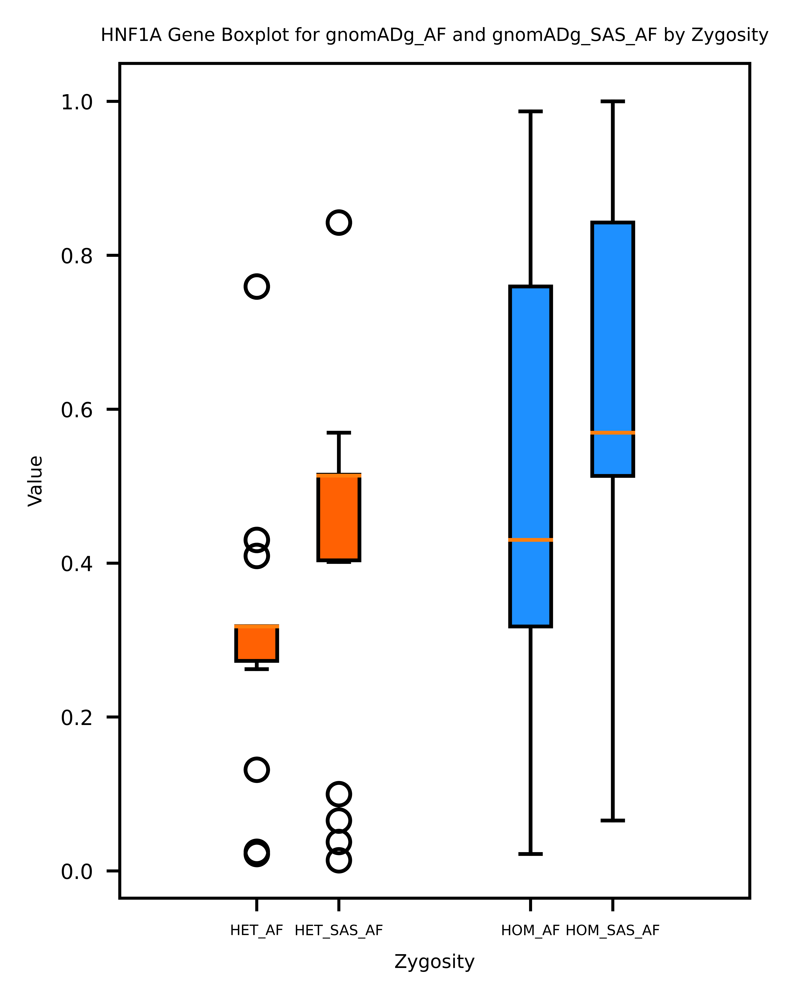

In [44]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have loaded your data into the 'filtered_data' DataFrame

# Group the data by 'Zygosity'
grouped_data = filtered_data.groupby('Zygosity')

# Create a larger figure with higher DPI
fig = plt.figure(figsize=(3, 4), dpi=2000)

# Create positions for HET and HOM boxplots
het_positions = [0.5, 0.8]
hom_positions = [1.5, 1.8]

# Extract the data for HET and HOM
het_gnomADg_AF = grouped_data.get_group('HET')['gnomADg_AF']
het_gnomADg_SAS_AF = grouped_data.get_group('HET')['gnomADg_SAS_AF']
hom_gnomADg_AF = grouped_data.get_group('HOM')['gnomADg_AF']
hom_gnomADg_SAS_AF = grouped_data.get_group('HOM')['gnomADg_SAS_AF']

# Create boxplots for HET and HOM with reduced width
boxplot = plt.boxplot([het_gnomADg_AF, het_gnomADg_SAS_AF, hom_gnomADg_AF, hom_gnomADg_SAS_AF],
                      positions=[0.5, 0.8, 1.5, 1.8],
                      labels=['HET_AF', 'HET_SAS_AF', 'HOM_AF', 'HOM_SAS_AF'],
                      patch_artist=True,  # Enable patch_artist for colored boxes
                      widths=0.15)  # Adjust the width of the boxplots

# Set box colors
colors = ['#FF6103', '#FF6103', '#1E90FF', '#1E90FF']  # Distinct colors for HET and HOM
for box, color in zip(boxplot['boxes'], colors):
    box.set(facecolor=color)

# Set x-axis labels and title
plt.title('HNF1A Gene Boxplot for gnomADg_AF and gnomADg_SAS_AF by Zygosity', fontsize=4.8)
plt.ylabel('Value', fontsize=5)
plt.xlabel('Zygosity', fontsize=5)

# Set header text size for x-axis labels
plt.xticks(fontsize=3.8)
plt.yticks(fontsize=5.5)


# Calculate medians
medians = [median.get_ydata().mean() for median in boxplot['medians']]

# Adding median values as text
#for pos, median in zip([1, 2, 4, 5], medians):
#    plt.text(pos, median, f"{median:.2f}", color='black', ha='center', va='bottom', fontsize=8)

# Save the figure with higher quality
plt.savefig(r'C:\Users\GenepoweRx_Madhu\Downloads\Depth_files_31_mody\COVERED_TSV\Covered_new\matched\14_genes_new_files\HET_HOM_boxplot_new.png', dpi=4000)

# Show the plot
plt.show()

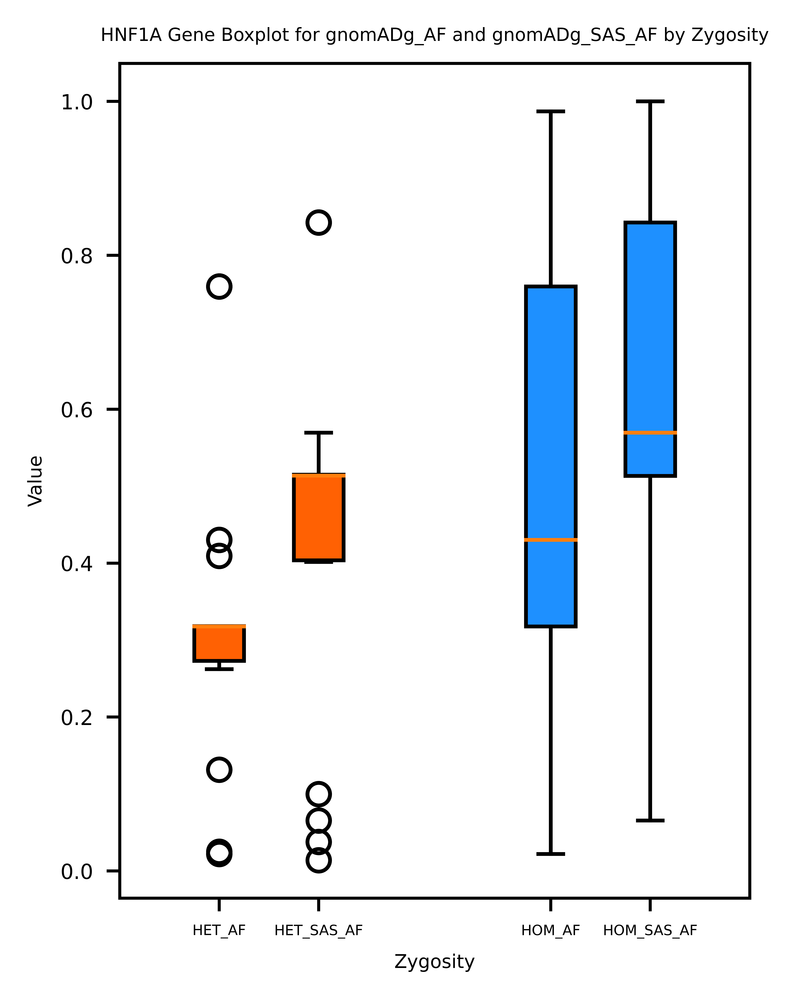

In [47]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have loaded your data into the 'filtered_data' DataFrame

# Group the data by 'Zygosity'
grouped_data = filtered_data.groupby('Zygosity')

# Create a larger figure with higher DPI
fig = plt.figure(figsize=(3, 4), dpi=2000)

# Create positions for HET and HOM boxplots
het_positions = [0.5, 0.8]
hom_positions = [1.5, 1.8]

# Extract the data for HET and HOM
het_gnomADg_AF = grouped_data.get_group('HET')['gnomADg_AF']
het_gnomADg_SAS_AF = grouped_data.get_group('HET')['gnomADg_SAS_AF']
hom_gnomADg_AF = grouped_data.get_group('HOM')['gnomADg_AF']
hom_gnomADg_SAS_AF = grouped_data.get_group('HOM')['gnomADg_SAS_AF']

# Create boxplots for HET and HOM with reduced width
boxplot = plt.boxplot([het_gnomADg_AF, het_gnomADg_SAS_AF, hom_gnomADg_AF, hom_gnomADg_SAS_AF],
                      positions=[0.5, 0.8, 1.5, 1.8],
                      labels=['HET_AF', 'HET_SAS_AF', 'HOM_AF', 'HOM_SAS_AF'],
                      patch_artist=True,  # Enable patch_artist for colored boxes
                      widths=0.15)  # Adjust the width of the boxplots

# Set box colors
colors = ['#FF6103', '#FF6103', '#1E90FF', '#1E90FF']  # Distinct colors for HET and HOM
for box, color in zip(boxplot['boxes'], colors):
    box.set(facecolor=color)

# Set x-axis labels and title
plt.title('HNF1A Gene Boxplot for gnomADg_AF and gnomADg_SAS_AF by Zygosity', fontsize=4.8)
plt.ylabel('Value', fontsize=5)
plt.xlabel('Zygosity', fontsize=5)

# Set header text size for x-axis labels
plt.xticks(fontsize=3.8)
plt.yticks(fontsize=5.5)

# Adjust x-axis limits to decrease space
plt.xlim(0.2, 2.1)

# Calculate medians
medians = [median.get_ydata().mean() for median in boxplot['medians']]

# Adding median values as text
#for pos, median in zip([1, 2, 4, 5], medians):
#    plt.text(pos, median, f"{median:.2f}", color='black', ha='center', va='bottom', fontsize=8)

# Save the figure with higher quality
plt.savefig(r'C:\Users\GenepoweRx_Madhu\Downloads\Depth_files_31_mody\COVERED_TSV\Covered_new\matched\14_genes_new_files\HET_HOM_boxplot_new.png', dpi=4000)

# Show the plot
plt.show()

KeyError: 'labels'

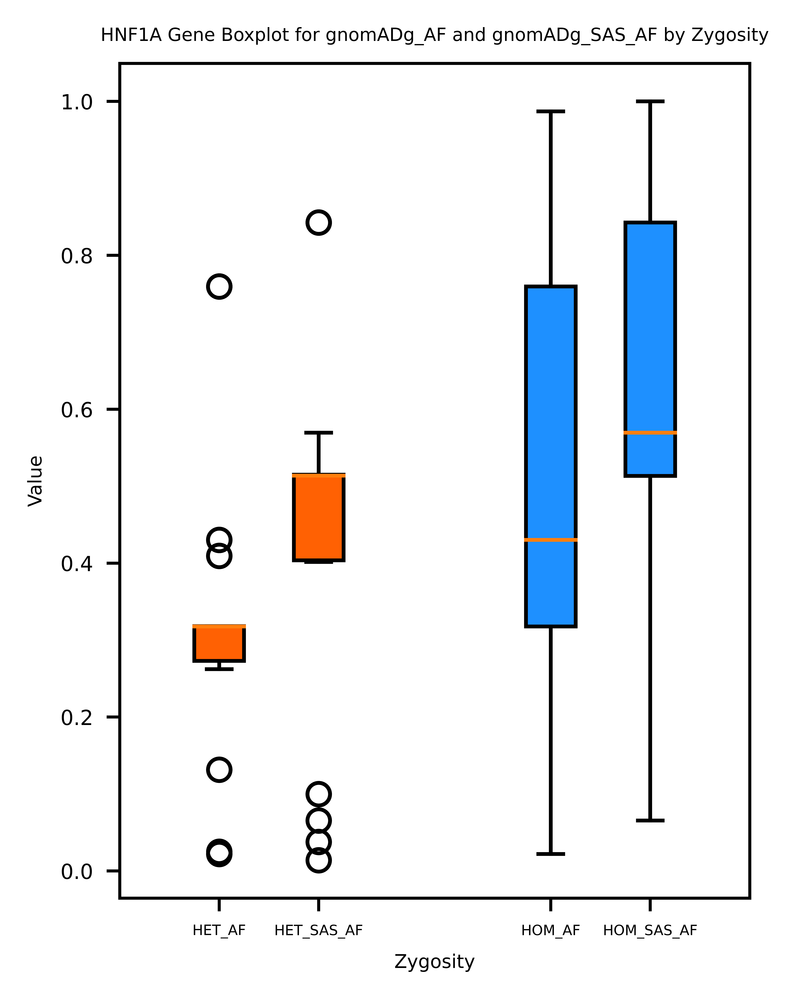

In [52]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have loaded your data into the 'filtered_data' DataFrame

# Group the data by 'Zygosity'
grouped_data = filtered_data.groupby('Zygosity')

# Create a larger figure with higher DPI
fig = plt.figure(figsize=(3, 4), dpi=2000)

# Create positions for HET and HOM boxplots
het_positions = [0.5, 0.8]
hom_positions = [1.5, 1.8]

# Extract the data for HET and HOM
het_gnomADg_AF = grouped_data.get_group('HET')['gnomADg_AF']
het_gnomADg_SAS_AF = grouped_data.get_group('HET')['gnomADg_SAS_AF']
hom_gnomADg_AF = grouped_data.get_group('HOM')['gnomADg_AF']
hom_gnomADg_SAS_AF = grouped_data.get_group('HOM')['gnomADg_SAS_AF']

# Create boxplots for HET and HOM with reduced width
boxplot = plt.boxplot([het_gnomADg_AF, het_gnomADg_SAS_AF, hom_gnomADg_AF, hom_gnomADg_SAS_AF],
                      positions=[0.5, 0.8, 1.5, 1.8],
                      labels=['HET_AF', 'HET_SAS_AF', 'HOM_AF', 'HOM_SAS_AF'],
                      patch_artist=True,  # Enable patch_artist for colored boxes
                      widths=0.15)  # Adjust the width of the boxplots

# Set box colors
colors = ['#FF6103', '#FF6103', '#1E90FF', '#1E90FF']  # Distinct colors for HET and HOM
for box, color in zip(boxplot['boxes'], colors):
    box.set(facecolor=color)

# Set x-axis labels and title
plt.title('HNF1A Gene Boxplot for gnomADg_AF and gnomADg_SAS_AF by Zygosity', fontsize=4.8)
plt.ylabel('Value', fontsize=5)
plt.xlabel('Zygosity', fontsize=5)

# Set header text size for x-axis labels
plt.xticks(fontsize=3.8)
plt.yticks(fontsize=5.5)

# Adjust x-axis limits to decrease space
plt.xlim(0.2, 2.1)

# Calculate medians
medians = [median.get_ydata().mean() for median in boxplot['medians']]

# Define median colors based on category
median_colors = ['#000000' if 'HET' in label else '#FFFFFF' for label in boxplot['labels']]

# Adding median values as text with different colors
for pos, median, color in zip([0.5, 0.8, 1.5, 1.8], medians, median_colors):
    plt.text(pos, median, f"{median:.2f}", color=color, ha='center', va='bottom', fontsize=6)

# Save the figure with higher quality
plt.savefig(r'C:\Users\GenepoweRx_Madhu\Downloads\Depth_files_31_mody\COVERED_TSV\Covered_new\matched\14_genes_new_files\HET_HOM_boxplot_new.png', dpi=4000)

# Show the plot
plt.show()


In [192]:
test = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/Stats_Haplotype_Genes_Allele_Updated_09082023_1686_Actionable_186.xlsx')
test

,Chr,Pos,Gene,Count,Haplotype_Gene,Haplotype_Star_Allele,Haplotype_Rsids,VCF_Rsids,Ref,Alt,HET_Mean(%),HOM_Mean(%),Gender_M,Gender_F,Age_Mean,Age_Min,Age_Max,DP_Mean,DP_Min,DP_Max,SDP_Mean,SDP_Min,SDP_Max,GQ_Mean,GQ_Min,GQ_Max,Freq_Mean(%),Freq_Min(%),Freq_Max(%),Pval_Mean,PVal_Min,PVal_Max,id,version,functionalstatus,clinicalfunctionalstatus,Actionable/Non-actionable,clinicalfunctionalsubstrate,activityvalue,definitionid,citations,strength,Strength Actionable/Non-actionable,Final Actionable/Non-actionable,functioncomments,findings,frequency,inferredfrequency
0,chr1,97305364,DPYD-AS1:100873932|DPYD:1806,6,DPYD,c.2194G>A(*6),rs1801160,rs1801160,C(6),T(6),0,1,0,6,61,50,74,12.33,8,21,12.33,8,21,48.17,31,76,0.87,0.75,1.00,1.517525e-04,2.350000e-08,6.993000e-04,778450,165,Normal function,Normal function,Actionable,NaN,1.0,778449,['23328581'],Moderate,Actionable,Actionable,NaN,5-fluorouracil (in vitro),"{'Latino': 0.027319003, 'European': 0.04496393...",0
1,chr1,97305364,DPYD-AS1:100873932|DPYD:1806,21,DPYD,c.2194G>A(*6),rs1801160,rs1801160,C(21),T(21),0,1,21,0,58,39,85,15.38,8,32,15.38,8,32,71.57,34,182,0.90,0.75,1.00,5.360000e-05,5.460000e-19,3.572300e-04,778450,165,Normal function,Normal function,Actionable,NaN,1.0,778449,['23328581'],Moderate,Actionable,Actionable,NaN,5-fluorouracil (in vitro),"{'Latino': 0.027319003, 'European': 0.04496393...",0
2,chr1,97305364,DPYD-AS1:100873932|DPYD:1806,42,DPYD,c.2194G>A(*6),rs1801160,rs1801160,C(42),T(42),1,0,0,42,51,28,73,39.74,11,156,39.76,11,156,70.17,20,255,0.50,0.29,0.71,1.597660e-03,1.730000e-30,9.530800e-03,778450,165,Normal function,Normal function,Actionable,NaN,1.0,778449,['23328581'],Moderate,Actionable,Actionable,NaN,5-fluorouracil (in vitro),"{'Latino': 0.027319003, 'European': 0.04496393...",0
3,chr1,97305364,DPYD-AS1:100873932|DPYD:1806,89,DPYD,c.2194G>A(*6),rs1801160,rs1801160,C(89),T(89),1,0,89,0,50,21,78,39.27,9,194,39.27,9,194,67.46,20,255,0.53,0.29,0.73,1.232184e-03,6.370000e-39,7.971000e-03,778450,165,Normal function,Normal function,Actionable,NaN,1.0,778449,['23328581'],Moderate,Actionable,Actionable,NaN,5-fluorouracil (in vitro),"{'Latino': 0.027319003, 'European': 0.04496393...",0
4,chr1,97450058,DPYD:1806,4,DPYD,c.1905+1G>A(*2A),rs3918290,rs3918290,C(4),T(4),1,0,0,4,57,40,67,28.25,22,38,28.25,22,38,44.50,23,61,0.44,0.32,0.50,1.125250e-03,7.530000e-07,4.450500e-03,778438,165,No function,No function,Actionable,NaN,0.0,778437,['23328581'],Strong,Actionable,Actionable,"This rsID, when combined with rs1801159, makes...",5-fluorouracil (in vitro),"{'Latino': 0.00078298897, 'European': 0.007917...",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,chr22,42129819,LOC102723722:102723722|LOC107987481:107987481|...,42,CYP2D6,*4,rs28371703,rs28371703,G(42),T(42),1,0,42,0,54,27,78,25.12,10,66,25.12,10,66,31.55,20,72,0.39,0.21,0.73,2.454632e-03,5.770000e-08,9.828000e-03,777943,165,NaN,No function,Actionable,NaN,0.0,777942,"['2211621', '11266079', '1978251', '1978565']",Strong,Actionable,Actionable,NaN,CYP2D6*4 is assigned no function based on stro...,"{'Latino': 0.12051356, 'American': 0.10194215,...",0
182,chr22,42130761,LOC102723722:102723722|LOC107987481:107987481|...,1,CYP2D6,*35,rs769258,rs769258,C(1),T(1),0,1,0,1,42,42,42,17.00,17,17,17.00,17,17,71.00,71,71,0.88,0.88,0.88,7.330000e-08,7.330000e-08,7.330000e-08,778003,165,NaN,Normal function,Actionable,NaN,1.0,778002,"['9241659', '12766015', '21833166', '24647041'...",Moderate,Actionable,Actionable,NaN,CYP2D6*35 is assigned normal function based on...,"{'Latino': 0.026583293, 'American': 0.01133529...",0
183,chr22,42130761,LOC102723722:102723722|LOC107987481:107987481|...,2,CYP2D6,*35,rs769258,rs769258,C(2),T(2),0,1,2,0,62,54,70,19.00,18,20,19.00,18,20,105.00,99,111,1.00,1.00,1.00,5.870000e-11,7.250000e-12,1.100000e-10,778003,165,NaN,Normal function,Actionable,NaN,1.0,778002,

In [193]:
# Creating separate conditions for HET and HOM
het_condition = test['HET_Mean(%)'] == 1
hom_condition = test['HOM_Mean(%)'] == 1

# Creating new columns for male and female counts based on conditions
test['Male_HET'] = test['Gender_M'].where(het_condition, 0)
test['Male_HOM'] = test['Gender_M'].where(hom_condition, 0)
test['Female_HET'] = test['Gender_F'].where(het_condition, 0)
test['Female_HOM'] = test['Gender_F'].where(hom_condition, 0)

# Grouping by Haplotype_Gene and Haplotype_Star_Allele and aggregating the counts
result = test.groupby(['Haplotype_Gene', 'Haplotype_Star_Allele']).agg({
    'Count': 'sum',
    'Male_HET': 'sum',
    'Male_HOM': 'sum',
    'Female_HET': 'sum',
    'Female_HOM': 'sum'
}).reset_index()

# Renaming columns
result.columns = ['Haplotype_Gene', 'Haplotype_Star_Allele', 'Count', 'Male_HET', 'Male_HOM', 'Female_HET', 'Female_HOM']
result

,Haplotype_Gene,Haplotype_Star_Allele,Count,Male_HET,Male_HOM,Female_HET,Female_HOM
0,CYP2C19,*1,1105,153,558,98,296
1,CYP2C19,*17,1529,381,588,243,317
2,CYP2C19,*2,1105,153,558,98,296
3,CYP2C19,*3,1111,158,558,99,296
4,CYP2C19,*38,1628,439,592,278,319
5,CYP2C19,*5,1105,153,558,98,296
6,CYP2C9,*11,8,3,0,5,0
7,CYP2C9,*14,74,44,2,26,2
8,CYP2C9,*2,100,69,3,28,0
9,CYP2C9,*3,283,169,6,101,7


In [194]:
result.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/test_new_data_5genes.xlsx', index=False)

In [199]:
test_new = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/test_new_data_5genes.xlsx')
test_new

,Haplotype_Gene,Haplotype_Star_Allele,Count,Male_HOM,Male_HET,Female_HOM,Female_HET
0,CYP2C19,*1,1105,558,153,296,98
1,CYP2C19,*17,1529,588,381,317,243
2,CYP2C19,*2,1105,558,153,296,98
3,CYP2C19,*3,1111,558,158,296,99
4,CYP2C19,*38,1628,592,439,319,278
5,CYP2C19,*5,1105,558,153,296,98
6,CYP2C9,*11,8,0,3,0,5
7,CYP2C9,*14,74,2,44,2,26
8,CYP2C9,*2,100,3,69,0,28
9,CYP2C9,*3,283,6,169,7,101


In [200]:
test_new['Haplotype_Star_Allele'] = test_new['Haplotype_Star_Allele'] + ' [' + test_new['Count'].astype(str) + ']'
test_new

,Haplotype_Gene,Haplotype_Star_Allele,Count,Male_HOM,Male_HET,Female_HOM,Female_HET
0,CYP2C19,*1 [1105],1105,558,153,296,98
1,CYP2C19,*17 [1529],1529,588,381,317,243
2,CYP2C19,*2 [1105],1105,558,153,296,98
3,CYP2C19,*3 [1111],1111,558,158,296,99
4,CYP2C19,*38 [1628],1628,592,439,319,278
5,CYP2C19,*5 [1105],1105,558,153,296,98
6,CYP2C9,*11 [8],8,0,3,0,5
7,CYP2C9,*14 [74],74,2,44,2,26
8,CYP2C9,*2 [100],100,3,69,0,28
9,CYP2C9,*3 [283],283,6,169,7,101


In [201]:
sorted_df = test_new.sort_values(by=['Haplotype_Gene', 'Count'], ascending=[True, False])
sorted_df

,Haplotype_Gene,Haplotype_Star_Allele,Count,Male_HOM,Male_HET,Female_HOM,Female_HET
4,CYP2C19,*38 [1628],1628,592,439,319,278
1,CYP2C19,*17 [1529],1529,588,381,317,243
3,CYP2C19,*3 [1111],1111,558,158,296,99
0,CYP2C19,*1 [1105],1105,558,153,296,98
2,CYP2C19,*2 [1105],1105,558,153,296,98
5,CYP2C19,*5 [1105],1105,558,153,296,98
9,CYP2C9,*3 [283],283,6,169,7,101
8,CYP2C9,*2 [100],100,3,69,0,28
7,CYP2C9,*14 [74],74,2,44,2,26
6,CYP2C9,*11 [8],8,0,3,0,5


In [45]:
df = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/male_female_HET_HOM/updated_Obesity_1069_Novel_variants.xlsx')
df

,Category,Gene,Chr,Pos,Count,Rsids,Ref,Alt,Gender_M,Gender_F,Age_Mean,Age_Min,Age_Max,HET_Mean(%),HOM_Mean(%),DP_Mean,DP_Min,DP_Max,SDP_Mean,SDP_Min,SDP_Max,GQ_Mean,GQ_Min,GQ_Max,Freq_Mean(%),Freq_Min(%),Freq_Max(%),PVal_Mean,PVal_Min,PVal_Max
0,Obesity,SDC3,chr1,30874442,1,.,A(1),G(1),1,0,51,51,51,1,0,21.0,21,21,21.0,21,21,56.0,56,56,0.67,0.67,0.67,2.199800e-06,2.199800e-06,2.199800e-06
1,Obesity,SDC3,chr1,30876888,1,.,T(1),A(1),1,0,36,36,36,1,0,35.0,35,35,36.0,36,36,22.0,22,22,0.20,0.20,0.20,5.609500e-03,5.609500e-03,5.609500e-03
2,Obesity,SDC3,chr1,30876923,1,.,C(1),T(1),1,0,56,56,56,1,0,63.0,63,63,63.0,63,63,92.0,92,92,0.41,0.41,0.41,5.667100e-10,5.667100e-10,5.667100e-10
3,Obesity,SDC3,chr1,30908553,2,.,C(2),A(2),0,2,66,65,67,1,0,20.0,19,21,20.0,19,21,36.0,32,40,0.50,0.47,0.52,3.245495e-04,8.239900e-05,5.667000e-04
4,Obesity,LEPR,chr1,65608809,1,.,T(1),C(1),1,0,62,62,62,1,0,29.0,29,29,29.0,29,29,42.0,42,42,0.41,0.41,0.41,5.819300e-05,5.819300e-05,5.819300e-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,Obesity,ADRB3,chr8,37965650,1,.,C(1),G(1),1,0,74,74,74,1,0,35.0,35,35,35.0,35,35,93.0,93,93,0.66,0.66,0.66,4.657600e-10,4.657600e-10,4.657600e-10
167,Obesity,ADRB3,chr8,37966335,1,.,C(1),G(1),1,0,56,56,56,1,0,43.0,43,43,43.0,43,43,82.0,82,82,0.51,0.51,0.51,6.193200e-09,6.193200e-09,6.193200e-09
168,Obesity,NTRK2,chr9,84670893,1,.,T(1),A(1),1,0,53,53,53,1,0,91.0,91,91,91.0,91,91,172.0,172,172,0.51,0.51,0.51,6.249000e-18,6.249000e-18,6.249000e-18
169,Obesity,NTRK2,chr9,84702175,1,.,A(1),C(1),1,0,66,66,66,1,0,71.0,71,71,71.0,71,71,99.0,99,99,0.39,0.39,0.39,1.250500e-10,1.250500e-10,1.250500e-10


In [46]:
df['Ref'] = df['Ref'].str.replace(r'\(.*\)', '', regex=True)
df['Alt'] = df['Alt'].str.replace(r'\(.*\)', '', regex=True)
df

,Category,Gene,Chr,Pos,Count,Rsids,Ref,Alt,Gender_M,Gender_F,Age_Mean,Age_Min,Age_Max,HET_Mean(%),HOM_Mean(%),DP_Mean,DP_Min,DP_Max,SDP_Mean,SDP_Min,SDP_Max,GQ_Mean,GQ_Min,GQ_Max,Freq_Mean(%),Freq_Min(%),Freq_Max(%),PVal_Mean,PVal_Min,PVal_Max
0,Obesity,SDC3,chr1,30874442,1,.,A,G,1,0,51,51,51,1,0,21.0,21,21,21.0,21,21,56.0,56,56,0.67,0.67,0.67,2.199800e-06,2.199800e-06,2.199800e-06
1,Obesity,SDC3,chr1,30876888,1,.,T,A,1,0,36,36,36,1,0,35.0,35,35,36.0,36,36,22.0,22,22,0.20,0.20,0.20,5.609500e-03,5.609500e-03,5.609500e-03
2,Obesity,SDC3,chr1,30876923,1,.,C,T,1,0,56,56,56,1,0,63.0,63,63,63.0,63,63,92.0,92,92,0.41,0.41,0.41,5.667100e-10,5.667100e-10,5.667100e-10
3,Obesity,SDC3,chr1,30908553,2,.,C,A,0,2,66,65,67,1,0,20.0,19,21,20.0,19,21,36.0,32,40,0.50,0.47,0.52,3.245495e-04,8.239900e-05,5.667000e-04
4,Obesity,LEPR,chr1,65608809,1,.,T,C,1,0,62,62,62,1,0,29.0,29,29,29.0,29,29,42.0,42,42,0.41,0.41,0.41,5.819300e-05,5.819300e-05,5.819300e-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,Obesity,ADRB3,chr8,37965650,1,.,C,G,1,0,74,74,74,1,0,35.0,35,35,35.0,35,35,93.0,93,93,0.66,0.66,0.66,4.657600e-10,4.657600e-10,4.657600e-10
167,Obesity,ADRB3,chr8,37966335,1,.,C,G,1,0,56,56,56,1,0,43.0,43,43,43.0,43,43,82.0,82,82,0.51,0.51,0.51,6.193200e-09,6.193200e-09,6.193200e-09
168,Obesity,NTRK2,chr9,84670893,1,.,T,A,1,0,53,53,53,1,0,91.0,91,91,91.0,91,91,172.0,172,172,0.51,0.51,0.51,6.249000e-18,6.249000e-18,6.249000e-18
169,Obesity,NTRK2,chr9,84702175,1,.,A,C,1,0,66,66,66,1,0,71.0,71,71,71.0,71,71,99.0,99,99,0.39,0.39,0.39,1.250500e-10,1.250500e-10,1.250500e-10


In [47]:
# Creating separate conditions for HET and HOM
het_condition = df['HET_Mean(%)'] == 1
hom_condition = df['HOM_Mean(%)'] == 1

# Creating new columns for male and female counts based on conditions
df['Male_HET'] = df['Gender_M'].where(het_condition, 0)
df['Male_HOM'] = df['Gender_M'].where(hom_condition, 0)
df['Female_HET'] = df['Gender_F'].where(het_condition, 0)
df['Female_HOM'] = df['Gender_F'].where(hom_condition, 0)

# Grouping by Haplotype_Gene and Haplotype_Star_Allele and aggregating the counts
result = df.groupby(['Category', 'Gene', 'Chr', 'Pos', 'Ref', 'Alt']).agg({
    'Count': 'sum',
    'Male_HET': 'sum',
    'Male_HOM': 'sum',
    'Female_HET': 'sum',
    'Female_HOM': 'sum'
}).reset_index()

# Renaming columns
result.columns = ['Category', 'Gene', 'Chr', 'Pos', 'Ref', 'Alt', 'Count', 'Male_HET', 'Male_HOM', 'Female_HET', 'Female_HOM']
result

,Category,Gene,Chr,Pos,Ref,Alt,Count,Male_HET,Male_HOM,Female_HET,Female_HOM
0,Obesity,ABCC8,chr11,17397259,G,C,1,1,0,0,0
1,Obesity,ABCC8,chr11,17404668,T,C,1,1,0,0,0
2,Obesity,ABCC8,chr11,17408411,T,C,1,1,0,0,0
3,Obesity,ABCC8,chr11,17410612,G,C,1,0,0,1,0
4,Obesity,ABCC8,chr11,17416919,C,G,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
161,Obesity,SMARCA4,chr19,11079023,T,G,1,1,0,0,0
162,Obesity,TUB,chr11,8090185,C,A,1,1,0,0,0
163,Obesity,TUB,chr11,8097310,G,A,1,0,0,1,0
164,Obesity,TUB,chr11,8097830,C,T,1,1,0,0,0


In [48]:
result[result['Count'] >= 5]

,Category,Gene,Chr,Pos,Ref,Alt,Count,Male_HET,Male_HOM,Female_HET,Female_HOM


In [49]:
result.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/male_female_HET_HOM/Obesity_data.xlsx', index=False)

In [202]:
import pandas as pd

# Assuming you have your DataFrame named 'test_new'

# Group the DataFrame by unique combinations of all columns
grouped = sorted_df.groupby(['Haplotype_Gene'])

# Create a new Excel file and add sheets for each unique combination
output_path = r'C:/Users/GenepoweRx_Madhu/Downloads/test_split_5genes_output.xlsx'
with pd.ExcelWriter(output_path, engine='xlsxwriter') as writer:
    for group_name, group_data in grouped:
        # Construct a sheet name using the unique combination
        sheet_name = ''.join(map(str, group_name))
        sheet_name = sheet_name[:31]  # Truncate sheet names if necessary
        
        # Convert the group_data rows to a list of dictionaries
        data_list = [row._asdict() for row in group_data.itertuples(index=False)]
        
        # Convert the list of dictionaries to a DataFrame
        group_df = pd.DataFrame(data_list)
        
        # Write the DataFrame to the Excel sheet
        group_df.to_excel(writer, sheet_name=sheet_name, index=False)


In [81]:
grouped_df = test_new.groupby('Haplotype_Gene')['Count'].agg(CountSum='sum').reset_index()
grouped_df

,Haplotype_Gene,CountSum
0,ABCG2,297
1,CACNA1S,1
2,CFTR,30
3,CYP2B6,31935
4,CYP2C19,35731
5,CYP2C9,1815
6,CYP2D6,4655
7,CYP3A5,20
8,CYP4F2,5100
9,DPYD,1015


In [82]:
grouped_df.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/test_data_counts_gene.xlsx', index=False)

In [65]:
vep_data = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/VEP_Results.xlsx')
vep_data

,VEP_format,Location,Allele,Consequence,IMPACT,SYMBOL,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,Amino_acids,Codons,Existing_variation,HGNC_ID,SIFT,PolyPhen,AF,gnomADe_AF,gnomADe_AFR_AF,gnomADe_AMR_AF,gnomADe_ASJ_AF,gnomADe_EAS_AF,gnomADe_FIN_AF,gnomADe_NFE_AF,gnomADe_OTH_AF,gnomADe_SAS_AF,CLIN_SIG
0,NC_000001.11:g.69932C>T,1:69932-69932,T,missense_variant,MODERATE,OR4F5,protein_coding,2023-03-03 00:00:00,-,ENST00000641515.2:c.905C>T,ENSP00000493376.2:p.Thr302Ile,T/I,aCa/aTa,-,HGNC:14825,deleterious(0),possibly_damaging(0.747),-,-,-,-,-,-,-,-,-,-,-
1,NC_000001.11:g.450750C>T,1:450750-450750,T,missense_variant,MODERATE,OR4F29,protein_coding,2023-01-01 00:00:00,-,ENST00000426406.4:c.929G>A,ENSP00000409316.1:p.Arg310Lys,R/K,aGg/aAg,rs1553135105,HGNC:31275,tolerated_low_confidence(1),benign(0),-,-,-,-,-,-,-,-,-,-,-
2,NC_000001.11:g.450750C>T,1:450750-450750,T,"intron_variant,non_coding_transcript_variant",MODIFIER,-,lncRNA,-,2023-02-01 00:00:00,ENST00000455207.5:n.169+34290G>A,-,-,-,rs1553135105,-,-,-,-,-,-,-,-,-,-,-,-,-,-
3,NC_000001.11:g.450753T>C,1:450753-450753,C,missense_variant,MODERATE,OR4F29,protein_coding,2023-01-01 00:00:00,-,ENST00000426406.4:c.926A>G,ENSP00000409316.1:p.Lys309Arg,K/R,aAg/aGg,-,HGNC:31275,tolerated_low_confidence(1),benign(0),-,-,-,-,-,-,-,-,-,-,-
4,NC_000001.11:g.450753T>C,1:450753-450753,C,"intron_variant,non_coding_transcript_variant",MODIFIER,NaN,lncRNA,-,2023-02-01 00:00:00,ENST00000455207.5:n.169+34287A>G,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21789,NC_000024.10:g.25622823C>T,Y:25622823-25622823,T,synonymous_variant,LOW,CDY1,protein_coding,2023-01-01 00:00:00,-,ENST00000361963.3:c.381C>T,ENSP00000354799.2:p.Ser127%3D,S,tcC/tcT,rs1556284596,HGNC:1809,-,-,-,-,-,-,-,-,-,-,-,-,-
21790,NC_000024.10:g.25623010C>G,Y:25623010-25623010,G,missense_variant,MODERATE,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.568C>G,ENSP00000302968.4:p.Pro190Ala,P/A,Cct/Gct,-,HGNC:1809,tolerated(0.06),benign(0.405),-,-,-,-,-,-,-,-,-,-,-
21791,NC_000024.10:g.25623010C>G,Y:25623010-25623010,G,missense_variant,MODERATE,CDY1,protein_coding,2023-01-01 00:00:00,-,ENST00000361963.3:c.568C>G,ENSP00000354799.2:p.Pro190Ala,P/A,Cct/Gct,-,HGNC:1809,tolerated(0.06),possibly_damaging(0.783),-,-,-,-,-,-,-,-,-,-,-
21792,NC_000024.10:g.25623585G>A,Y:25623585-25623585,A,synonymous_variant,LOW,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.1143G>A,ENSP00000302968.4:p.Lys381%3D,K,aaG/aaA,-,HGNC:1809,-,-,-,-,-,-,-,-,-,-,-,-,-


In [66]:
vep_data = vep_data.drop_duplicates(subset='VEP_format', keep='first')
vep_data

,VEP_format,Location,Allele,Consequence,IMPACT,SYMBOL,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,Amino_acids,Codons,Existing_variation,HGNC_ID,SIFT,PolyPhen,AF,gnomADe_AF,gnomADe_AFR_AF,gnomADe_AMR_AF,gnomADe_ASJ_AF,gnomADe_EAS_AF,gnomADe_FIN_AF,gnomADe_NFE_AF,gnomADe_OTH_AF,gnomADe_SAS_AF,CLIN_SIG
0,NC_000001.11:g.69932C>T,1:69932-69932,T,missense_variant,MODERATE,OR4F5,protein_coding,2023-03-03 00:00:00,-,ENST00000641515.2:c.905C>T,ENSP00000493376.2:p.Thr302Ile,T/I,aCa/aTa,-,HGNC:14825,deleterious(0),possibly_damaging(0.747),-,-,-,-,-,-,-,-,-,-,-
1,NC_000001.11:g.450750C>T,1:450750-450750,T,missense_variant,MODERATE,OR4F29,protein_coding,2023-01-01 00:00:00,-,ENST00000426406.4:c.929G>A,ENSP00000409316.1:p.Arg310Lys,R/K,aGg/aAg,rs1553135105,HGNC:31275,tolerated_low_confidence(1),benign(0),-,-,-,-,-,-,-,-,-,-,-
3,NC_000001.11:g.450753T>C,1:450753-450753,C,missense_variant,MODERATE,OR4F29,protein_coding,2023-01-01 00:00:00,-,ENST00000426406.4:c.926A>G,ENSP00000409316.1:p.Lys309Arg,K/R,aAg/aGg,-,HGNC:31275,tolerated_low_confidence(1),benign(0),-,-,-,-,-,-,-,-,-,-,-
5,NC_000001.11:g.451290A>C,1:451290-451290,C,missense_variant,MODERATE,OR4F29,protein_coding,2023-01-01 00:00:00,-,ENST00000426406.4:c.389T>G,ENSP00000409316.1:p.Leu130Arg,L/R,cTc/cGc,"rs1553135108,COSV70293995",HGNC:31275,deleterious_low_confidence(0.01),benign(0.336),-,-,-,-,-,-,-,-,-,-,-
8,NC_000001.11:g.451305G>A,1:451305-451305,A,missense_variant,MODERATE,OR4F29,protein_coding,2023-01-01 00:00:00,-,ENST00000426406.4:c.374C>T,ENSP00000409316.1:p.Ala125Val,A/V,gCc/gTc,-,HGNC:31275,deleterious_low_confidence(0),probably_damaging(0.971),-,-,-,-,-,-,-,-,-,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21777,NC_000024.10:g.24896555G>A,Y:24896555-24896555,A,intron_variant,MODIFIER,DAZ4,protein_coding,-,24/25,ENST00000382296.4:c.1892+16G>A,-,-,-,-,HGNC:15966,-,-,-,-,-,-,-,-,-,-,-,-,-
21785,NC_000024.10:g.25043931A>G,Y:25043931-25043931,G,intron_variant,MODIFIER,BPY2C,protein_coding,-,2023-08-04 00:00:00,ENST00000382287.5:c.78+15T>C,-,-,-,-,HGNC:18225,-,-,-,-,-,-,-,-,-,-,-,-,-
21788,NC_000024.10:g.25622823C>T,Y:25622823-25622823,T,synonymous_variant,LOW,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.381C>T,ENSP00000302968.4:p.Ser127%3D,S,tcC/tcT,rs1556284596,HGNC:1809,-,-,-,-,-,-,-,-,-,-,-,-,-
21790,NC_000024.10:g.25623010C>G,Y:25623010-25623010,G,missense_variant,MODERATE,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.568C>G,ENSP00000302968.4:p.Pro190Ala,P/A,Cct/Gct,-,HGNC:1809,tolerated(0.06),benign(0.405),-,-,-,-,-,-,-,-,-,-,-


In [67]:
Accesion = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/Accesion_Format_For_Annotation.xlsx')
Accesion

,Chr,Pos,Ref,Alt,VEP_format
0,chr1,1034687,G,A,NC_000001.11:g.1034687G>A
1,chr1,103619002,C,G,NC_000001.11:g.103619002C>G
2,chr1,103621847,G,A,NC_000001.11:g.103621847G>A
3,chr1,103621865,G,A,NC_000001.11:g.103621865G>A
4,chr1,103656434,G,A,NC_000001.11:g.103656434G>A
...,...,...,...,...,...
5068,chrY,25043931,A,G,NC_000024.10:g.25043931A>G
5069,chrY,25622823,C,T,NC_000024.10:g.25622823C>T
5070,chrY,25623010,C,G,NC_000024.10:g.25623010C>G
5071,chrY,25623585,G,A,NC_000024.10:g.25623585G>A


In [68]:
merged_data = pd.merge(Accesion, vep_data, on = 'VEP_format', how='left', sort=False)
merged_data

,Chr,Pos,Ref,Alt,VEP_format,Location,Allele,Consequence,IMPACT,SYMBOL,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,Amino_acids,Codons,Existing_variation,HGNC_ID,SIFT,PolyPhen,AF,gnomADe_AF,gnomADe_AFR_AF,gnomADe_AMR_AF,gnomADe_ASJ_AF,gnomADe_EAS_AF,gnomADe_FIN_AF,gnomADe_NFE_AF,gnomADe_OTH_AF,gnomADe_SAS_AF,CLIN_SIG
0,chr1,1034687,G,A,NC_000001.11:g.1034687G>A,1:1034687-1034687,A,intron_variant,MODIFIER,AGRN,protein_coding,-,1935-02-01 00:00:00,ENST00000379370.7:c.464-590G>A,-,-,-,-,HGNC:329,-,-,-,-,-,-,-,-,-,-,-,-,-
1,chr1,103619002,C,G,NC_000001.11:g.103619002C>G,1:103619002-103619002,G,missense_variant,MODERATE,AMY2A,protein_coding,2023-10-03 00:00:00,-,ENST00000414303.7:c.407C>G,ENSP00000397582.2:p.Pro136Arg,P/R,cCt/cGt,COSV104711060,HGNC:477,deleterious_low_confidence(0),benign(0.124),-,-,-,-,-,-,-,-,-,-,-
2,chr1,103621847,G,A,NC_000001.11:g.103621847G>A,1:103621847-103621847,A,missense_variant,MODERATE,AMY2A,protein_coding,2023-10-07 00:00:00,-,ENST00000414303.7:c.1055G>A,ENSP00000397582.2:p.Arg352Gln,R/Q,cGa/cAa,"rs1553199658,COSV70214485",HGNC:477,deleterious_low_confidence(0.02),possibly_damaging(0.771),-,-,-,-,-,-,-,-,-,-,-
3,chr1,103621865,G,A,NC_000001.11:g.103621865G>A,1:103621865-103621865,A,missense_variant,MODERATE,AMY2A,protein_coding,2023-10-07 00:00:00,-,ENST00000414303.7:c.1073G>A,ENSP00000397582.2:p.Arg358His,R/H,cGt/cAt,rs1553199662,HGNC:477,tolerated_low_confidence(0.14),benign(0.005),-,-,-,-,-,-,-,-,-,-,-
4,chr1,103656434,G,A,NC_000001.11:g.103656434G>A,1:103656434-103656434,A,missense_variant,MODERATE,AMY1A,protein_coding,2023-11-02 00:00:00,-,ENST00000370083.9:c.104G>A,ENSP00000359100.4:p.Arg35Gln,R/Q,cGa/cAa,-,HGNC:474,deleterious_low_confidence(0.01),possibly_damaging(0.797),-,-,-,-,-,-,-,-,-,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5068,chrY,25043931,A,G,NC_000024.10:g.25043931A>G,Y:25043931-25043931,G,intron_variant,MODIFIER,BPY2C,protein_coding,-,2023-08-04 00:00:00,ENST00000382287.5:c.78+15T>C,-,-,-,-,HGNC:18225,-,-,-,-,-,-,-,-,-,-,-,-,-
5069,chrY,25622823,C,T,NC_000024.10:g.25622823C>T,Y:25622823-25622823,T,synonymous_variant,LOW,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.381C>T,ENSP00000302968.4:p.Ser127%3D,S,tcC/tcT,rs1556284596,HGNC:1809,-,-,-,-,-,-,-,-,-,-,-,-,-
5070,chrY,25623010,C,G,NC_000024.10:g.25623010C>G,Y:25623010-25623010,G,missense_variant,MODERATE,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.568C>G,ENSP00000302968.4:p.Pro190Ala,P/A,Cct/Gct,-,HGNC:1809,tolerated(0.06),benign(0.405),-,-,-,-,-,-,-,-,-,-,-
5071,chrY,25623585,G,A,NC_000024.10:g.25623585G>A,Y:25623585-25623585,A,synonymous_variant,LOW,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.1143G>A,ENSP00000302968.4:p.Lys381%3D,K,aaG/aaA,-,HGNC:1809,-,-,-,-,-,-,-,-,-,-,-,-,-


In [71]:
merged_data.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/mapped_Accesion_data.xlsx', index=False)

In [70]:
merged_data

,Chr,Pos,Ref,Alt,VEP_format,Location,Allele,Consequence,IMPACT,SYMBOL,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,Amino_acids,Codons,Existing_variation,HGNC_ID,SIFT,PolyPhen,AF,gnomADe_AF,gnomADe_AFR_AF,gnomADe_AMR_AF,gnomADe_ASJ_AF,gnomADe_EAS_AF,gnomADe_FIN_AF,gnomADe_NFE_AF,gnomADe_OTH_AF,gnomADe_SAS_AF,CLIN_SIG
0,chr1,1034687,G,A,NC_000001.11:g.1034687G>A,1:1034687-1034687,A,intron_variant,MODIFIER,AGRN,protein_coding,-,1935-02-01 00:00:00,ENST00000379370.7:c.464-590G>A,-,-,-,-,HGNC:329,-,-,-,-,-,-,-,-,-,-,-,-,-
1,chr1,103619002,C,G,NC_000001.11:g.103619002C>G,1:103619002-103619002,G,missense_variant,MODERATE,AMY2A,protein_coding,2023-10-03 00:00:00,-,ENST00000414303.7:c.407C>G,ENSP00000397582.2:p.Pro136Arg,P/R,cCt/cGt,COSV104711060,HGNC:477,deleterious_low_confidence(0),benign(0.124),-,-,-,-,-,-,-,-,-,-,-
2,chr1,103621847,G,A,NC_000001.11:g.103621847G>A,1:103621847-103621847,A,missense_variant,MODERATE,AMY2A,protein_coding,2023-10-07 00:00:00,-,ENST00000414303.7:c.1055G>A,ENSP00000397582.2:p.Arg352Gln,R/Q,cGa/cAa,"rs1553199658,COSV70214485",HGNC:477,deleterious_low_confidence(0.02),possibly_damaging(0.771),-,-,-,-,-,-,-,-,-,-,-
3,chr1,103621865,G,A,NC_000001.11:g.103621865G>A,1:103621865-103621865,A,missense_variant,MODERATE,AMY2A,protein_coding,2023-10-07 00:00:00,-,ENST00000414303.7:c.1073G>A,ENSP00000397582.2:p.Arg358His,R/H,cGt/cAt,rs1553199662,HGNC:477,tolerated_low_confidence(0.14),benign(0.005),-,-,-,-,-,-,-,-,-,-,-
4,chr1,103656434,G,A,NC_000001.11:g.103656434G>A,1:103656434-103656434,A,missense_variant,MODERATE,AMY1A,protein_coding,2023-11-02 00:00:00,-,ENST00000370083.9:c.104G>A,ENSP00000359100.4:p.Arg35Gln,R/Q,cGa/cAa,-,HGNC:474,deleterious_low_confidence(0.01),possibly_damaging(0.797),-,-,-,-,-,-,-,-,-,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5068,chrY,25043931,A,G,NC_000024.10:g.25043931A>G,Y:25043931-25043931,G,intron_variant,MODIFIER,BPY2C,protein_coding,-,2023-08-04 00:00:00,ENST00000382287.5:c.78+15T>C,-,-,-,-,HGNC:18225,-,-,-,-,-,-,-,-,-,-,-,-,-
5069,chrY,25622823,C,T,NC_000024.10:g.25622823C>T,Y:25622823-25622823,T,synonymous_variant,LOW,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.381C>T,ENSP00000302968.4:p.Ser127%3D,S,tcC/tcT,rs1556284596,HGNC:1809,-,-,-,-,-,-,-,-,-,-,-,-,-
5070,chrY,25623010,C,G,NC_000024.10:g.25623010C>G,Y:25623010-25623010,G,missense_variant,MODERATE,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.568C>G,ENSP00000302968.4:p.Pro190Ala,P/A,Cct/Gct,-,HGNC:1809,tolerated(0.06),benign(0.405),-,-,-,-,-,-,-,-,-,-,-
5071,chrY,25623585,G,A,NC_000024.10:g.25623585G>A,Y:25623585-25623585,A,synonymous_variant,LOW,CDY1,protein_coding,2023-02-01 00:00:00,-,ENST00000306609.5:c.1143G>A,ENSP00000302968.4:p.Lys381%3D,K,aaG/aaA,-,HGNC:1809,-,-,-,-,-,-,-,-,-,-,-,-,-


In [203]:
skd_data = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/stacked_test.xlsx')
#skd_data = skd_data.drop(columns='Haplotype_Gene', axis=1)
skd_data

,columns,ivacaftornon,R1070Q,Others
0,Count,15,10,5
1,Male_HOM,0,0,0
2,Male_HET,6,4,2
3,Female_HOM,2,2,0
4,Female_HET,7,4,3


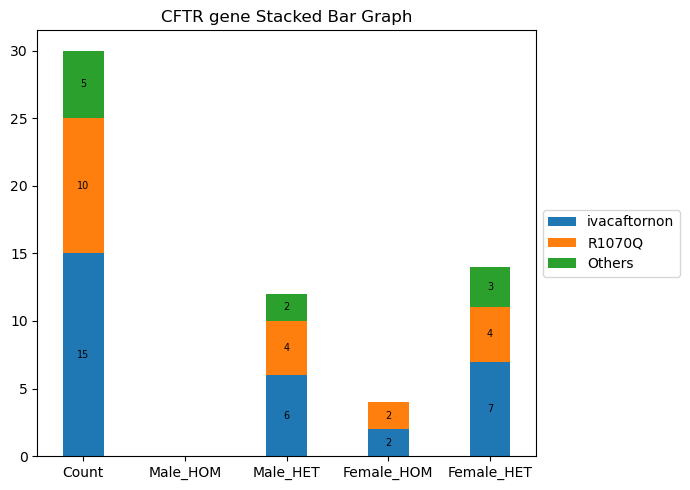

In [190]:
# Set 'Haplotype_Star_Allele' column as index
skd_data.set_index('columns', inplace=True)

# Plot the stacked bar graph
ax = skd_data.plot(kind='bar', stacked=True, figsize=(7, 5), width=0.4)
ax.set_xlabel('')
ax.set_ylabel('')
plt.xticks(rotation=0)
ax.set_title('CFTR gene Stacked Bar Graph')


# Add labels with values for each stack within the bars, excluding zeros
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    if height > 0:
        ax.annotate(f'{int(height)}', (x + width / 2, y + height / 2), ha='center', va='center', fontsize=7)

ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Show the plot
plt.tight_layout()
plt.savefig(r'C:\Users\GenepoweRx_Madhu\Downloads\CFTR_gene.png', dpi=500)
plt.show()


In [4]:
data['csq'] = data['CSQ'].str.split(',')
data = data.explode('csq')
data

,ID,CSQ,Zygosity,Matched_Gene,Sample_Name,csq
0,rs3842753,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...
0,rs3842753,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
0,rs3842753,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
0,rs3842753,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
0,rs3842753,G|3_prime_UTR_variant|MODIFIER|INS|ENSG0000025...,HOM,INS,12652700,G|downstream_gene_variant|MODIFIER|TH|ENSG0000...
...,...,...,...,...,...,...
2287,rs7840433,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...
2287,rs7840433,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...
2287,rs7840433,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|regulatory_region_variant|MODIFIER|||Regulat...
2287,rs7840433,G|downstream_gene_variant|MODIFIER|BLK|ENSG000...,HET,BLK,19532336,G|regulatory_region_variant|MODIFIER|||Regulat...


In [5]:
data['CLIN_SIG'] = data['csq'].str.split('|').str[70]
data['Consequence'] = data['csq'].str.split('|').str[1]
data['IMPACT'] = data['csq'].str.split('|').str[2]
data['gnomADg_AF'] = data['csq'].str.split('|').str[57]
data['gnomADg_SAS_AF'] = data['csq'].str.split('|').str[67]
data = data[['Matched_Gene', 'ID', 'Zygosity', 'Sample_Name', 'CLIN_SIG', 'Consequence', 'IMPACT', 'gnomADg_AF', 'gnomADg_SAS_AF']]
data

,Matched_Gene,ID,Zygosity,Sample_Name,CLIN_SIG,Consequence,IMPACT,gnomADg_AF,gnomADg_SAS_AF
0,INS,rs3842753,HOM,12652700,benign,3_prime_UTR_variant,MODIFIER,0.6105,0.8309
0,INS,rs3842753,HOM,12652700,benign,downstream_gene_variant,MODIFIER,0.6105,0.8309
0,INS,rs3842753,HOM,12652700,benign,downstream_gene_variant,MODIFIER,0.6105,0.8309
0,INS,rs3842753,HOM,12652700,benign,downstream_gene_variant,MODIFIER,0.6105,0.8309
0,INS,rs3842753,HOM,12652700,benign,downstream_gene_variant,MODIFIER,0.6105,0.8309
...,...,...,...,...,...,...,...,...,...
2287,BLK,rs7840433,HET,19532336,benign,downstream_gene_variant,MODIFIER,0.5891,0.4986
2287,BLK,rs7840433,HET,19532336,benign,downstream_gene_variant,MODIFIER,0.5891,0.4986
2287,BLK,rs7840433,HET,19532336,benign,regulatory_region_variant,MODIFIER,0.5891,0.4986
2287,BLK,rs7840433,HET,19532336,benign,regulatory_region_variant,MODIFIER,0.5891,0.4986


In [6]:
vcf = data.copy()
# Replace blank 'gnomADg_AF' values with 0
vcf['gnomADg_AF'].replace('', 0, inplace=True)

# Convert 'gnomADg_AF' column to float
vcf['gnomADg_AF'] = vcf['gnomADg_AF'].astype(float)

# Filter rows based on condition
filtered_data = vcf[vcf['gnomADg_AF'] >= 0.02]
filtered_data

,Matched_Gene,ID,Zygosity,Sample_Name,CLIN_SIG,Consequence,IMPACT,gnomADg_AF,gnomADg_SAS_AF
0,INS,rs3842753,HOM,12652700,benign,3_prime_UTR_variant,MODIFIER,0.6105,0.8309
0,INS,rs3842753,HOM,12652700,benign,downstream_gene_variant,MODIFIER,0.6105,0.8309
0,INS,rs3842753,HOM,12652700,benign,downstream_gene_variant,MODIFIER,0.6105,0.8309
0,INS,rs3842753,HOM,12652700,benign,downstream_gene_variant,MODIFIER,0.6105,0.8309
0,INS,rs3842753,HOM,12652700,benign,downstream_gene_variant,MODIFIER,0.6105,0.8309
...,...,...,...,...,...,...,...,...,...
2287,BLK,rs7840433,HET,19532336,benign,downstream_gene_variant,MODIFIER,0.5891,0.4986
2287,BLK,rs7840433,HET,19532336,benign,downstream_gene_variant,MODIFIER,0.5891,0.4986
2287,BLK,rs7840433,HET,19532336,benign,regulatory_region_variant,MODIFIER,0.5891,0.4986
2287,BLK,rs7840433,HET,19532336,benign,regulatory_region_variant,MODIFIER,0.5891,0.4986


In [7]:
filtered_data.Matched_Gene.value_counts()

ABCC8      20509
HNF1A       3445
KCNJ11      2332
BLK         1372
INS          853
GCK          740
PAX4         504
NEUROD1      270
KLF11        260
HNF4A        157
APPL1        144
HNF1B        124
CEL           16
Name: Matched_Gene, dtype: int64

In [47]:
# Iterate through classes and create separate DataFrames
unique_classes = filtered_data['Matched_Gene'].unique()
class_dataframes = {}

for class_name in unique_classes:
    class_dataframes[class_name] = filtered_data[filtered_data['Matched_Gene'] == class_name].copy()

# Create Excel files for each class
output_folder = r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files/COVERED_TSV/Covered_new/matched/14_genes_new_files/'

for class_name, class_df in class_dataframes.items():
    excel_filename = f'{class_name}.xlsx'
    excel_filepath = f'{output_folder}/{excel_filename}'
    class_df.to_excel(excel_filepath, index=False, engine='openpyxl')


In [20]:
data.CLIN_SIG.value_counts()

benign                                                                                      16391
benign&uncertain_significance                                                                4090
benign/likely_benign&uncertain_significance&benign                                           1848
uncertain_significance&benign                                                                1814
benign/likely_benign&risk_factor&drug_response&benign&likely_benign                          1771
uncertain_significance&benign&likely_benign                                                  1266
benign&likely_benign                                                                         1082
benign&association                                                                            770
not_provided&benign                                                                           651
                                                                                              500
risk_factor&benign  

In [17]:
data.to_excel(r'C:/Users/GenepoweRx_Madhu/Desktop/mody_31_samples_14genes_data.xlsx', index=False)

In [11]:
grp1 = data.groupby(['Matched_Gene']).agg({'ID': lambda x: ','.join(str(i) for i in x.unique())}).reset_index()
grp1

,Matched_Gene,ID
0,ABCC8,"rs4148646,rs739689,rs757110,rs1799859,rs210686..."
1,APPL1,"rs10510791,rs538539616,rs11544593"
2,BLK,"rs2245232,rs3816668,rs2306234,rs4841557,rs6249..."
3,CEL,"rs8193019,rs1412914382,rs201748116,rs201255412..."
4,GCK,"rs2908274,rs2268574,rs2070971,rs887688,rs13306391"
5,HNF1A,"rs1057520291,rs56348580,rs1169304,rs1169289,rs..."
6,HNF1B,"rs2107133,rs2269842,rs13339672,rs2229295;rs386..."
7,HNF4A,"rs3212195,rs3746575,rs1800961,rs141448616"
8,INS,"rs3842753,rs5506,rs3842752,rs3842744"
9,KCNJ11,"rs5213,rs5215,rs5219,rs5218,rs1800467,rs817535..."


In [16]:
grp1['ID_count'] = grp1['ID'].str.split(",").str.len()
grp1

,Matched_Gene,ID,ID_count
0,ABCC8,"rs4148646,rs739689,rs757110,rs1799859,rs210686...",28
1,APPL1,"rs10510791,rs538539616,rs11544593",3
2,BLK,"rs2245232,rs3816668,rs2306234,rs4841557,rs6249...",25
3,CEL,"rs8193019,rs1412914382,rs201748116,rs201255412...",10
4,GCK,"rs2908274,rs2268574,rs2070971,rs887688,rs13306391",5
5,HNF1A,"rs1057520291,rs56348580,rs1169304,rs1169289,rs...",20
6,HNF1B,"rs2107133,rs2269842,rs13339672,rs2229295;rs386...",7
7,HNF4A,"rs3212195,rs3746575,rs1800961,rs141448616",4
8,INS,"rs3842753,rs5506,rs3842752,rs3842744",4
9,KCNJ11,"rs5213,rs5215,rs5219,rs5218,rs1800467,rs817535...",7


In [5]:
df.Matched_Gene.value_counts()

HLA-DQB1    847
ABCC8       277
HNF1A       205
HLA-DRB1    177
HLA-DQA1    165
BLK         165
KCNJ11       83
PAX4         77
INS          68
GCK          46
NEUROD1      36
KLF11        36
CEL          28
HNF1B        28
APPL1        26
HNF4A        22
PDX1          2
Name: Matched_Gene, dtype: int64

In [9]:
data.Matched_Gene.value_counts()

ABCC8      277
HNF1A      205
BLK        165
KCNJ11      83
PAX4        77
INS         68
GCK         46
KLF11       36
NEUROD1     36
CEL         28
HNF1B       28
APPL1       26
HNF4A       22
PDX1         2
Name: Matched_Gene, dtype: int64

In [29]:
df = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/Mody_lit_variants.xlsx')
df

,CHROM,POS,Literature
0,chr12,120978691,Yes
1,chr12,120978908,Yes
2,chr12,120997590,Yes
3,chr12,120996531,Yes
4,chr12,120978928,Yes
...,...,...,...
2268,chr9,133071688,Yes
2269,chr3,46370444,Yes
2270,chr3,46373455,Yes
2271,chr12,111446804,Yes


In [30]:
df.drop_duplicates(subset=['CHROM', 'POS'], inplace=True)
df

,CHROM,POS,Literature
0,chr12,120978691,Yes
1,chr12,120978908,Yes
2,chr12,120997590,Yes
3,chr12,120996531,Yes
4,chr12,120978928,Yes
...,...,...,...
2268,chr9,133071688,Yes
2269,chr3,46370444,Yes
2270,chr3,46373455,Yes
2271,chr12,111446804,Yes


In [31]:
df.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/Mody_lit_variants.xlsx', index=False)

In [37]:
df = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/zygosity counts_2samples.xlsx')
df

,Sample,Percentile,Hetero_count,Homo_count
0,12652713,(0-25),25675,14293
1,12652713,(>25-50),81,1004
2,12652713,(>50-75),10,68
3,12652713,>75,3,11


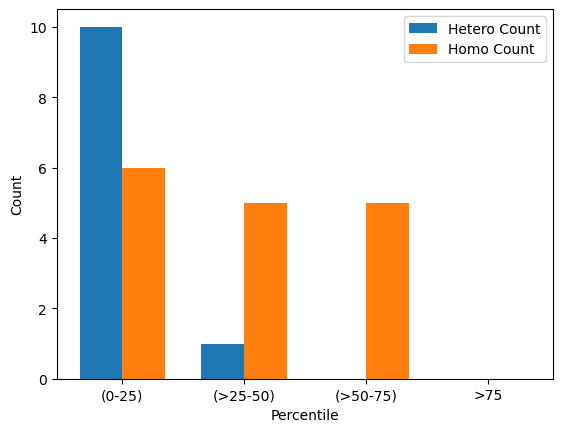

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample DataFrame
data = {
    'Sample': [12652713, 12652713, 12652713, 12652713],
    'Percentile': ["(0-25)", "(>25-50)", "(>50-75)", ">75"],
    'Hetero_count': [10, 1, 0, 0],
    'Homo_count': [6, 5, 5, 0]
}

df = pd.DataFrame(data)

# Create positions for bars
x = np.arange(len(df))

# Set width of bars
width = 0.35

# Create the figure and axis
fig, ax = plt.subplots()

# Create bar chart for Hetero_count
ax.bar(x - width/2, df['Hetero_count'], width, label='Hetero Count')

# Create bar chart for Homo_count
ax.bar(x + width/2, df['Homo_count'], width, label='Homo Count')

# Set x-axis ticks and labels
ax.set_xticks(x)
ax.set_xticklabels(df['Percentile'])
ax.set_xlabel('Percentile')

# Set y-axis label
ax.set_ylabel('Count')

# Adding legend
ax.legend()

# Show the plot
plt.show()


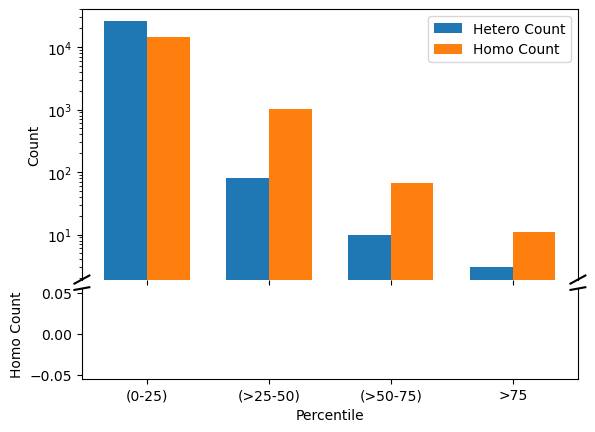

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample DataFrame
data = {
    'Sample': [12652713, 12652713, 12652713, 12652713],
    'Percentile': ["(0-25)", "(>25-50)", "(>50-75)", ">75"],
    'Hetero_count': [25675, 81, 10, 3],
    'Homo_count': [14293, 1004, 68, 11]
}

df = pd.DataFrame(data)

# Create positions for bars
x = np.arange(len(df))

# Set width of bars
width = 0.35

# Create the figure and axis
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.05)

# Bar chart for Hetero_count (make bars for certain categories wider)
ax1.bar(x - width/2, df['Hetero_count'], width, label='Hetero Count')

# Bar chart for Homo_count (overlaying on ax1)
ax1.bar(x + width/2, df['Homo_count'], width, label='Homo Count')

# Setting y-axis label for the top subplot
ax1.set_ylabel('Count')

# Set y-axis scale to logarithmic
ax1.set_yscale('log')

# Create a broken y-axis for the bottom subplot
ax2.spines['top'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.tick_params(labeltop=False)

d = .015
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot([-d, +d], [-d, +d], **kwargs)
ax1.plot([1 - d, 1 + d], [-d, +d], **kwargs)

kwargs.update(transform=ax2.transAxes)
ax2.plot([-d, +d], [1 - d, 1 + d], **kwargs)
ax2.plot([1 - d, 1 + d], [1 - d, 1 + d], **kwargs)

# Setting y-axis label for the bottom subplot
ax2.set_ylabel('Homo Count')

# Set x-axis ticks and labels
ax2.set_xticks(x)
ax2.set_xticklabels(df['Percentile'])
ax2.set_xlabel('Percentile')

# Adding legend to the top subplot
ax1.legend()


# Show the plot
plt.show()


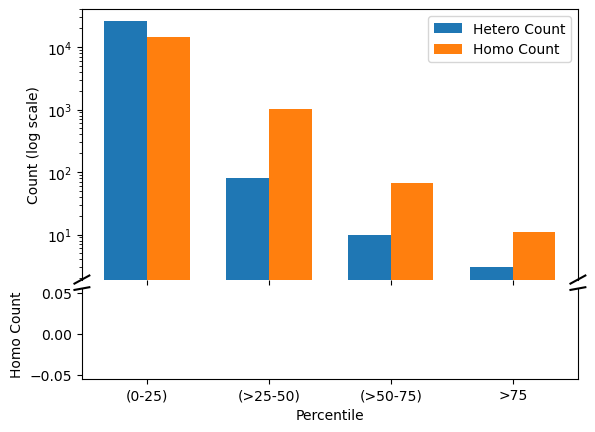

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample DataFrame
data = {
    'Sample': [12652713, 12652713, 12652713, 12652713],
    'Percentile': ["(0-25)", "(>25-50)", "(>50-75)", ">75"],
    'Hetero_count': [25675, 81, 10, 3],
    'Homo_count': [14293, 1004, 68, 11]
}

df = pd.DataFrame(data)

# Create positions for bars
x = np.arange(len(df))

# Set width of bars
width = 0.35

# Create the figure and axis
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.05)

# Bar chart for Hetero_count (make bars for certain categories wider)
ax1.bar(x - width/2, df['Hetero_count'], width, label='Hetero Count')

# Bar chart for Homo_count (overlaying on ax1)
ax1.bar(x + width/2, df['Homo_count'], width, label='Homo Count')

# Apply logarithmic scale to the y-axis of the top subplot
ax1.set_yscale('log')

# Setting y-axis label for the top subplot
ax1.set_ylabel('Count (log scale)')

# Create a broken y-axis for the bottom subplot
ax2.spines['top'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.tick_params(labeltop=False)

d = .015
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot([-d, +d], [-d, +d], **kwargs)
ax1.plot([1 - d, 1 + d], [-d, +d], **kwargs)

kwargs.update(transform=ax2.transAxes)
ax2.plot([-d, +d], [1 - d, 1 + d], **kwargs)
ax2.plot([1 - d, 1 + d], [1 - d, 1 + d], **kwargs)

# Setting y-axis label for the bottom subplot
ax2.set_ylabel('Homo Count')

# Set x-axis ticks and labels
ax2.set_xticks(x)
ax2.set_xticklabels(df['Percentile'])

# Set custom x-axis labels
custom_labels = ["(0-25)", "(>25-50)", "(>50-75)", ">75"]
ax2.set_xticklabels(custom_labels)

ax2.set_xlabel('Percentile')

# Adding legend to the top subplot
ax1.legend()

# Show the plot
plt.show()


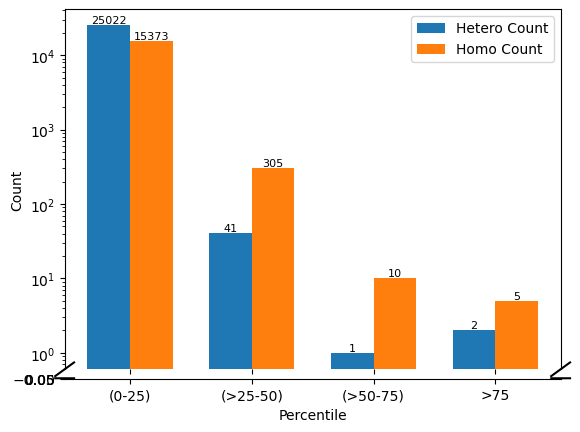

In [127]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample DataFrame
data = {
    'Sample': [17751406, 17751406, 17751406, 17751406],
    'Percentile': ["(0-25)", "(>25-50)", "(>50-75)", ">75"],
    'Hetero_count': [25022, 41, 1, 2],
    'Homo_count': [15373, 305, 10, 5]
}

df = pd.DataFrame(data)

# Create positions for bars
x = np.arange(len(df))

# Set width of bars
width = 0.35

# Create the figure and axis
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [2000, 2.5]})
plt.subplots_adjust(hspace=0.05)

# Bar chart for Hetero_count (make bars for certain categories wider)
hetero_bars = ax1.bar(x - width/2, df['Hetero_count'], width, label='Hetero Count')

# Bar chart for Homo_count (overlaying on ax1)
homo_bars = ax1.bar(x + width/2, df['Homo_count'], width, label='Homo Count')

# Apply logarithmic scale to the y-axis of the top subplot
ax1.set_yscale('log')

# Setting y-axis label for the top subplot
ax1.set_ylabel('Count')

# Add labels inside the bars
for bar in hetero_bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height, str(height), ha='center', va='bottom', fontsize=8)

for bar in homo_bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height, str(height), ha='center', va='bottom', fontsize=8)

# Create a broken y-axis for the bottom subplot
ax2.spines['top'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.tick_params(labeltop=False)

d = .019
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot([-d, +d], [-d, +d], **kwargs)
ax1.plot([1 - d, 1 + d], [-d, +d], **kwargs)

kwargs.update(transform=ax2.transAxes)
ax2.plot([-d, +d], [1 - d, 1 + d], **kwargs)
ax2.plot([1 - d, 1 + d], [1 - d, 1 + d], **kwargs)

# Setting y-axis label for the bottom subplot
ax2.set_ylabel('')

# Set x-axis ticks and labels
ax2.set_xticks(x)
ax2.set_xticklabels(df['Percentile'])

# Set custom x-axis labels
custom_labels = ["(0-25)", "(>25-50)", "(>50-75)", ">75"]
ax2.set_xticklabels(custom_labels)

ax2.set_xlabel('Percentile')

# Adding legend to the top subplot
ax1.legend()

plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/2_madhu_sample.png', dpi=2000, bbox_inches='tight')

# Show the plot
plt.show()

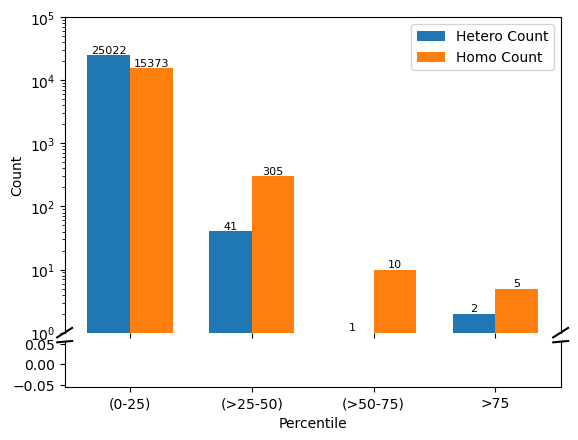

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample DataFrame
data = {
    'Sample': [17751406, 17751406, 17751406, 17751406],
    'Percentile': ["(0-25)", "(>25-50)", "(>50-75)", ">75"],
    'Hetero_count': [25022, 41, 1, 2],
    'Homo_count': [15373, 305, 10, 5]
}

df = pd.DataFrame(data)

# Create positions for bars
x = np.arange(len(df))

# Set width of bars
width = 0.35

# Create the figure and axis
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [7, 1]})
plt.subplots_adjust(hspace=0.05)

# Bar chart for Hetero_count (make bars for certain categories wider)
hetero_bars = ax1.bar(x - width/2, df['Hetero_count'], width, label='Hetero Count')

# Bar chart for Homo_count (overlaying on ax1)
homo_bars = ax1.bar(x + width/2, df['Homo_count'], width, label='Homo Count')

# Apply logarithmic scale to the y-axis of the top subplot
ax1.set_yscale('log')

# Setting y-axis label for the top subplot
ax1.set_ylabel('Count')

# Adjust y-axis limits to show the desired scale after 10^4
ax1.set_ylim(bottom=1, top=10**5)

# Add labels inside the bars
for bar in hetero_bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height, str(height), ha='center', va='bottom', fontsize=8)

for bar in homo_bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height, str(height), ha='center', va='bottom', fontsize=8)

# Create a broken y-axis for the bottom subplot
ax2.spines['top'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.tick_params(labeltop=False)

d = .015
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot([-d, +d], [-d, +d], **kwargs)
ax1.plot([1 - d, 1 + d], [-d, +d], **kwargs)

kwargs.update(transform=ax2.transAxes)
ax2.plot([-d, +d], [1 - d, 1 + d], **kwargs)
ax2.plot([1 - d, 1 + d], [1 - d, 1 + d], **kwargs)

# Setting y-axis label for the bottom subplot
ax2.set_ylabel('')

# Set x-axis ticks and labels
ax2.set_xticks(x)
ax2.set_xticklabels(df['Percentile'])

# Set custom x-axis labels
custom_labels = ["(0-25)", "(>25-50)", "(>50-75)", ">75"]
ax2.set_xticklabels(custom_labels)

ax2.set_xlabel('Percentile')

# Adding legend to the top subplot
ax1.legend()

# Show the plot
plt.show()

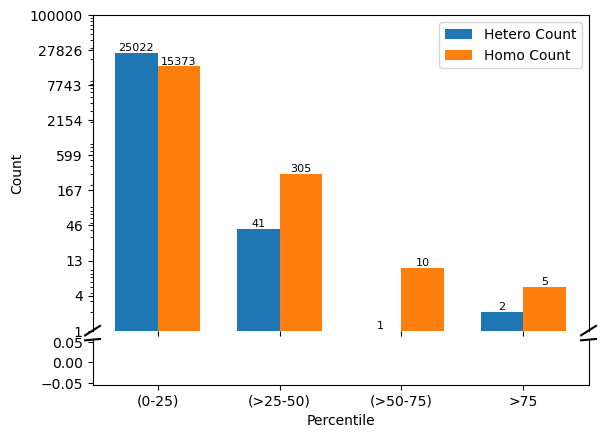

In [126]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample DataFrame
data = {
    'Sample': [17751406, 17751406, 17751406, 17751406],
    'Percentile': ["(0-25)", "(>25-50)", "(>50-75)", ">75"],
    'Hetero_count': [25022, 41, 1, 2],
    'Homo_count': [15373, 305, 10, 5]
}

df = pd.DataFrame(data)

# Create positions for bars
x = np.arange(len(df))

# Set width of bars
width = 0.35

# Create the figure and axis
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [7, 1]})
plt.subplots_adjust(hspace=0.05)

# Bar chart for Hetero_count (make bars for certain categories wider)
hetero_bars = ax1.bar(x - width/2, df['Hetero_count'], width, label='Hetero Count')

# Bar chart for Homo_count (overlaying on ax1)
homo_bars = ax1.bar(x + width/2, df['Homo_count'], width, label='Homo Count')

# Apply logarithmic scale to the y-axis of the top subplot
ax1.set_yscale('log')

# Setting y-axis label for the top subplot
ax1.set_ylabel('Count')

# Adjust y-axis limits to show the desired scale after 10^4
ax1.set_ylim(bottom=1, top=10**3)

# Set the number of ticks and labels for the y-axis
num_ticks = 10  # You can adjust this number to your preference
y_ticks = np.logspace(0, 5, num=num_ticks)
ax1.set_yticks(y_ticks)
ax1.get_yaxis().set_major_formatter(plt.ScalarFormatter())

# Add labels inside the bars
for bar in hetero_bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height, str(height), ha='center', va='bottom', fontsize=8)

for bar in homo_bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height, str(height), ha='center', va='bottom', fontsize=8)

# Create a broken y-axis for the bottom subplot
ax2.spines['top'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.tick_params(labeltop=False)

d = .015
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot([-d, +d], [-d, +d], **kwargs)
ax1.plot([1 - d, 1 + d], [-d, +d], **kwargs)

kwargs.update(transform=ax2.transAxes)
ax2.plot([-d, +d], [1 - d, 1 + d], **kwargs)
ax2.plot([1 - d, 1 + d], [1 - d, 1 + d], **kwargs)

# Setting y-axis label for the bottom subplot
ax2.set_ylabel('')

# Set x-axis ticks and labels
ax2.set_xticks(x)
ax2.set_xticklabels(df['Percentile'])

# Set custom x-axis labels
custom_labels = ["(0-25)", "(>25-50)", "(>50-75)", ">75"]
ax2.set_xticklabels(custom_labels)

ax2.set_xlabel('Percentile')

# Adding legend to the top subplot
ax1.legend()

# Show the plot
plt.show()


In [9]:
import pandas as pd
df = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/3genes_with_percentile.xlsx')
df

,samples,GENE,ID,Zygosity,normalized_column,percentile
0,17751406,HLA-DQB1,rs1049133,Homozygous,0.156747,0-25
1,17751406,HLA-DQB1,rs1049130,Homozygous,0.189428,0-25
2,17751406,HLA-DQB1,rs1049088,Homozygous,0.189428,0-25
3,17751406,HLA-DQB1,rs1049100,Homozygous,0.254993,0-25
4,17751406,HLA-DQB1,rs68027833,Homozygous,0.070202,0-25
...,...,...,...,...,...,...
109,12652713,HLA-DQA1,rs1130116,Heterozygous,0.384459,0-25
110,12652713,HLA-DQA1,rs36027005,Heterozygous,0.075505,0-25
111,12652713,HLA-DQA1,rs35444025,Heterozygous,0.036832,0-25
112,12652713,HLA-DQA1,rs62404094,Heterozygous,0.014268,0-25


In [10]:
# Group the data by "Sample" and "Percentile" columns
grouped_data = df.groupby(['samples', 'percentile'])

# Define a function to calculate HET and HOM counts
def calculate_counts(group):
    het_count = (group['Zygosity'] == 'Heterozygous').sum()
    hom_count = (group['Zygosity'] == 'Homozygous').sum()
    return pd.Series({'HET': het_count, 'HOM': hom_count})

# Apply the function to each group and reset the index
result = grouped_data.apply(calculate_counts).reset_index()

# The 'result' DataFrame now contains HET and HOM counts for each sample at each percentile
result

,samples,percentile,HET,HOM
0,12652713,0-25,50,2
1,17751406,0-25,0,62


In [4]:
result.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/grouped_df_new14_genes.xlsx', index=False)

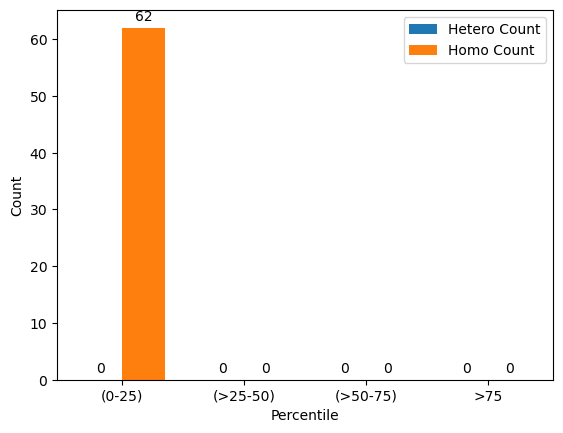

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample DataFrame
data = {
    'Sample': [17751406, 17751406, 17751406, 17751406],
    'Percentile': ["(0-25)", "(>25-50)", "(>50-75)", ">75"],
    'Hetero_count': [0, 0, 0, 0],
    'Homo_count': [62, 0, 0, 0]
}

df = pd.DataFrame(data)

# Create positions for bars
x = np.arange(len(df))

# Set width of bars
width = 0.35

# Create the figure and axis
fig, ax = plt.subplots()

# Create bar chart for Hetero_count
bar1 = ax.bar(x - width/2, df['Hetero_count'], width, label='Hetero Count')

# Create bar chart for Homo_count
bar2 = ax.bar(x + width/2, df['Homo_count'], width, label='Homo Count')

# Set x-axis ticks and labels
ax.set_xticks(x)
ax.set_xticklabels(df['Percentile'])
ax.set_xlabel('Percentile')

# Set y-axis label
ax.set_ylabel('Count')

# Adding data labels
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bar1)
add_labels(bar2)

# Adding legend
ax.legend()

plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/3_genes_new_17751406.svg', dpi=450, bbox_inches='tight')

# Show the plot
plt.show()

Locator attempting to generate 26275 ticks ([0.0, ..., 26274.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 26275 ticks ([0.0, ..., 26274.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 26275 ticks ([0.0, ..., 26274.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 26275 ticks ([0.0, ..., 26274.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 26275 ticks ([0.0, ..., 26274.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 26275 ticks ([0.0, ..., 26274.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 26275 ticks ([0.0, ..., 26274.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 26275 ticks ([0.0, ..., 26274.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 26275 ticks ([0.0, ..., 26274.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 26275 ticks ([0.0, ..., 

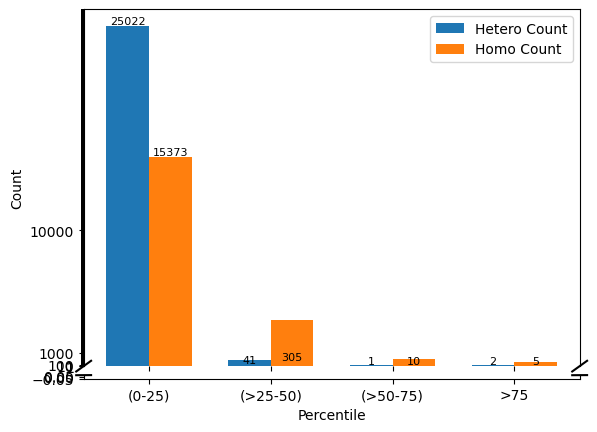

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import LogLocator, MultipleLocator, ScalarFormatter

# Sample DataFrame
data = {
    'Sample': [17751406, 17751406, 17751406, 17751406],
    'Percentile': ["(0-25)", "(>25-50)", "(>50-75)", ">75"],
    'Hetero_count': [25022, 41, 1, 2],
    'Homo_count': [15373, 305, 10, 5]
}

df = pd.DataFrame(data)

# Create positions for bars
x = np.arange(len(df))

# Set width of bars
width = 0.35

# Create the figure and axis
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [100, 1]})
plt.subplots_adjust(hspace=0.05)

# Bar chart for Hetero_count (make bars for certain categories wider)
hetero_bars = ax1.bar(x - width/2, df['Hetero_count'], width, label='Hetero Count')

# Bar chart for Homo_count (overlaying on ax1)
homo_bars = ax1.bar(x + width/2, df['Homo_count'], width, label='Homo Count')

# Apply different y-axis scaling functions for each range
def scale_function(y, category):
    if category == "(>25-50)":
        return y / 0.09
    elif category in ["(>50-75)", ">75"]:
        return y / 0.018
    else:
        return y

ax1.yaxis.set_major_locator(LogLocator(subs=[1.0]))
ax1.yaxis.set_major_formatter(ScalarFormatter())
ax1.yaxis.set_minor_locator(MultipleLocator(base=1))

for i, bar in enumerate(hetero_bars):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height, str(height), ha='center', va='bottom', fontsize=8)

for i, bar in enumerate(homo_bars):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height, str(height), ha='center', va='bottom', fontsize=8)

# Apply scaling functions to the counts based on categories
for i, (h_bar, g_bar) in enumerate(zip(hetero_bars, homo_bars)):
    h_height = h_bar.get_height()
    g_height = g_bar.get_height()
    category = df['Percentile'][i]
    h_bar.set_height(scale_function(h_height, category))
    g_bar.set_height(scale_function(g_height, category))

# Setting y-axis label for the top subplot
ax1.set_ylabel('Count')

# Create a broken y-axis for the bottom subplot
ax2.spines['top'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.tick_params(labeltop=False)

d = .015
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot([-d, +d], [-d, +d], **kwargs)
ax1.plot([1 - d, 1 + d], [-d, +d], **kwargs)

kwargs.update(transform=ax2.transAxes)
ax2.plot([-d, +d], [1 - d, 1 + d], **kwargs)
ax2.plot([1 - d, 1 + d], [1 - d, 1 + d], **kwargs)

# Setting y-axis label for the bottom subplot
ax2.set_ylabel('')

# Set x-axis ticks and labels
ax2.set_xticks(x)
ax2.set_xticklabels(df['Percentile'])

# Set custom x-axis labels
custom_labels = ["(0-25)", "(>25-50)", "(>50-75)", ">75"]
ax2.set_xticklabels(custom_labels)

ax2.set_xlabel('Percentile')

# Adding legend to the top subplot
ax1.legend()

plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Final_17751406.svg', dpi=250, bbox_inches='tight')

# Show the plot
plt.show()

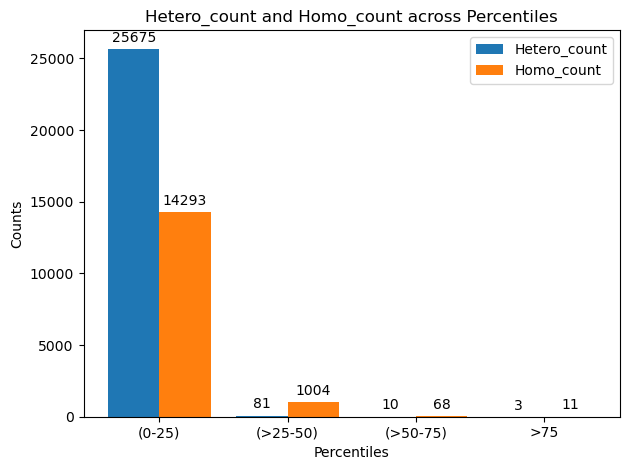

In [98]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
percentiles = ['(0-25)', '(>25-50)', '(>50-75)', '>75']
hetero_counts = [25675, 81, 10, 3]
homo_counts = [14293, 1004, 68, 11]

# Bar width
bar_width = 0.4

# X-axis positions for the bars
x = np.arange(len(percentiles))

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the bars
hetero_bars = ax.bar(x - bar_width/2, hetero_counts, bar_width, label='Hetero_count')
homo_bars = ax.bar(x + bar_width/2, homo_counts, bar_width, label='Homo_count')

# Add labels, title, and legend
ax.set_xlabel('Percentiles')
ax.set_ylabel('Counts')
ax.set_title('Hetero_count and Homo_count across Percentiles')
ax.set_xticks(x)
ax.set_xticklabels(percentiles)
ax.legend()

# Add values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(height),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(hetero_bars)
add_labels(homo_bars)

# Display the plot
plt.tight_layout()
plt.show()

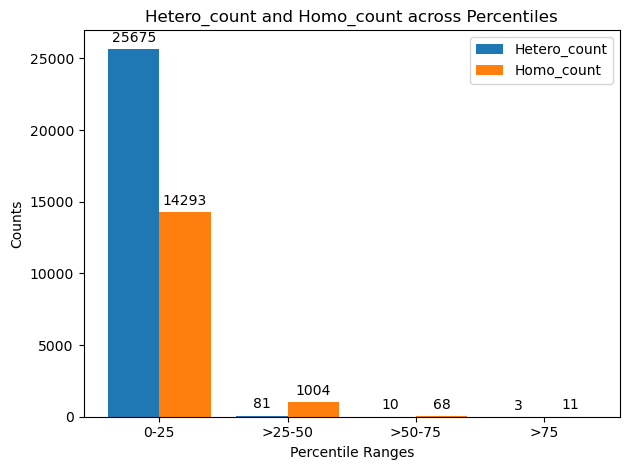

In [104]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
percentile_ranges = ['0-25', '>25-50', '>50-75', '>75']
hetero_counts = [25022, 41, 1, 2]
homo_counts = [15373, 305, 10, 5]

# Bar width
bar_width = 0.4

# X-axis positions for the bars
x = np.arange(len(percentile_ranges))

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the bars
hetero_bars = ax.bar(x - bar_width/2, hetero_counts, bar_width, label='Hetero_count')
homo_bars = ax.bar(x + bar_width/2, homo_counts, bar_width, label='Homo_count')

# Add labels, title, and legend
ax.set_xlabel('Percentile Ranges')
ax.set_ylabel('Counts')
ax.set_title('Hetero_count and Homo_count across Percentiles')
ax.set_xticks(x)
ax.set_xticklabels(percentile_ranges)
ax.legend()

# Add values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(height),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(hetero_bars)
add_labels(homo_bars)

# Display the plot
plt.tight_layout()
plt.show()


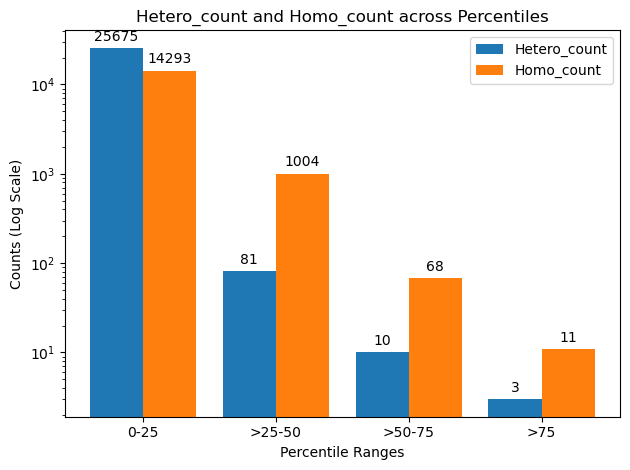

In [116]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
percentile_ranges = ['0-25', '>25-50', '>50-75', '>75']
hetero_counts = [25675, 81, 10, 3]
homo_counts = [14293, 1004, 68, 11]

# Bar width
bar_width = 0.4

# X-axis positions for the bars
x = np.arange(len(percentile_ranges))

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the bars with logarithmic y-axis
hetero_bars = ax.bar(x - bar_width/2, hetero_counts, bar_width, label='Hetero_count', log=True)
homo_bars = ax.bar(x + bar_width/2, homo_counts, bar_width, label='Homo_count', log=True)

# Add labels, title, and legend
ax.set_xlabel('Percentile Ranges')
ax.set_ylabel('Counts (Log Scale)')
ax.set_title('Hetero_count and Homo_count across Percentiles')
ax.set_xticks(x)
ax.set_xticklabels(percentile_ranges)
ax.legend()

# Add values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(height),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(hetero_bars)
add_labels(homo_bars)

# Display the plot
plt.tight_layout()
plt.show()


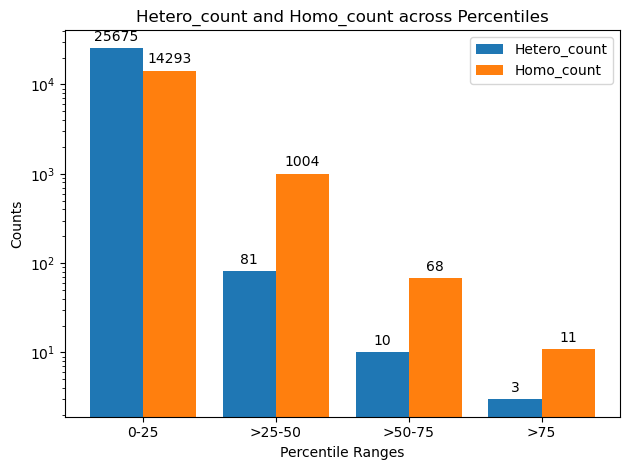

In [117]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
percentile_ranges = ['0-25', '>25-50', '>50-75', '>75']
hetero_counts = [25675, 81, 10, 3]
homo_counts = [14293, 1004, 68, 11]

# Bar width
bar_width = 0.4

# X-axis positions for the bars
x = np.arange(len(percentile_ranges))

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the bars with logarithmic y-axis
hetero_bars = ax.bar(x - bar_width/2, hetero_counts, bar_width, label='Hetero_count', log=False)  # Non-logarithmic scale
homo_bars = ax.bar(x + bar_width/2, homo_counts, bar_width, label='Homo_count', log=True)

# Add labels, title, and legend
ax.set_xlabel('Percentile Ranges')
ax.set_ylabel('Counts')
ax.set_title('Hetero_count and Homo_count across Percentiles')
ax.set_xticks(x)
ax.set_xticklabels(percentile_ranges)
ax.legend()

# Add values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(height),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(hetero_bars)
add_labels(homo_bars)

# Display the plot
plt.tight_layout()
plt.show()


In [52]:
df = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/14_genes_2_Samples_percentile_MODY_VEP.xlsx')
df

,Uploaded_variation,Location,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,SYMBOL_SOURCE,HGNC_ID,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,SIFT,PolyPhen,AF,gnomADe_AF,gnomADe_AFR_AF,gnomADe_AMR_AF,gnomADe_ASJ_AF,gnomADe_EAS_AF,gnomADe_FIN_AF,gnomADe_NFE_AF,gnomADe_OTH_AF,gnomADe_SAS_AF,gnomADg_AF,gnomADg_AFR_AF,gnomADg_AMI_AF,gnomADg_AMR_AF,gnomADg_ASJ_AF,gnomADg_EAS_AF,gnomADg_FIN_AF,gnomADg_MID_AF,gnomADg_NFE_AF,gnomADg_OTH_AF,gnomADg_SAS_AF,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS
0,rs3842753,11:2159830-2159830,A,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000250971.7,protein_coding,3/3,-,-,-,452,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,-,-,1,P1,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-
1,rs3842753,11:2159830-2159830,G,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000250971.7,protein_coding,3/3,-,-,-,452,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,-,-,1,P1,-,-,0.6492,0.7334,0.2416,0.7682,0.7015,0.9533,0.7966,0.7187,0.7363,0.8331,0.6105,0.2602,0.6623,0.7245,0.7098,0.9485,0.7927,0.793,0.7193,0.671,0.8309,benign,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-
2,rs3842753,11:2159830-2159830,A,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000381330.5,protein_coding,3/3,-,-,-,414,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,NM_000207.3,-,1,P1,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-
3,rs3842753,11:2159830-2159830,G,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000381330.5,protein_coding,3/3,-,-,-,414,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,NM_000207.3,-,1,P1,-,-,0.6492,0.7334,0.2416,0.7682,0.7015,0.9533,0.7966,0.7187,0.7363,0.8331,0.6105,0.2602,0.6623,0.7245,0.7098,0.9485,0.7927,0.793,0.7193,0.671,0.8309,benign,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-
4,rs3842753,11:2159830-2159830,A,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000397262.5,protein_coding,2/2,-,-,-,588,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,-,-,1,P1,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1391,rs4841557,8:11558063-11558063,G,regulatory_region_variant,MODIFIER,-,-,RegulatoryFeature,ENSR00000847806,CTCF_binding_site,-,-,-,-,-,-,-,-,-,"rs4841557,COSV52049361",-,-,-,-,-,-,-,-,-,-,-,0.4599,0.5214,0.6393,0.3751,0.6601,0.06039,0.5667,0.6186,0.5653,0.4536,0.5752,0.63,0.398,0.4645,0.6542,0.05874,0.5529,0.6465,0.618,0.5602,0.4343,benign,"0,1","1,1",-,-,-,-,-,-
1392,rs8193019,9:133064589-133064589,A,intron_variant,MODIFIER,CEL,ENSG00000170835,Transcript,ENST00000372080.8,protein_coding,-,2/10,-,-,-,-,-,-,-,"rs8193019,COSV60827375",-,1,-,HGNC,HGNC:1848,NM_001807.6,-,5,P1,-,-,0.0284,0.0173,0.01422,0.00406,0.02455,0.03823,0.0187,0.01214,0.01441,0.03763,0.01498,0.01486,0.001096,0.004712,0.03091,0.04101,0.01884,0.006329,0.01269,0.01148,0.03784,likely_benign,"0,1","1,1",-,-,-,-,-,-
1393,rs62576769,9:133069199-133069199,A,missense_variant,MODERATE,CEL,ENSG00000170835,Transcript,ENST00000372080.8,protein_coding,9/11,-,-,-,1248,1226,409,T/N,aCc/aAc,"rs62576769,COSV60826286",-,1,-,HGNC,HGNC:1848,NM_001807.6,-,5,P1,deleterious(0),probably_damaging(1),-,-,-,-,-,-,-,-,-,-,0.000011,0,0,0,0,0,0,0,0.000021,0,0,-,"0,1","1,1",-,-,-,-,-,-
1394,rs62576769,9:133069199-133069199,G,missense_variant,MODERATE,CEL,ENSG00000170835,Transcript,ENST00000372080.8,protein_coding,9/11,-,-,-,1248,1226,409,T

In [53]:
data = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/14_genes_2_Samples_new_vep_data_variants.xlsx')
data

,Uploaded_variation,Location,ALT
0,rs142970758,2:10052362-10052362,A
1,rs11687357,2:10048522-10048522,T
2,rs1801262,2:181678728-181678728,C
3,rs10510791,3:57260057-57260057,G
4,rs712701,7:127611134-127611134,G
5,rs594141,7:127614403-127614403,A
6,rs712700,7:127610853-127610853,C
7,rs2233579,7:127614447-127614447,T
8,rs2268574,7:44149722-44149722,G
9,rs2070971,7:44157984-44157984,T


In [54]:
merged_df = pd.merge(df, data, on = ['Uploaded_variation', 'Location'], how = 'left', sort=False)
merged_df

,Uploaded_variation,Location,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,SYMBOL_SOURCE,HGNC_ID,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,SIFT,PolyPhen,AF,gnomADe_AF,gnomADe_AFR_AF,gnomADe_AMR_AF,gnomADe_ASJ_AF,gnomADe_EAS_AF,gnomADe_FIN_AF,gnomADe_NFE_AF,gnomADe_OTH_AF,gnomADe_SAS_AF,gnomADg_AF,gnomADg_AFR_AF,gnomADg_AMI_AF,gnomADg_AMR_AF,gnomADg_ASJ_AF,gnomADg_EAS_AF,gnomADg_FIN_AF,gnomADg_MID_AF,gnomADg_NFE_AF,gnomADg_OTH_AF,gnomADg_SAS_AF,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,ALT
0,rs3842753,11:2159830-2159830,A,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000250971.7,protein_coding,3/3,-,-,-,452,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,-,-,1,P1,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-,G
1,rs3842753,11:2159830-2159830,G,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000250971.7,protein_coding,3/3,-,-,-,452,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,-,-,1,P1,-,-,0.6492,0.7334,0.2416,0.7682,0.7015,0.9533,0.7966,0.7187,0.7363,0.8331,0.6105,0.2602,0.6623,0.7245,0.7098,0.9485,0.7927,0.793,0.7193,0.671,0.8309,benign,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-,G
2,rs3842753,11:2159830-2159830,A,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000381330.5,protein_coding,3/3,-,-,-,414,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,NM_000207.3,-,1,P1,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-,G
3,rs3842753,11:2159830-2159830,G,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000381330.5,protein_coding,3/3,-,-,-,414,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,NM_000207.3,-,1,P1,-,-,0.6492,0.7334,0.2416,0.7682,0.7015,0.9533,0.7966,0.7187,0.7363,0.8331,0.6105,0.2602,0.6623,0.7245,0.7098,0.9485,0.7927,0.793,0.7193,0.671,0.8309,benign,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-,G
4,rs3842753,11:2159830-2159830,A,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000397262.5,protein_coding,2/2,-,-,-,588,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,-,-,1,P1,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-,G
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1391,rs4841557,8:11558063-11558063,G,regulatory_region_variant,MODIFIER,-,-,RegulatoryFeature,ENSR00000847806,CTCF_binding_site,-,-,-,-,-,-,-,-,-,"rs4841557,COSV52049361",-,-,-,-,-,-,-,-,-,-,-,0.4599,0.5214,0.6393,0.3751,0.6601,0.06039,0.5667,0.6186,0.5653,0.4536,0.5752,0.63,0.398,0.4645,0.6542,0.05874,0.5529,0.6465,0.618,0.5602,0.4343,benign,"0,1","1,1",-,-,-,-,-,-,G
1392,rs8193019,9:133064589-133064589,A,intron_variant,MODIFIER,CEL,ENSG00000170835,Transcript,ENST00000372080.8,protein_coding,-,2/10,-,-,-,-,-,-,-,"rs8193019,COSV60827375",-,1,-,HGNC,HGNC:1848,NM_001807.6,-,5,P1,-,-,0.0284,0.0173,0.01422,0.00406,0.02455,0.03823,0.0187,0.01214,0.01441,0.03763,0.01498,0.01486,0.001096,0.004712,0.03091,0.04101,0.01884,0.006329,0.01269,0.01148,0.03784,likely_benign,"0,1","1,1",-,-,-,-,-,-,A
1393,rs62576769,9:133069199-133069199,A,missense_variant,MODERATE,CEL,ENSG00000170835,Transcript,ENST00000372080.8,protein_coding,9/11,-,-,-,1248,1226,409,T/N,aCc/aAc,"rs62576769,COSV60826286",-,1,-,HGNC,HGNC:1848,NM_001807.6,-,5,P1,deleterious(0),probably_damaging(1),-,-,-,-,-,-,-,-,-,-,0.000011,0,0,0,0,0,0,0,0.000021,0,0,-,"0,1","1,1",-,-,-,-,-,-,T
1394,rs62576769,9:133069199-133069199,G,missense_variant,MODERATE,CEL,ENSG00000170835,Transcript,ENST00000372080.8,protein_coding,9/

In [10]:
merged_df.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/new_vep_data.xlsx', index=False)

In [55]:
matching_rows = merged_df[merged_df['Allele'] == merged_df['ALT']]
matching_rows

,Uploaded_variation,Location,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,SYMBOL_SOURCE,HGNC_ID,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,SIFT,PolyPhen,AF,gnomADe_AF,gnomADe_AFR_AF,gnomADe_AMR_AF,gnomADe_ASJ_AF,gnomADe_EAS_AF,gnomADe_FIN_AF,gnomADe_NFE_AF,gnomADe_OTH_AF,gnomADe_SAS_AF,gnomADg_AF,gnomADg_AFR_AF,gnomADg_AMI_AF,gnomADg_AMR_AF,gnomADg_ASJ_AF,gnomADg_EAS_AF,gnomADg_FIN_AF,gnomADg_MID_AF,gnomADg_NFE_AF,gnomADg_OTH_AF,gnomADg_SAS_AF,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,ALT
1,rs3842753,11:2159830-2159830,G,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000250971.7,protein_coding,3/3,-,-,-,452,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,-,-,1,P1,-,-,0.6492,0.7334,0.2416,0.7682,0.7015,0.9533,0.7966,0.7187,0.7363,0.8331,0.6105,0.2602,0.6623,0.7245,0.7098,0.9485,0.7927,0.793,0.7193,0.671,0.8309,benign,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-,G
3,rs3842753,11:2159830-2159830,G,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000381330.5,protein_coding,3/3,-,-,-,414,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,NM_000207.3,-,1,P1,-,-,0.6492,0.7334,0.2416,0.7682,0.7015,0.9533,0.7966,0.7187,0.7363,0.8331,0.6105,0.2602,0.6623,0.7245,0.7098,0.9485,0.7927,0.793,0.7193,0.671,0.8309,benign,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-,G
5,rs3842753,11:2159830-2159830,G,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000397262.5,protein_coding,2/2,-,-,-,588,-,-,-,-,rs3842753,-,-1,-,HGNC,HGNC:6081,-,-,1,P1,-,-,0.6492,0.7334,0.2416,0.7682,0.7015,0.9533,0.7966,0.7187,0.7363,0.8331,0.6105,0.2602,0.6623,0.7245,0.7098,0.9485,0.7927,0.793,0.7193,0.671,0.8309,benign,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-,G
7,rs3842753,11:2159830-2159830,G,missense_variant,MODERATE,INS,ENSG00000254647,Transcript,ENST00000421783.1,non_stop_decay,2/2,-,-,-,417,230,77,H/P,cAc/cCc,rs3842753,-,-1,cds_end_NF,HGNC,HGNC:6081,-,-,2,-,tolerated(0.21),benign(0),0.6492,0.7334,0.2416,0.7682,0.7015,0.9533,0.7966,0.7187,0.7363,0.8331,0.6105,0.2602,0.6623,0.7245,0.7098,0.9485,0.7927,0.793,0.7193,0.671,0.8309,benign,-,1,"32171244,19956101,19956106,19833889,19956109,2...",-,-,-,-,-,G
8,rs3842752,11:2159843-2159843,A,3_prime_UTR_variant,MODIFIER,INS,ENSG00000254647,Transcript,ENST00000250971.7,protein_coding,3/3,-,-,-,439,-,-,-,-,"rs3842752,CR032720,COSV51746935",-,-1,-,HGNC,HGNC:6081,-,-,1,P1,-,-,0.1268,0.1728,0.0953,0.1722,0.2167,0.03709,0.1525,0.2181,0.1898,0.1254,0.1655,0.09817,0.3161,0.1611,0.2142,0.04144,0.155,0.07911,0.2178,0.1424,0.13,"association,benign,likely_benign","0,0,1","1,1,1","25741868,21270831,17348446,21708937,21926269,1...",-,-,-,-,-,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1389,rs4841557,8:11558063-11558063,G,"intron_variant,non_coding_transcript_variant",MODIFIER,BLK,ENSG00000136573,Transcript,ENST00000645242.1,protein_coding_CDS_not_defined,-,9/11,-,-,-,-,-,-,-,"rs4841557,COSV52049361",-,1,-,HGNC,HGNC:1057,-,-,-,-,-,-,0.4599,0.5214,0.6393,0.3751,0.6601,0.06039,0.5667,0.6186,0.5653,0.4536,0.5752,0.63,0.398,0.4645,0.6542,0.05874,0.5529,0.6465,0.618,0.5602,0.4343,benign,"0,1","1,1",-,-,-,-,-,-,G
1390,rs4841557,8:11558063-11558063,G,"intron_variant,non_coding_transcript_variant",MODIFIER,BLK,ENSG00000136573,Transcript,ENST00000696154.2,protein_coding_CDS_not_defined,-,9/11,-,-,-,-,-,-,-,"rs4841557,COSV52049361",-,1,-,HGNC,HGNC:1057,-,-,-,-,-,-,0.4599,0.5214,0.6393,0.3751,0.6601,0.06039,0.5667,0.6186,0.5653,0.4536,0.5752,0.63,0.398,0.4645,0.6542,0.05874,0.5529,0.6465,0.618,0.5602,0.4343,benign,"0,1","1,1",-,-,-,-,-,-,G
13

In [56]:
grouped_data = matching_rows.groupby(['Uploaded_variation', 'Location', 'Allele']).agg(lambda x: ', '.join(x.unique())).reset_index()
grouped_data

,Uploaded_variation,Location,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,Amino_acids,Codons,Existing_variation,DISTANCE,FLAGS,SYMBOL_SOURCE,HGNC_ID,MANE_SELECT,MANE_PLUS_CLINICAL,APPRIS,SIFT,PolyPhen,CLIN_SIG,SOMATIC,MOTIF_NAME,HIGH_INF_POS,TRANSCRIPTION_FACTORS,ALT
0,rs1048099,11:17474969-17474969,G,"synonymous_variant, non_coding_transcript_exon...","LOW, MODIFIER",ABCC8,ENSG00000006071,Transcript,"ENST00000302539.9, ENST00000389817.8, ENST0000...","protein_coding, retained_intron, nonsense_medi...","2/39, 2/34, 2/12, 2/31, 2/13, 2/3, 2/36, 2/38,...","-, 1/23, 1/37",-,-,"P, -","ccT/ccC, -","rs1048099,CM129527,COSV56850629",-,"-, cds_start_NF",HGNC,HGNC:59,"-, NM_000352.6",-,"A1, P4, -",-,-,"benign/likely_benign,uncertain_significance,be...","0,0,1",-,-,-,G
1,rs10510791,3:57260057-57260057,G,"intron_variant, intron_variant,non_coding_tran...",MODIFIER,APPL1,ENSG00000157500,Transcript,"ENST00000288266.8, ENST00000464446.5, ENST0000...","protein_coding, retained_intron, nonsense_medi...",-,"17/21, 5/5, 17/19, 2/4, 1/1, 17/23",-,-,-,-,rs10510791,-,-,HGNC,HGNC:24035,"NM_012096.3, -",-,"P1, -",-,-,benign,-,-,-,-,G
2,rs11687357,2:10048522-10048522,T,"synonymous_variant, regulatory_region_variant","LOW, MODIFIER","KLF11, -","ENSG00000172059, -","Transcript, RegulatoryFeature","ENST00000305883.6, ENST00000535335.1, ENST0000...","protein_coding, CTCF_binding_site, enhancer","3/4, -",-,-,-,"V, -","gtA/gtT, -","rs11687357,COSV59940244",-,-,"HGNC, -","HGNC:11811, -","NM_003597.5, -",-,"A2, P4, -",-,-,benign,"0,1",-,-,-,T
3,rs1169288,12:120978847-120978847,C,"missense_variant, non_coding_transcript_exon_v...","MODERATE, MODIFIER, LOW","HNF1A, HNF1A-AS1, -","ENSG00000135100, ENSG00000241388, -","Transcript, RegulatoryFeature","ENST00000257555.11, ENST00000400024.6, ENST000...","protein_coding, retained_intron, lncRNA, prote...","1/10, 1/7, 1/6, -, 1/9","-, 1/3, 1/1, 1/2, 1/4",-,-,"I/L, -","Atc/Ctc, -","rs1169288,CM001349,COSV57459307",-,-,"HGNC, -","HGNC:11621, HGNC:26785, -","NM_000545.8, -",-,"P4, -, A1","tolerated(0.11), -, tolerated_low_confidence(0...","benign(0.282), probably_damaging(0.938), -, po...","conflicting_interpretations_of_pathogenicity,r...","0,0,1",-,-,-,C
4,rs1169289,12:120978819-120978819,G,"synonymous_variant, non_coding_transcript_exon...","LOW, MODIFIER","HNF1A, HNF1A-AS1, -","ENSG00000135100, ENSG00000241388, -","Transcript, RegulatoryFeature","ENST00000257555.11, ENST00000400024.6, ENST000...","protein_coding, retained_intron, lncRNA, prote...","1/10, 1/7, 1/6, -, 1/2, 1/9, 1/3","-, 1/3, 1/1, 1/2, 1/4",-,-,"L, -","ctC/ctG, -","rs1169289,COSV57459740",-,-,"HGNC, -","HGNC:11621, HGNC:26785, -","NM_000545.8, -",-,"P4, -, A1",-,-,"benign/likely_benign,uncertain_significance,be...","0,1",-,-,-,G
5,rs1169304,12:120999418-120999418,C,"intron_variant, intron_variant,NMD_transcript_...","MODIFIER, MODERATE",HNF1A,ENSG00000135100,Transcript,"ENST00000257555.11, ENST00000540108.1, ENST000...","protein_coding, nonsense_mediated_decay","-, 8/9","8/9, 7/8, -",-,-,"-, L/S","-, tTg/tCg","rs1169304,COSV56567579",-,-,HGNC,HGNC:11621,"NM_000545.8, -",-,"P4, -, A1","-, tolerated(0.28)","-, unknown(0)","not_provided,benign","0,1",-,-,-,C
6,rs139107479,17:37744812-37744812,A,"missense_variant, regulatory_region_variant","MODERATE, MODIFIER","HNF1B, -","ENSG00000275410, -","Transcript, RegulatoryFeature","ENST00000613727.4, ENST00000614313.4, ENST0000...","protein_coding, promoter","1/7, 1/8, 1/9, -",-,-,-,"V/L, -","Gtg/Ttg, -",rs139107479,-,-,"HGNC, -","HGNC:11630, -","-, NM_000458.4",-,"-, P1","tolerated_low_confidence(0.07), tolerated_low_...","benign(0.403), benign(0.281), benign(0.231), b...","benign,likely_benign,conflicting_interpretatio...",-,-,-,-,A
7,rs141448616,20:44428447-44428447,T,"synonymous_variant, 3_prime_UTR_variant,NMD_tr...","LOW, MODIFIER",HNF4A,ENSG00000101076,Transcript,"ENST00000316099.10, ENST00000316673.9, ENST000...","protein_coding, nonsense_mediated_decay","9/1

In [57]:
grouped_data.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/14_genes_2_Samples_new_vep_data_variants.xlsx', index=False)

In [5]:
import pandas as pd

data = [
    ["rs1801262", "HET", "NEUROD1", 0.6846, 0.8426],
    ["rs11687357", "HET", "KLF11", 0.825, 0.8238],
    ["rs35927125", "HET", "KLF11", 0.08769, 0.06281],
    ["rs1169304", "HET", "HNF1A", 0.7595, 0.8426],
    ["rs56348580", "HET", "HNF1A", 0.2623, 0.09983],
    ["rs1169288", "HET", "HNF1A", 0.2888, 0.4168],
    ["rs1169289", "HET", "HNF1A", 0.4303, 0.5696],
    ["rs2259816", "HET", "HNF1A", 0.3177, 0.5124],
    ["rs2259820", "HET", "HNF1A", 0.2723, 0.4015],
    ["rs2464195", "HET", "HNF1A", 0.3176, 0.5137],
    ["rs2464196", "HET", "HNF1A", 0.273, 0.4036],
    ["rs735396", "HET", "HNF1A", 0.3181, 0.5149],
    ["rs1169302", "HET", "HNF1A", 0.4095, 0.5232],
    ["rs55834942", "HET", "HNF1A", 0.1316, 0.03776],
    ["rs1800574", "HET", "HNF1A", 0.02196, 0.06558],
    ["rs55919842", "HET", "HNF1A", 0.02504, 0.01387],
    ["rs10400389", "HET", "ABCC8", 0.4382, 0.2907],
    ["rs1799854", "HET", "ABCC8", 0.372, 0.3437],
    ["rs1799857", "HET", "ABCC8", 0.4415, 0.4874],
    ["rs1799858", "HET", "ABCC8", 0.1659, 0.2901],
    ["rs1799859", "HET", "ABCC8", 0.3869, 0.296],
    ["rs1800852", "HET", "ABCC8", 0.2219, 0.347],
    ["rs2106865", "HET", "ABCC8", 0.6174, 0.4747],
    ["rs739689", "HET", "ABCC8", 0.4398, 0.3527],
    ["rs8192695", "HET", "ABCC8", 0.06528, 0.07759],
    ["rs8192691", "HET", "ABCC8", 0.06614, 0.07312],
    ["rs886291", "HET", "ABCC8", 0.3783, 0.2135],
    ["rs4148646", "HET", "ABCC8", 0.7092, 0.6274],
    ["rs757110", "HET", "ABCC8", 0.712, 0.6097],
    ["rs1048099", "HET", "ABCC8", 0.4596, 0.465],
    ["rs4148626", "HET", "ABCC8", 0.8914, 0.8327],
    ["rs12293228", "HET", "ABCC8", 0.2008, 0.06918],
    ["rs1805036", "HET", "ABCC8", 0.1404, 0.06669],
    ["rs4148634", "HET", "ABCC8", 0.1344, 0.06548],
    ["rs8192690", "HET", "ABCC8", 0.05056, 0.0556],
    ["rs327518", "HET", "PAX4", 0.3034, 0.2986],
    ["rs712700", "HET", "PAX4", 0.7426, 0.7413],
    ["rs712701", "HET", "PAX4", 0.7435, 0.7416],
    ["rs594141", "HET", "PAX4", 0.6943, 0.7344],
    ["rs3842753", "HET", "INS", 0.6105, 0.8309],
    ["rs3842752", "HET", "INS", 0.1655, 0.13],
    ["rs3212195", "HET", "HNF4A", 0.1904, 0.1232],
    ["rs3746575", "HET", "HNF4A", 0.5669, 0.5853],
    ["rs1800961", "HET", "HNF4A", 0.0251, 0.02842],
    ["rs2268574", "HET", "GCK", 0.5697, 0.4374],
    ["rs2908274", "HET", "GCK", 0.335, 0.3012],
    ["rs13306391", "HET", "GCK", 0.06573, 0.06912],
    ["rs2070971", "HET", "GCK", 0.2243, 0.1307],
    ["rs887688", "HET", "GCK", 0.1878, 0.07243],
    ["rs2245232", "HET", "BLK", 0.4088, 0.2913],
    ["rs2306234", "HET", "BLK", 0.8144, 0.7781],
    ["rs62490888", "HET", "BLK", 0.1054, 0.14],
    ["rs3816668", "HET", "BLK", 0.4856, 0.4566],
    ["rs2898289", "HET", "BLK", 0.3612, 0.4647],
    ["rs4841557", "HET", "BLK", 0.5752, 0.4343],
    ["rs4841561", "HET", "BLK", 0.3992, 0.4694],
    ["rs112254800", "HET", "BLK", 0.06055, 0.03335],
    ["rs73545875", "HET", "BLK", 0.0274, 0.03084],
    ["rs73545881", "HET", "BLK", 0.02688, 0.0305],
    ["rs73545895", "HET", "BLK", 0.04245, 0.006413],
    ["rs1042689", "HET", "BLK", 0.437, 0.5066],
    ["rs11785333", "HET", "BLK", 0.5694, 0.4339],
    ["rs6988443", "HET", "BLK", 0.5332, 0.4326],
    ["rs7011778", "HET", "BLK", 0.5707, 0.4348],
    ["rs7840433", "HET", "BLK", 0.5891, 0.4986],
    ["rs5213", "HET", "KCNJ11", 0.7176, 0.6275],
    ["rs5215", "HET", "KCNJ11", 0.7075, 0.6253],
    ["rs5219", "HET", "KCNJ11", 0.7139, 0.6268],
    ["rs5218", "HET", "KCNJ11", 0.2303, 0.1672],
    ["rs1800467", "HET", "KCNJ11", 0.03734, 0.007861],
    ["rs2269842", "HET", "HNF1B", 0.3368, 0.2479],
    ["rs13339672", "HET", "HNF1B", 0.06576, 0.02841],
    ["rs2229295;rs386796872", "HET", "HNF1B", 0.2627, 0.1871],
    ["rs201255412", "HET", "CEL", 0.2602, 0.09871],
    ["rs150986867", "HET", "CEL", 0.03881, 0.01187],
    ["rs62576769", "HET", "CEL", 0.2448, 0.08541],
    ["rs488087", "HET", "CEL", 0.2543, 0.09306],
    ["rs10510791", "HET", "APPL1", 0.3792, 0.4981],
    ["rs11544593", "HET", "APPL1", 0.1183, 0.1106]
]

# Define column names
columns = ["rsID", "Zygosity", "Gene", "gnomADg_AF", "gnomADg_SAS_AF"]

# Create the DataFrame
df = pd.DataFrame(data, columns=columns)

# Print the DataFrame
df

,rsID,Zygosity,Gene,gnomADg_AF,gnomADg_SAS_AF
0,rs1801262,HET,NEUROD1,0.68460,0.84260
1,rs11687357,HET,KLF11,0.82500,0.82380
2,rs35927125,HET,KLF11,0.08769,0.06281
3,rs1169304,HET,HNF1A,0.75950,0.84260
4,rs56348580,HET,HNF1A,0.26230,0.09983
...,...,...,...,...,...
74,rs150986867,HET,CEL,0.03881,0.01187
75,rs62576769,HET,CEL,0.24480,0.08541
76,rs488087,HET,CEL,0.25430,0.09306
77,rs10510791,HET,APPL1,0.37920,0.49810


In [6]:
averages = df.groupby('Gene')[['gnomADg_AF', 'gnomADg_SAS_AF']].mean().reset_index()
averages

,Gene,gnomADg_AF,gnomADg_SAS_AF
0,ABCC8,0.362720,0.317803
1,APPL1,0.248750,0.304350
2,BLK,0.375405,0.340125
3,CEL,0.199527,0.072263
4,GCK,0.276506,0.202170
5,HNF1A,0.294438,0.378103
6,HNF1B,0.221753,0.154470
7,HNF4A,0.260800,0.245640
8,INS,0.388000,0.480450
9,KCNJ11,0.481328,0.410932


In [7]:
averages.to_excel(r'C:/Users/GenepoweRx_Madhu/Downloads/14_HET_data.xlsx', index=False)

In [82]:
import pandas as pd
from itertools import combinations

# Step 1: Load Excel data into a Pandas DataFrame
excel_file = r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files_31_mody/COVERED_TSV/Covered_new/final_CHROM_POS/HOM_data.xlsx'  # Replace with your file path
df = pd.read_excel(excel_file)

# Step 2: Define a function to calculate Jaccard similarity
def jaccard_similarity(column1, column2):
    set1 = set(column1.dropna())  # Remove missing values and create a set
    set2 = set(column2.dropna())
    intersection = len(set1.intersection(set2))
    union = len(set1) + len(set2) - intersection
    if union == 0:
        return 0  # Handle the case where both sets are empty
    return intersection / union

# Step 3: Create a matrix to store Jaccard similarity scores
num_columns = len(df.columns)
jaccard_matrix = pd.DataFrame(index=df.columns, columns=df.columns)

# Step 4 and 5: Calculate and populate the similarity matrix
for col1, col2 in combinations(df.columns, 2):
    similarity = jaccard_similarity(df[col1], df[col2])
    jaccard_matrix.at[col1, col2] = similarity
    jaccard_matrix.at[col2, col1] = similarity  # Since Jaccard similarity is symmetric

# Print the Jaccard similarity matrix
jaccard_matrix

,12652700,12652701,12652702,12652704,12652705,12652707,12652709,12652710,12652711,12652712,12652713,12652716,12652717,12652719,12652720,12652721,17751395,17751397,17751403,17751404,17751405,17751406,17751408,17751409,17751410,17751411,17751412,17751413,17751414,17856303,19532336
12652700,NaN,0.343755,0.336998,0.351669,0.361149,0.348426,0.350887,0.353874,0.349877,0.361378,0.349119,0.352113,0.347493,0.337924,0.357937,0.355518,0.345727,0.342964,0.349715,0.349691,0.354594,0.34782,0.345829,0.346585,0.335341,0.349705,0.337192,0.36521,0.346657,0.352546,0.321897
12652701,0.343755,NaN,0.346484,0.351246,0.359344,0.353455,0.355651,0.359363,0.34886,0.35678,0.347311,0.35705,0.360769,0.336148,0.366354,0.35239,0.349698,0.346875,0.357764,0.351701,0.357118,0.355743,0.361363,0.347555,0.348949,0.360748,0.346344,0.356728,0.345316,0.347716,0.322354
12652702,0.336998,0.346484,NaN,0.350399,0.362237,0.343535,0.347424,0.353577,0.349486,0.342029,0.345347,0.34843,0.350632,0.332593,0.349487,0.3438,0.341359,0.344951,0.350661,0.344379,0.356995,0.349316,0.347999,0.350745,0.342832,0.351952,0.345211,0.338935,0.33626,0.34002,0.316361
12652704,0.351669,0.351246,0.350399,NaN,0.357985,0.361018,0.356048,0.367742,0.368178,0.353688,0.35796,0.358628,0.368642,0.344645,0.364549,0.36384,0.353017,0.349005,0.359517,0.358928,0.359742,0.355264,0.356528,0.354536,0.344334,0.360478,0.343694,0.359281,0.343563,0.358895,0.319803
12652705,0.361149,0.359344,0.362237,0.357985,NaN,0.362753,0.371283,0.366373,0.358287,0.367119,0.352394,0.367927,0.366526,0.346395,0.360698,0.355466,0.358203,0.353656,0.366871,0.349893,0.355257,0.35084,0.369094,0.352974,0.351066,0.358553,0.346087,0.374199,0.350829,0.362289,0.327603
12652707,0.348426,0.353455,0.343535,0.361018,0.362753,NaN,0.361194,0.363968,0.357061,0.365318,0.354012,0.360644,0.356744,0.34102,0.360987,0.352715,0.345492,0.3545,0.35877,0.34706,0.365486,0.349263,0.357678,0.347273,0.341308,0.351459,0.345789,0.359784,0.344648,0.349804,0.321426
12652709,0.350887,0.355651,0.347424,0.356048,0.371283,0.361194,NaN,0.36107,0.354699,0.359468,0.354963,0.354985,0.351774,0.34443,0.354752,0.353467,0.349547,0.351052,0.353308,0.352295,0.359458,0.35276,0.353392,0.345385,0.341131,0.348344,0.34055,0.369317,0.340038,0.358884,0.315335
12652710,0.353874,0.359363,0.353577,0.367742,0.366373,0.363968,0.36107,NaN,0.357188,0.361356,0.358537,0.363325,0.360609,0.341722,0.365769,0.357109,0.350734,0.360431,0.355785,0.349635,0.364756,0.355479,0.358323,0.357289,0.345049,0.358525,0.34644,0.363716,0.349199,0.355759,0.32885
12652711,0.349877,0.34886,0.349486,0.368178,0.358287,0.357061,0.354699,0.357188,NaN,0.357651,0.354518,0.353585,0.354784,0.338141,0.355896,0.363077,0.351392,0.358238,0.361868,0.363396,0.362081,0.355944,0.354276,0.357781,0.353689,0.354665,0.353261,0.348968,0.343825,0.353107,0.322985
12652712,0.361378,0.35678,0.342029,0.353688,0.367119,0.365318,0.359468,0.361356,0.357651,NaN,0.344805,0.353735,0.355633,0.349097,0.366542,0.368587,0.350967,0.353001,0.353003,0.354988,0.357896,0.354298,0.363963,0.352194,0.3484,0.359149,0.343567,0.366903,0.337319,0.357354,0.328698


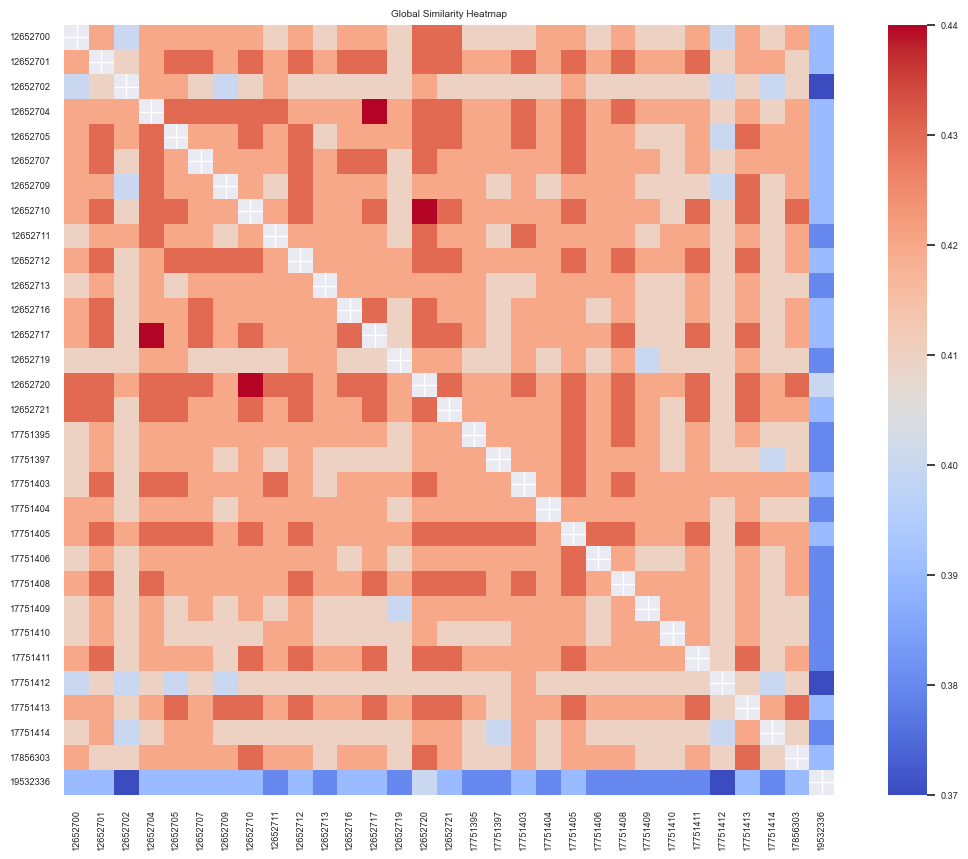

In [95]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations

# Step 1: Load Excel data into a Pandas DataFrame
excel_file = r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files_31_mody/COVERED_TSV/Covered_new/final_CHROM_POS/OUTPUT_data_map/Global_31_samples_variants_concatenated.xlsx'
df = pd.read_excel(excel_file)

# Step 2: Define a function to calculate Jaccard similarity
def jaccard_similarity(column1, column2):
    set1 = set(column1.dropna())  # Remove missing values and create a set
    set2 = set(column2.dropna())
    intersection = len(set1.intersection(set2))
    union = len(set1) + len(set2) - intersection
    if union == 0:
        return 0  # Handle the case where both sets are empty
    return intersection / union

# Step 3: Create a matrix to store Jaccard similarity scores
num_columns = len(df.columns)
jaccard_matrix = pd.DataFrame(index=df.columns, columns=df.columns)

# Step 4 and 5: Calculate and populate the similarity matrix
for col1, col2 in combinations(df.columns, 2):
    similarity = jaccard_similarity(df[col1], df[col2])
    jaccard_matrix.at[col1, col2] = similarity
    jaccard_matrix.at[col2, col1] = similarity  # Since Jaccard similarity is symmetric

# Step 6: Create a heatmap
plt.figure(figsize=(14, 10))
sns.set(font_scale=0.6)  # Decrease the font size
sns.heatmap(jaccard_matrix.astype(float).round(2), cmap="coolwarm", square=True)

# Show the heatmap
plt.title('Global Similarity Heatmap')
plt.savefig(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files_31_mody/COVERED_TSV/Covered_new/final_CHROM_POS/OUTPUT_data_map/new_Global_Similarity_Heatmap.svg', dpi=450, bbox_inches='tight')
plt.show()

In [1]:
# Actual labels
actual_labels = [1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

# Model predictions
predicted_labels = [1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

# Initialize counters for TP, TN, FP, and FN
TP = 0
TN = 0
FP = 0
FN = 0

# Calculate TP, TN, FP, FN
for actual, predicted in zip(actual_labels, predicted_labels):
    if actual == 1 and predicted == 1:
        TP += 1
    elif actual == 0 and predicted == 0:
        TN += 1
    elif actual == 0 and predicted == 1:
        FP += 1
    elif actual == 1 and predicted == 0:
        FN += 1

# Print the results
print("True Positives (TP):", TP)
print("True Negatives (TN):", TN)
print("False Positives (FP):", FP)
print("False Negatives (FN):", FN)


True Positives (TP): 2
True Negatives (TN): 7
False Positives (FP): 0
False Negatives (FN): 1


In [4]:
import pandas as pd
vcf = pd.read_csv(r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files_31_mody/COVERED_TSV/Covered_new/12652700_Depth.tsv', sep = '\t')
#vcf.columns = ['CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT', 'SAMPLE']
vcf

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,GT,GQ,SDP,DP,RD,AD,FREQ,PVAL,RDF,RDR,ADF,ADR
0,chr1,69511,rs2691305,A,G,.,PASS,ADP=525;WT=0;HET=0;HOM=1;NC=0;ASP;G5;GENEINFO=...,1/1,255,528,525,0,524,99.81%,1.345600e-314,0,0,366,158
1,chr1,826893,rs3115849,G,A,.,PASS,"ADP=294;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.2682,0...",0/1,255,296,294,210,84,28.57%,4.997300e-29,66,144,25,59
2,chr1,827092,rs145493205,C,T,.,PASS,ADP=267;WT=0;HET=1;HOM=0;NC=0;ASP;GENEINFO=LIN...,0/1,255,267,267,178,89,33.33%,2.319100e-31,101,77,51,38
3,chr1,827105,rs12095200,C,A,.,PASS,"ADP=264;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.8339,0...",0/1,255,268,264,180,84,31.82%,1.937300e-29,111,69,55,29
4,chr1,941119,rs4372192,A,G,.,PASS,"ADP=25;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.08686,0...",1/1,141,25,25,0,25,100%,7.910700e-15,0,0,20,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44343,chrY,11986732,rs867343413,C,T,.,PASS,ADP=8;WT=0;HET=0;HOM=1;NC=0;ASP;RS=867343413;R...,1/1,31,9,8,1,7,87.5%,6.993000e-04,1,0,2,5
44344,chrY,56961138,.,A,G,.,PASS,ADP=173;WT=0;HET=1;HOM=0;NC=0;CSQ=G|intergenic...,0/1,255,173,173,85,88,50.87%,8.898700e-34,29,56,33,55
44345,chrY,56961295,.,G,T,.,PASS,ADP=131;WT=0;HET=1;HOM=0;NC=0;CSQ=T|intergenic...,0/1,255,133,131,62,69,52.67%,7.041900e-27,29,33,36,33
44346,chrY,57128393,.,G,C,.,PASS,ADP=669;WT=0;HET=1;HOM=0;NC=0;CSQ=C|splice_pol...,0/1,255,669,669,373,295,44.1%,7.317900e-108,313,60,231,64


In [5]:
gene_name = 'HNF1A'
filtered_data = vcf[vcf['INFO'].str.contains(gene_name)]
filtered_data

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,GT,GQ,SDP,DP,RD,AD,FREQ,PVAL,RDF,RDR,ADF,ADR
11172,chr12,120989017,rs1057520291,C,T,.,PASS,ADP=91;WT=0;HET=1;HOM=0;NC=0;ASP;GENEINFO=HNF1...,0/1,148,93,91,50,41,45.05%,1.275000e-15,4,46,4,37
11173,chr12,120994314,rs56348580,G,C,.,PASS,"ADP=75;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.8189,0....",0/1,151,75,75,35,40,53.33%,6.674300e-16,20,15,18,22
11174,chr12,120999418,rs1169304,T,C,.,PASS,"ADP=106;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.223,0....",0/1,198,107,106,52,53,50%,1.486100e-20,20,32,20,33
37226,chr6,130863630,rs915172,T,G,.,PASS,"ADP=244;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.5817,....",0/1,255,246,244,125,119,48.77%,5.993000e-45,59,66,58,61


In [16]:
filtered_data[filtered_data['ID'] == 'rs1169304'].INFO

11174    ADP=106;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.223,0....
Name: INFO, dtype: object

In [3]:
vcf["Gene"] = vcf["INFO"].str.extract('GENEINFO=(?P<GENEINFO>.+?);')
#vcf['Gene Name'] = vcf['Gene_Name'].apply(lambda x: ','.join([segment.split(':')[0] for segment in x.split('|')]) if pd.notnull(x) else '')
vcf['Gene'] = vcf['Gene'].apply(lambda x: ','.join(set([segment.split(':')[0] for segment in x.split('|')])) if pd.notnull(x) else None)
vcf

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,GT,GQ,...,DP,RD,AD,FREQ,PVAL,RDF,RDR,ADF,ADR,Gene
0,chr1,69511,rs2691305,A,G,.,PASS,ADP=525;WT=0;HET=0;HOM=1;NC=0;ASP;G5;GENEINFO=...,1/1,255,...,525,0,524,99.81%,1.345600e-314,0,0,366,158,OR4F5
1,chr1,826893,rs3115849,G,A,.,PASS,"ADP=294;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.2682,0...",0/1,255,...,294,210,84,28.57%,4.997300e-29,66,144,25,59,"LINC00115,LINC01128"
2,chr1,827092,rs145493205,C,T,.,PASS,ADP=267;WT=0;HET=1;HOM=0;NC=0;ASP;GENEINFO=LIN...,0/1,255,...,267,178,89,33.33%,2.319100e-31,101,77,51,38,"LINC00115,LINC01128"
3,chr1,827105,rs12095200,C,A,.,PASS,"ADP=264;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.8339,0...",0/1,255,...,264,180,84,31.82%,1.937300e-29,111,69,55,29,"LINC00115,LINC01128"
4,chr1,941119,rs4372192,A,G,.,PASS,"ADP=25;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.08686,0...",1/1,141,...,25,0,25,100%,7.910700e-15,0,0,20,5,SAMD11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44343,chrY,11986732,rs867343413,C,T,.,PASS,ADP=8;WT=0;HET=0;HOM=1;NC=0;ASP;RS=867343413;R...,1/1,31,...,8,1,7,87.5%,6.993000e-04,1,0,2,5,None
44344,chrY,56961138,.,A,G,.,PASS,ADP=173;WT=0;HET=1;HOM=0;NC=0;CSQ=G|intergenic...,0/1,255,...,173,85,88,50.87%,8.898700e-34,29,56,33,55,None
44345,chrY,56961295,.,G,T,.,PASS,ADP=131;WT=0;HET=1;HOM=0;NC=0;CSQ=T|intergenic...,0/1,255,...,131,62,69,52.67%,7.041900e-27,29,33,36,33,None
44346,chrY,57128393,.,G,C,.,PASS,ADP=669;WT=0;HET=1;HOM=0;NC=0;CSQ=C|splice_pol...,0/1,255,...,669,373,295,44.1%,7.317900e-108,313,60,231,64,None


In [11]:
import re
# Define a regular expression to extract the gene name from the CSQ field
gene_regex = r'([\w.-]+)\|(ENSG\d+|ENSG-\d+[A-Z]?\.\d+)\|'

# Define a function to extract the gene name(s) from the INFO column
def extract_gene_name(info):
    csq_field = [field for field in info.split(';') if field.startswith('CSQ=')]
    if csq_field:
        csq_field = csq_field[0]
        matches = re.findall(gene_regex, csq_field)
        if len(set(matches)) > 1:
            return ','.join(set([match[0] for match in matches]))
        elif matches:
            return matches[0][0]
    return 'NA'

vcf['Gene_new'] = vcf['INFO'].apply(extract_gene_name)
vcf.head()

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,GT,GQ,...,DP,RD,AD,FREQ,PVAL,RDF,RDR,ADF,ADR,Gene_new
0,chr1,69511,rs2691305,A,G,.,PASS,ADP=525;WT=0;HET=0;HOM=1;NC=0;ASP;G5;GENEINFO=...,1/1,255,...,525,0,524,99.81%,1.345600e-314,0,0,366,158,OR4F5
1,chr1,826893,rs3115849,G,A,.,PASS,"ADP=294;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.2682,0...",0/1,255,...,294,210,84,28.57%,4.997300e-29,66,144,25,59,"LINC00115,LINC01128"
2,chr1,827092,rs145493205,C,T,.,PASS,ADP=267;WT=0;HET=1;HOM=0;NC=0;ASP;GENEINFO=LIN...,0/1,255,...,267,178,89,33.33%,2.319100e-31,101,77,51,38,"LINC00115,LINC01128"
3,chr1,827105,rs12095200,C,A,.,PASS,"ADP=264;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.8339,0...",0/1,255,...,264,180,84,31.82%,1.937300e-29,111,69,55,29,"LINC00115,LINC01128"
4,chr1,941119,rs4372192,A,G,.,PASS,"ADP=25;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.08686,0...",1/1,141,...,25,0,25,100%,7.910700e-15,0,0,20,5,"NOC2L,SAMD11"


In [29]:
vcf['Gene'].fillna(vcf['Gene_new'], inplace=True)
vcf = vcf.drop(columns=['Gene_new'], axis=1)
vcf

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,GT,GQ,SDP,DP,RD,AD,FREQ,PVAL,RDF,RDR,ADF,ADR,Gene
0,chr1,69511,rs2691305,A,G,.,PASS,ADP=525;WT=0;HET=0;HOM=1;NC=0;ASP;G5;GENEINFO=...,1/1,255,528,525,0,524,99.81%,1.345600e-314,0,0,366,158,OR4F5
1,chr1,826893,rs3115849,G,A,.,PASS,"ADP=294;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.2682,0...",0/1,255,296,294,210,84,28.57%,4.997300e-29,66,144,25,59,"LINC00115,LINC01128"
2,chr1,827092,rs145493205,C,T,.,PASS,ADP=267;WT=0;HET=1;HOM=0;NC=0;ASP;GENEINFO=LIN...,0/1,255,267,267,178,89,33.33%,2.319100e-31,101,77,51,38,"LINC00115,LINC01128"
3,chr1,827105,rs12095200,C,A,.,PASS,"ADP=264;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.8339,0...",0/1,255,268,264,180,84,31.82%,1.937300e-29,111,69,55,29,"LINC00115,LINC01128"
4,chr1,941119,rs4372192,A,G,.,PASS,"ADP=25;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.08686,0...",1/1,141,25,25,0,25,100%,7.910700e-15,0,0,20,5,SAMD11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44343,chrY,11986732,rs867343413,C,T,.,PASS,ADP=8;WT=0;HET=0;HOM=1;NC=0;ASP;RS=867343413;R...,1/1,31,9,8,1,7,87.5%,6.993000e-04,1,0,2,5,MXRA5Y
44344,chrY,56961138,.,A,G,.,PASS,ADP=173;WT=0;HET=1;HOM=0;NC=0;CSQ=G|intergenic...,0/1,255,173,173,85,88,50.87%,8.898700e-34,29,56,33,55,NA
44345,chrY,56961295,.,G,T,.,PASS,ADP=131;WT=0;HET=1;HOM=0;NC=0;CSQ=T|intergenic...,0/1,255,133,131,62,69,52.67%,7.041900e-27,29,33,36,33,NA
44346,chrY,57128393,.,G,C,.,PASS,ADP=669;WT=0;HET=1;HOM=0;NC=0;CSQ=C|splice_pol...,0/1,255,669,669,373,295,44.1%,7.317900e-108,313,60,231,64,VAMP7


In [28]:
df_genes = pd.read_excel(r'C:/Users/GenepoweRx_Madhu/Desktop/MODY_genes.xlsx')
df_genes

,Gene
0,HNF1A
1,CEL
2,HNF1B
3,PAX4
4,HNF4A
5,INS
6,GCK
7,BLK
8,NEUROD1
9,ABCC8


In [31]:
# Create a boolean mask for exact matches
exact_match_mask = vcf['Gene'].isin(df_genes['Gene'])

# Create a boolean mask for partial matches
partial_match_mask = vcf['Gene'].str.contains('|'.join(df_genes['Gene']))

# Combine the masks to get the desired rows
result = vcf[exact_match_mask | partial_match_mask]
result

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,GT,GQ,SDP,DP,RD,AD,FREQ,PVAL,RDF,RDR,ADF,ADR,Gene
533,chr1,15461774,rs3737696,A,C,.,PASS,"ADP=199;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.3233,0...",0/1,255,199,199,114,85,42.71%,2.542200e-31,66,48,44,41,"LOC105376767,CELA2A"
534,chr1,15461996,rs3737697,C,T,.,PASS,"ADP=123;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.7117,0...",0/1,195,123,123,69,54,43.9%,2.972100e-20,42,27,43,11,"LOC105376767,CELA2A"
535,chr1,15462135,rs7512589,G,A,.,PASS,"ADP=288;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.7117,0...",0/1,255,292,288,169,118,40.97%,6.866700e-43,122,47,58,60,"LOC105376767,CELA2A"
536,chr1,15462802,rs3815787,A,C,.,PASS,"ADP=145;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.6012,0...",0/1,255,147,145,75,70,48.28%,1.228300e-26,39,36,52,18,"LOC105376767,CELA2A"
537,chr1,15467418,rs1042010,G,A,.,PASS,"ADP=281;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.8201,0...",0/1,255,288,281,123,158,56.23%,5.780900e-62,64,59,73,85,"LOC105376767,CELA2A"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41654,chr9,5081780,rs2230724,G,A,.,PASS,"ADP=206;WT=0;HET=0;HOM=1;NC=0;ASP;CAF=0.3832,0...",1/1,255,209,206,0,206,100%,2.406700e-123,0,0,96,110,"INSL6,JAK2"
43027,chr9,133064589,rs8193019,G,A,.,PASS,"ADP=258;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.9716,0...",0/1,255,261,258,125,133,51.55%,6.524100e-51,40,85,41,92,CEL
43028,chr9,133082620,rs3827663,C,T,.,PASS,"ADP=154;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.8634,0...",0/1,233,154,154,89,65,42.21%,4.771300e-24,47,42,21,44,CELP
43029,chr9,133084415,rs1633509,A,G,.,PASS,"ADP=76;WT=0;HET=1;HOM=0;NC=0;ASP;CAF=0.9032,0....",0/1,70,76,76,55,21,27.63%,9.593900e-08,53,2,16,5,CELP


In [ ]:
vcf_new = 

In [37]:
import os
import pandas as pd

# Define the path to the folder containing your TSV files
folder_path = r'C:/Users/GenepoweRx_Madhu/Downloads/Depth_files_31_mody/COVERED_TSV/Covered_new/'

# Load the list of target genes (assuming you have already loaded it)
# Replace 'target_genes.txt' with the path to your gene list file
target_genes_file_path = r'C:/Users/GenepoweRx_Madhu/Downloads/14_genes_text.txt'

with open(target_genes_file_path, 'r') as gene_file:
    target_genes = [line.strip() for line in gene_file]

# Iterate through all files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.tsv'):
        # Construct the full path to the TSV file
        tsv_file_path = os.path.join(folder_path, filename)
        
        # Load the TSV file into a Pandas DataFrame
        df = pd.read_csv(tsv_file_path, sep='\t')
        
        # Filter the DataFrame based on the target genes in the INFO column (7th column)
        filtered_df = df[df['INFO'].str.contains('|'.join(target_genes))]

        # Create separate files for each gene
        for gene in target_genes:
            # Filter rows for the current gene
            gene_df = filtered_df[filtered_df['INFO'].str.contains(gene)]
            
            # Extract sample columns (assuming sample columns start from column 9)
            sample_columns = gene_df.iloc[:, 9:]
            
            # Create a new DataFrame for the gene with samples
            gene_output_df = pd.concat([gene_df[['INFO']], sample_columns], axis=1)
            
            # Define the output file path for the current gene
            gene_output_file_path = f'{gene}_{os.path.splitext(filename)[0]}_filtered.tsv'
            
            # Save the DataFrame to a new TSV file
            gene_output_df.to_csv(gene_output_file_path, sep='\t', index=False)

            print(f"File for gene {gene} saved to:", gene_output_file_path)


File for gene HNF1A saved to: HNF1A_12652700_Depth_filtered.tsv
File for gene CEL saved to: CEL_12652700_Depth_filtered.tsv
File for gene HNF1B saved to: HNF1B_12652700_Depth_filtered.tsv
File for gene PAX4 saved to: PAX4_12652700_Depth_filtered.tsv
File for gene HNF4A saved to: HNF4A_12652700_Depth_filtered.tsv
File for gene INS saved to: INS_12652700_Depth_filtered.tsv
File for gene GCK saved to: GCK_12652700_Depth_filtered.tsv
File for gene BLK saved to: BLK_12652700_Depth_filtered.tsv
File for gene NEUROD1 saved to: NEUROD1_12652700_Depth_filtered.tsv
File for gene ABCC8 saved to: ABCC8_12652700_Depth_filtered.tsv
File for gene PDX1 saved to: PDX1_12652700_Depth_filtered.tsv
File for gene KCNJ11 saved to: KCNJ11_12652700_Depth_filtered.tsv
File for gene KLF11 saved to: KLF11_12652700_Depth_filtered.tsv
File for gene APPL1 saved to: APPL1_12652700_Depth_filtered.tsv
File for gene HNF1A saved to: HNF1A_12652701_Depth_filtered.tsv
File for gene CEL saved to: CEL_12652701_Depth_filtere

File for gene HNF1A saved to: HNF1A_12652713_Depth_filtered.tsv
File for gene CEL saved to: CEL_12652713_Depth_filtered.tsv
File for gene HNF1B saved to: HNF1B_12652713_Depth_filtered.tsv
File for gene PAX4 saved to: PAX4_12652713_Depth_filtered.tsv
File for gene HNF4A saved to: HNF4A_12652713_Depth_filtered.tsv
File for gene INS saved to: INS_12652713_Depth_filtered.tsv
File for gene GCK saved to: GCK_12652713_Depth_filtered.tsv
File for gene BLK saved to: BLK_12652713_Depth_filtered.tsv
File for gene NEUROD1 saved to: NEUROD1_12652713_Depth_filtered.tsv
File for gene ABCC8 saved to: ABCC8_12652713_Depth_filtered.tsv
File for gene PDX1 saved to: PDX1_12652713_Depth_filtered.tsv
File for gene KCNJ11 saved to: KCNJ11_12652713_Depth_filtered.tsv
File for gene KLF11 saved to: KLF11_12652713_Depth_filtered.tsv
File for gene APPL1 saved to: APPL1_12652713_Depth_filtered.tsv
File for gene HNF1A saved to: HNF1A_12652716_Depth_filtered.tsv
File for gene CEL saved to: CEL_12652716_Depth_filtere

File for gene HNF1A saved to: HNF1A_17751405_Depth_filtered.tsv
File for gene CEL saved to: CEL_17751405_Depth_filtered.tsv
File for gene HNF1B saved to: HNF1B_17751405_Depth_filtered.tsv
File for gene PAX4 saved to: PAX4_17751405_Depth_filtered.tsv
File for gene HNF4A saved to: HNF4A_17751405_Depth_filtered.tsv
File for gene INS saved to: INS_17751405_Depth_filtered.tsv
File for gene GCK saved to: GCK_17751405_Depth_filtered.tsv
File for gene BLK saved to: BLK_17751405_Depth_filtered.tsv
File for gene NEUROD1 saved to: NEUROD1_17751405_Depth_filtered.tsv
File for gene ABCC8 saved to: ABCC8_17751405_Depth_filtered.tsv
File for gene PDX1 saved to: PDX1_17751405_Depth_filtered.tsv
File for gene KCNJ11 saved to: KCNJ11_17751405_Depth_filtered.tsv
File for gene KLF11 saved to: KLF11_17751405_Depth_filtered.tsv
File for gene APPL1 saved to: APPL1_17751405_Depth_filtered.tsv
File for gene HNF1A saved to: HNF1A_17751406_Depth_filtered.tsv
File for gene CEL saved to: CEL_17751406_Depth_filtere

File for gene BLK saved to: BLK_17856303_Depth_filtered.tsv
File for gene NEUROD1 saved to: NEUROD1_17856303_Depth_filtered.tsv
File for gene ABCC8 saved to: ABCC8_17856303_Depth_filtered.tsv
File for gene PDX1 saved to: PDX1_17856303_Depth_filtered.tsv
File for gene KCNJ11 saved to: KCNJ11_17856303_Depth_filtered.tsv
File for gene KLF11 saved to: KLF11_17856303_Depth_filtered.tsv
File for gene APPL1 saved to: APPL1_17856303_Depth_filtered.tsv
File for gene HNF1A saved to: HNF1A_19532336_Depth_filtered.tsv
File for gene CEL saved to: CEL_19532336_Depth_filtered.tsv
File for gene HNF1B saved to: HNF1B_19532336_Depth_filtered.tsv
File for gene PAX4 saved to: PAX4_19532336_Depth_filtered.tsv
File for gene HNF4A saved to: HNF4A_19532336_Depth_filtered.tsv
File for gene INS saved to: INS_19532336_Depth_filtered.tsv
File for gene GCK saved to: GCK_19532336_Depth_filtered.tsv
File for gene BLK saved to: BLK_19532336_Depth_filtered.tsv
File for gene NEUROD1 saved to: NEUROD1_19532336_Depth_fil

In [8]:
import pandas as pd

# Example DataFrame
data = {'ID': [1, 2, 3],
        'Column1': ['A;B;C', 'C;D', 'D'],
        'Column2': ['X;Y;z', 'Z;w', 'W'],
        'Column3': ['P;Q;R', 'R;S', 'U']}
df = pd.DataFrame(data)
df

,ID,Column1,Column2,Column3
0,1,A;B;C,X;Y;z,P;Q;R
1,2,C;D,Z;w,R;S
2,3,D,W,U


In [9]:
# Split the values in the three columns on ';'
df['Column1'] = df['Column1'].str.split(';')
df['Column2'] = df['Column2'].str.split(';')
df['Column3'] = df['Column3'].str.split(';')

# Explode the lists in the three columns into separate rows
df = df.explode('Column1').explode('Column2').explode('Column3')

# Reset the index
df.reset_index(drop=True, inplace=True)

# Print the resulting DataFrame
df

,ID,Column1,Column2,Column3
0,1,A,X,P
1,1,A,X,Q
2,1,A,X,R
3,1,A,Y,P
4,1,A,Y,Q
5,1,A,Y,R
6,1,A,z,P
7,1,A,z,Q
8,1,A,z,R
9,1,B,X,P
